### Imports

In [5]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pickle

import seaborn as sns
sns.set_context('notebook', font_scale=1.5, rc={'lines.markeredgewidth': 1})

In [6]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


AttributeError: module 'matplotlib' has no attribute 'backend_bases'

In [ ]:
# visual_behavior_analysis package functions
import visual_behavior.visualization.utils as utils
import visual_behavior.data_access.loading as loading
import visual_behavior.data_access.utilities as utilities
import visual_behavior.visualization.ophys.glm_example_plots as gep

from visual_behavior.dimensionality_reduction.clusering import plotting # functions to plot clusters
from visual_behavior.dimensionality_reduction.clustering import processing # function for computing and validating clusters

import visual_behavior.visualization.ophys.platform_paper_figures as ppf
import visual_behavior.visualization.ophys.platform_single_cell_examples as pse

[autoreload of numpy.core.multiarray failed: Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 273, in check
    superreload(m, reload, self.old_objects)
  File "/opt/conda/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 471, in superreload
    module = reload(module)
  File "/opt/conda/lib/python3.9/importlib/__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 613, in _exec
  File "<frozen importlib._bootstrap_external>", line 850, in exec_module
  File "<frozen importlib._bootstrap>", line 228, in _call_with_frames_removed
  File "/opt/conda/lib/python3.9/site-packages/numpy/core/multiarray.py", line 16, in <module>
    from ._multiarray_umath import (
ImportError: cannot import name '_from_dlpack' from 'numpy.core._multiarray_umath' (/opt/conda/lib/python3.9/site-packages/numpy/core/_multiarray_umath.cpython-39-x86_64-linux-gnu.so)

ModuleNotFoundError: No module named 'visual_behavior'

In [ ]:
# get useful information 
experience_level_colors = utils.get_experience_level_colors()
cre_line_colors = utils.get_cre_line_colors()

experience_levels = utils.get_new_experience_levels()
cell_types = utils.get_cell_types()

In [ ]:
# visual_behavior_glm package functions
import visual_behavior_glm.GLM_fit_dev as gfd
import visual_behavior_glm.GLM_analysis_tools as gat
import visual_behavior_glm.GLM_across_session as gas

## Load data

See the following notebooks to see how the files below were generated: 
* `save_filtered_metadata_tables.ipynb` 
* `figure_3_generate_analysis_files.ipynb` 
* `figure_4_generate_analysis_files.ipynb`

### Cache directory and figure saving

In [ ]:
platform_cache_dir = loading.get_platform_analysis_cache_dir()
print(platform_cache_dir)

\\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new


In [ ]:
# directory to load saved files from
data_dir = os.path.join(platform_cache_dir, 'clustering')

In [ ]:
# folder for figure saving
save_dir = r'\\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_figures_final\PaperRevision_Neuron\figure_4'

### Load metadata tables

In [ ]:
# metadata tables
experiments_table = pd.read_csv(os.path.join(platform_cache_dir, 'all_ophys_experiments_table.csv'), index_col=0)
platform_experiments = pd.read_csv(os.path.join(platform_cache_dir, 'platform_paper_ophys_experiments_table.csv'), index_col=0)
platform_cells_table = pd.read_csv(os.path.join(platform_cache_dir, 'platform_paper_ophys_cells_table.csv'), index_col=0)
matched_cells_table = pd.read_csv(os.path.join(platform_cache_dir, 'platform_paper_matched_ophys_cells_table.csv'), index_col=0)

# get lists of matched cells and expts
matched_cells = matched_cells_table.cell_specimen_id.unique()
matched_experiments = matched_cells_table.ophys_experiment_id.unique()

# get cre_lines and cell types for plot labels
cre_lines = np.sort(platform_cells_table.cre_line.unique())
cell_types = utils.get_cell_types()


In [ ]:
print(len(platform_experiments))

402


In [ ]:
print(len(platform_experiments.mouse_id.unique()), 'mice')
print(len(platform_experiments.ophys_session_id.unique()), 'sessions')
print(len(platform_experiments.ophys_container_id.unique()), 'containers')
print(len(platform_experiments.index.unique()), 'experiments')

66 mice
202 sessions
134 containers
402 experiments


In [ ]:
# we know that 5 experiments were dropped after filtering for cells matched in all 3 experience levels
# these experiments came from 2 fields of view, one in Sst and one in Vip, that only had a few cells in the imaging plane
print(len(matched_cells_table.ophys_experiment_id.unique()))
print(len(matched_cells_table.cell_specimen_id.unique()))

393
3917


In [ ]:
print(len(matched_cells_table.mouse_id.unique()), 'mice')
print(len(matched_cells_table.ophys_session_id.unique()), 'sessions')
print(len(matched_cells_table.ophys_container_id.unique()), 'containers')
print(len(matched_cells_table.index.unique()), 'experiments')

65 mice
199 sessions
131 containers
11751 experiments


#### Load GLM results for matched cells

Coding scores are normalized across sessions to each cell's maximum variance explained

In [ ]:
### GLM results ###

# define model version
glm_version = '24_events_all_L2_optimize_by_session'
 
# glm outputs
run_params = pd.read_pickle(os.path.join(platform_cache_dir, 'glm_results', glm_version+'_run_params.pkl'))

# for clustering analysis, we only want to use across session normalized coding scores
results_pivoted = pd.read_hdf(os.path.join(platform_cache_dir, 'glm_results', 'across_session_normalized_platform_results_pivoted.h5'), key='df')

all_results = pd.read_hdf(os.path.join(platform_cache_dir, 'glm_results', 'all_results.h5'), key='df')


In [ ]:
# the results pivoted table that we loaded above should only contain cells matched across sessions
# after across session normalization of dropout scores 
print(len(results_pivoted.ophys_experiment_id.unique()))
print(len(results_pivoted.cell_specimen_id.unique()))

393
3921


In [ ]:
# print(len(results_pivoted.ophys_session_id.unique()), 'sessions')
# print(len(results_pivoted.ophys_container_id.unique()), 'containers')
print(len(results_pivoted.ophys_experiment_id.unique()), 'experiments')

393 experiments


### Load clustering results

In [ ]:


### clustering results ###

# n_clusters that was used
n_clusters = 14

# clustering input
feature_matrix = pd.read_hdf(os.path.join(platform_cache_dir, 'clustering', 'clustering_feature_matrix.h5'), key='df')
feature_matrix = feature_matrix.rename(columns={'all-images':'images', 'behavioral': 'behavior'})

# clustering output
cluster_meta = pd.read_hdf(os.path.join(platform_cache_dir, 'clustering', 'cluster_metadata_'+str(n_clusters)+'_clusters.h5'), key='df')


In [ ]:
cluster_order = np.sort(cluster_meta.cluster_id.unique())

In [ ]:
cluster_order

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12], dtype=int64)

In [ ]:
print(len(cluster_meta.mouse_id.unique()), 'mice')
# print(len(cluster_meta.ophys_session_id.unique()), 'sessions')
print(len(cluster_meta.ophys_container_id.unique()), 'containers')
# print(len(cluster_meta.ophys_experiment_id.unique()), 'experiments')
print(len(cluster_meta.index.unique()), 'cells')

65 mice
131 containers
3901 cells


In [ ]:
# cluster metadata table will have 20 fewer cells than the input feature matrix because
# we remove cells for a given cre line if there are only 5 or less in a given cluster
print(len(feature_matrix))
print(len(cluster_meta))

3921
3901


In [ ]:
cluster_meta.groupby(['cre_line']).count()

,cluster_id,labels,ophys_experiment_id,behavior_session_id,ophys_session_id,ophys_container_id,mouse_id,indicator,full_genotype,driver_line,...,date,first_novel,n_relative_to_first_novel,last_familiar,last_familiar_active,second_novel,second_novel_active,experience_exposure,original_cluster_id,new_cluster_id
cre_line,,,,,,,,,,,,,,,,,,,,,
Slc17a7-IRES2-Cre,3298,3298,3298,3298,3298,3298,3298,3298,3298,3298,...,3298,3298,3298,3298,3298,3298,3298,3298,3298,3298
Sst-IRES-Cre,194,194,194,194,194,194,194,194,194,194,...,194,194,194,194,194,194,194,194,194,194
Vip-IRES-Cre,409,409,409,409,409,409,409,409,409,409,...,409,409,409,409,409,409,409,409,409,409


In [ ]:
# this also results in dropping two clusters because they last two clusters both had fewer than 5 cells of each cre line
print(n_clusters)
print(len(cluster_meta.cluster_id.unique()))

14
12


### Rename clusters & re-save cluster meta table

In [ ]:
# new_cluster_order = np.asarray(plotting.get_cluster_order())
# cluster_meta['original_cluster_id'] = cluster_meta.cluster_id.values
# cluster_meta['new_cluster_id'] = [np.where(new_cluster_order==cluster_id)[0][0]+1 for cluster_id in cluster_meta.cluster_id.values]
# cluster_meta['cluster_id'] = cluster_meta['new_cluster_id']

# # cluster_meta.to_hdf(os.path.join(platform_cache_dir, 'clustering', 'cluster_metadata_'+str(n_clusters)+'_clusters.h5'), key='df')


### Load cell response dataframes

#### Image change and repeated image responses

In [ ]:
data_type = 'events'

interpolate = True
output_sampling_rate = 30

inclusion_criteria = 'platform_experiment_table'

In [ ]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'is_change']


change_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

multi_session_df = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

# limit to changes, convert experience level and merge with cluster IDs
change_mdf = multi_session_df[multi_session_df.is_change==True]
change_mdf = change_mdf.merge(cluster_meta.reset_index()[['cell_specimen_id', 'cluster_id']], on='cell_specimen_id')

# limit to non-changes, convert experience level and merge with cluster IDs
image_mdf = multi_session_df[(multi_session_df.is_change==False)]
image_mdf = image_mdf.merge(cluster_meta.reset_index()[['cell_specimen_id', 'cluster_id']], on='cell_specimen_id')

c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


1936
loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_events_all_is_change_platform_experiment_table.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz\mean_response_df_events_all_is_change_platform_experiment_table.pkl
there are 1881 experiments in the full multi_session_df


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments


KeyboardInterrupt: 

In [ ]:
print(len(image_mdf.ophys_experiment_id.unique()))
print(len(image_mdf.cell_specimen_id.unique()))

391
3897


In [ ]:
len(cluster_meta.index.unique())

3901

#### Omission responses

In [ ]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'omitted']


change_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

omission_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

omission_mdf = omission_mdf[omission_mdf.omitted==True]
omission_mdf = omission_mdf.merge(cluster_meta.reset_index()[['cell_specimen_id', 'cluster_id']], on='cell_specimen_id')

c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


1936
loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_events_all_omitted_platform_experiment_table.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz\mean_response_df_events_all_omitted_platform_experiment_table.pkl
there are 1879 experiments in the full multi_session_df


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 401 experiments in the multi_session_df after limiting to platform experiments
there are 401 experiments after filtering for inclusion criteria -  platform_experiment_table


In [ ]:
print(len(omission_mdf.experience_level.unique()))
print(len(omission_mdf.ophys_experiment_id.unique()))
print(len(omission_mdf.cell_specimen_id.unique()))

3
392
3897


## Clustering methods

The goal of this clustering analysis is to evaluate patterns of changes in coding scores across sessions for individual neurons. Accordingly, the analysis is limited to cells that were matched across sessions with the three experience levels of interest (Familiar, Novel, Novel +). 

In [ ]:
# feature matrix should have same number of cells as matched cells table
print(len(matched_cells_table.cell_specimen_id.unique()))
print(len(feature_matrix))

3917
3921


### Selecting optimal number of clusters

1. The Gap Statistic

The Gap Statistic was developed by Tibshirani, Walther, and Hastie (the same authors of the Prediction Strength paper). It is a general-purpose tool that can be used with any clustering algorithm (like K-means).

    Logic: It compares the "within-cluster dispersion" (Wk​) of your data to the expected Wk​ of a reference dataset with no clusters (usually a uniform distribution over the same range).

    The "Gap": The Gap is the difference between the log of the reference dispersion and the log of the observed dispersion.

    Selection Rule: You choose the k that maximizes this gap. Essentially, it looks for where your data is significantly more "compact" than random noise.

    When it is used: It is applied after clustering is completed to evaluate the results.

2. The Eigen-gap Heuristic

The Eigen-gap heuristic is specific to Spectral Clustering. It is rooted in Graph Theory.

    Logic: It looks at the eigenvalues of the Laplacian matrix (L) derived from the affinity (similarity) graph of your data.

    The "Gap": In an ideal scenario where you have k perfectly separated components, the first k eigenvalues will be 0, and there will be a significant "jump" or "gap" before the (k+1)-th eigenvalue.

    Selection Rule: You choose k such that the gap λk+1​−λk​ is maximized.

When it is used: It is used during the spectral clustering process to determine how many eigenvectors to use for the final projection.

If you are using Spectral Clustering on your 3,000 observations:

    Use the Eigen-gap as a first pass to see if the similarity graph you built (using RBF or KNN) actually "sees" a clear structure.

    Use Prediction Strength (from the paper) or the Gap Statistic to validate if that structure is robust and reproducible across different samples of your data.

While the Eigen-gap tells you if the graph is well-partitioned, the Gap Statistic tells you if that partitioning is better than what you would get by chance from random points.

#### Gap statistic method

In [ ]:
# directory to load saved files from
data_dir = os.path.join(platform_cache_dir, 'clustering')

In [ ]:
metric = 'euclidean' # default distance metric
shuffle_type ='all' # default shuffle type is all shuffle (cell id and regressors)
k_max = 25 #max number of clusters to test

gap_filename = os.path.join(data_dir, 'gap_scores_{}_{}_nb20_unshuffled_to_{}.pkl'.format(metric, glm_version, shuffle_type))
with open(gap_filename, 'rb') as f:
    gap_dict = pickle.load(f)

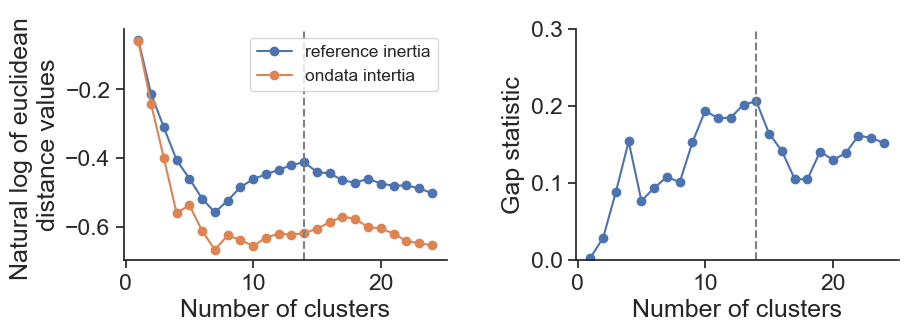

In [ ]:
# plotting.plot_gap_statistic is not autoreloading
plotting.plot_gap_statistic(gap_dict, cre_lines=['all'], n_clusters_cre=n_clusters, 
                            tag='with_cre_shuffle', save_dir=save_dir, folder='selecting_k_clusters')

#### Eigen gap method

An eigengap plot (also known as a spectral plot) is the primary tool for determining the number of clusters in Spectral Clustering. While I cannot see your specific image, eigengap analysis generally follows a specific mathematical logic regarding the eigenvalues of the Graph Laplacian

In an "ideal" dataset with k perfectly separated components (clusters that do not touch at all), the first k eigenvalues will be exactly 0.

If your plot starts with a flat line at zero for the first few indices, that count is your most likely number of clusters.

For real-world, noisy data (like your 3,000 observations), the eigenvalues will rarely be exactly zero. Instead, they will start small and gradually increase.

The Heuristic: Look for the largest "jump" or "gap" between two consecutive eigenvalues (λi​ and λi+1​).
                                                                                             
The Rule: If the largest gap occurs between λk​ and λk+1​, the suggested number of clusters is k.                                                                                         

In [ ]:
# this function will run eigengap if file does not exist
eigengap = processing.load_eigengap(glm_version, feature_matrix, cre_line='all', save_dir=data_dir, k_max=25)

loading eigengap values scores from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\clustering\eigengap_24_events_all_L2_optimize_by_session_kmax25_all.pkl
done


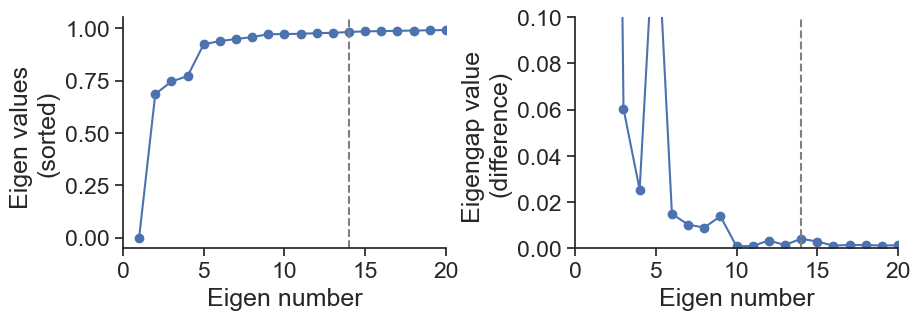

In [ ]:
plotting.plot_eigengap_values(eigengap, cre_lines=['all'], n_clusters_cre={'all':n_clusters}, save_dir=save_dir, folder='selecting_k_clusters')

#### Silhouette Score method

In [ ]:
n_clusters_range = np.arange(3, 25)
metric='euclidean'
n_boots=20

silhouette_filename= os.path.join(data_dir, 'silhouette_score_{}_{}_clusters_metric_{}_nboots_{}.pkl'.format(n_clusters_range[0], n_clusters_range[-1], metric, n_boots))
if os.path.exists(silhouette_filename):
    with open(silhouette_filename, 'rb') as f:
        silhouette_scores, silhouette_std = pickle.load(f)

<AxesSubplot:xlabel='Number of clusters', ylabel='Silhouette score'>

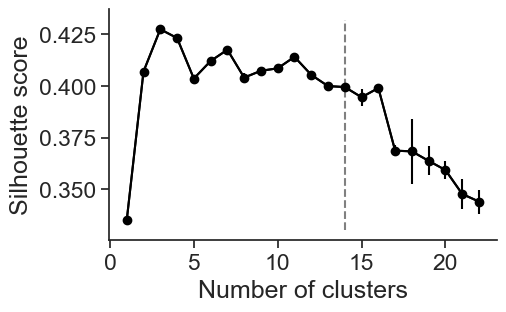

In [ ]:
plotting.plot_silhouette_scores(silhouette_scores=silhouette_scores, silhouette_std=silhouette_std, 
                                n_clusters=n_clusters, save_dir=save_dir, folder='selecting_k_clusters')

### Cluster selection control 

Based on reviewer comments: 
"2.	The selection of the number of clusters that best capture variability in the data is a notoriously hard problem and the method chosen by the authors is sound. However, I'd like to see whether cross-validated alternative methods produce the same results. In Fig S17, the authors cross-validate their cluster selection, such as comparing cluster assignments in training and test sets as explained in Tibshirani and Walther, 2005. Since clustering is a central result in the paper, having independent methods confirm the number of clusters and memberships would strengthen the results."

Tibshirani & Walther, 2005 method: 
-	Split cells into training and test sets (50% in each)
-	Iterate K from 1 to 20 (top number doesn’t really matter, just bigger than 12)
-	For each K, run our clustering algorithm on both the training and test sets
-   Get the co clustering probability matrix for each set 
-   Ask how far each data point in test set is from centroids computed from clustering training set 
-   Or, compute co-clustering matrix on test set using centroids / polygons from training set 
For each pair of test observations that are assigned
to the same test cluster, we determine whether they are also assigned to the same cluster
based on the training centers.

For each test cluster, we compute the proportion of observation pairs in that cluster that are
also assigned to the same cluster by the training set centroids. The prediction strength is the
minimum of this quantity over the k test cluster

-	Compute the “prediction strength” metric from the Tibshirani paper to assess how well the clustering from the training set agrees with the clustering from the test set. 
min(1/n_observations in cluster k(n_observations in cluster k -1)


-	Select K which maximizes the prediction strength metric. 


"The main idea of this article is to 
* (1) cluster the test data into k clusters; 
* (2) cluster the training data into k clusters, and then  
* (3) measure how well the training set cluster centers predict co-memberships in the test set. 

For each pair of test observations that are assigned to the same test cluster, we determine whether they are also assigned to the same cluster based on the training centers"

In [ ]:
# # original versions
# sklearn==1.2.2
# threadpoolctl==2.2.0

# # new versions 
# sklearn==1.3.2
# threadpoolctl==3.5.0


In [ ]:
# pip install --upgrade threadpoolctl

In [ ]:
# pip install --upgrade scikit-learn

#### Define functions for KMeans version

In [ ]:
def get_train_test_predict_labels_KMeans(feature_matrix, n_clusters, iteration=42):
    '''
    Run clustering on train and test sets, then predict the labels in the test set using the training set model
    i.e. for each cell in the test set, find the nearest centroid in the training set and assign to that cluster

    iteration is used as the random seed to ensure that edifferent splits are selected if using bootstrapping
    '''
    from sklearn.cluster import KMeans
    from sklearn.model_selection import train_test_split

    # 1. Assign coding scores over sessions to X (~3000 observations, 9 features)
    # Use only the cells that got included in the final clusters (removing cells that fell into clusters with <5 cells)
    # X = feature_matrix.loc[cluster_meta.index.values].copy()
    # print(len(X))
    X = feature_matrix.copy()
    # print(len(X))

    # 2. Split into Training (1500) and Test (1500) sets
    X_train, X_test = train_test_split(X, test_size=0.5, random_state=iteration)

    # 3. Fit KMeans on the Training Set only
    # This calculates the cluster centers (centroids)
    model_train = KMeans(n_clusters=n_clusters, random_state=iteration, n_init=10)
    model_train.fit(X_train)

    # Get the labels from model fit on training data
    train_labels = model_train.labels_

    # Retrieve the centers derived from training
    train_centers = model_train.cluster_centers_
    # print(f"Training centers identified for {n_clusters} clusters.")

    # 4. Classify (Predict) the Test Data using the Training centers
    # The .predict() method assigns each point in X_test to the nearest train_center
    test_predictions = model_train.predict(X_test)
    # print("First 10 predictions for test data:", test_predictions[:10])

    # --- To calculate Prediction Strength, you would then: ---
    # 5. Cluster the Test Data independently
    model_test = KMeans(n_clusters=n_clusters, random_state=iteration, n_init=10)
    test_labels = model_test.fit_predict(X_test)

    # print("First 10 labels for test data:", test_labels[:10])

    # 6. Compare 'test_predictions' with 'test_labels' 
    # to see if pairs in the same 'test_label' group also share the same 'test_prediction'.
    # Instead of iterating through every possible pair (which is slow for 3,000 observations), 
    # it uses the combinatorial property that the number of pairs sharing a label is ∑(2ni​​).

    return X_train, X_test, train_labels, test_labels, test_predictions

X_train, X_test, train_labels, test_labels, test_predictions = get_train_test_predict_labels_KMeans(feature_matrix, n_clusters=6)


In [ ]:
def get_prediction_strength(test_labels, test_predictions):
    """
    Computes the prediction strength for a given clustering.
    
    Args:
        test_labels: Labels obtained by clustering the test set independently.
        test_predictions: Labels obtained by assigning test data to 
                          training set centroids.
    Returns:
        Prediction strength (float).
    """
    from scipy.special import comb

    unique_test_clusters = np.unique(test_labels)
    k = len(unique_test_clusters)
    
    # Handle the k=1 case as defined in the paper
    if k == 1:
        return 1.0
    
    strengths = []
    
    for cluster_num in unique_test_clusters:
        # 1. Identify indices of points in the current test cluster j
        indices = np.where(test_labels == cluster_num)[0]
        n_cells_in_test_cluster = len(indices)
        # print(n_cells_in_test_cluster, 'cells in test cluster', cluster_num)
        
        if n_cells_in_test_cluster <= 2:
            strengths.append([cluster_num, 0])
            continue
            
        # 2. Within this test cluster, see how many points fall 
        # into each predicted (training-derived) cluster
        pred_in_cluster = test_predictions[indices]
        cluster_ids, counts = np.unique(pred_in_cluster, return_counts=True)
        # print('n_cells per predicted cluster:', cluster_ids, counts)
        
        # 3. Calculate number of pairs that share the same predicted label
        # Sum of binom(count, 2) for each predicted group found in test cluster j
        # which is the number of pairwise combinations that match in the predicted clusters
        # This is somewhat similar to the co-clustering probability - whether the cell pair falls into the same cluster
        # for test and predicted models, rather than whether it falls into the same cluster on repeated cluster iterations
        same_predict_pairs = np.sum(comb(counts, 2))
        # It doesnt matter whether the predicted pairs fall into the same cluster ID as in the test data, 
        # just that they are co-clustered together again in the predicted data
        # If the cell pairs fall into many clusters in the predicted data, that means they didnt co-cluster at the same rate as in the test data

        # 4. Calculate total possible pairs in test cluster j
        total_pairs = comb(n_cells_in_test_cluster, 2)
        # print('there are ', same_predict_pairs, 'pairs that fall into the same cluster in the predicted data')
        # print('and', total_pairs, 'pairs in the same cluster in the test data')
        
        # 5. Proportion for this specific cluster
        # strengths.append(same_predict_pairs / total_pairs)
        strength = same_predict_pairs / total_pairs
        # print(np.round(strength, 3)*100, 'percent of pairs in test cluster', cluster_num, 'also fall into the same cluster in the predicted test data')
        strengths.append([cluster_num, strength])
            
    # Prediction strength is the minimum across all clusters
    return pd.DataFrame(strengths, columns=['cluster_number', 'prediction_strength'])

# Example usage with your data:
ps_scores = get_prediction_strength(test_labels, test_predictions)
ps_score = np.min(ps_scores.prediction_strength.values)
print('*******')
print(f"minimum Prediction Strength: {ps_score:.4f}")

*******
minimum Prediction Strength: 0.0000


In [ ]:
import scipy.stats as stats

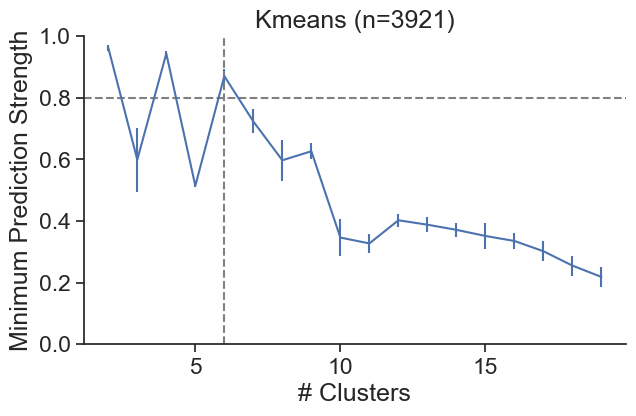

In [ ]:
X = feature_matrix.copy()
# X = feature_matrix.loc[cluster_meta.index.values].copy()

n_iterations = 5
range_of_k = range(2, 20)

pred_strengths = []
sems = []
ps_scores_df = pd.DataFrame()
for n_clusters in range_of_k:
    # print('n_clusters:', n_clusters)
    min_scores = []
    for iteration in range(n_iterations): 
        X_train, X_test, train_labels, test_labels, test_predictions = get_train_test_predict_labels_KMeans(X,
                                                                    n_clusters=n_clusters, iteration=iteration)
        ps_scores = get_prediction_strength(test_labels, test_predictions)
        min_scores.append(np.min(ps_scores.prediction_strength.values))
        ps_scores['n_clusters'] = n_clusters
        ps_scores['iteration'] = iteration
        ps_scores_df = pd.concat([ps_scores_df, ps_scores])
    # average and sem across iterations
    mean_ps_score = np.mean(min_scores)
    sem = stats.sem(min_scores)
    # aggregate for each k 
    pred_strengths.append(mean_ps_score)
    sems.append(sem)

fig, ax = plt.subplots(figsize=(7,4))
ax.errorbar(range_of_k, pred_strengths, yerr=sems)
ax.set_ylim(0,1)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Minimum Prediction Strength')
ax.set_title('Kmeans (n='+str(len(X))+')')
ax.axhline(y=0.8, xmin=0, xmax=1, linestyle='--', color='gray')
selected_k = range_of_k[np.where(np.asarray(pred_strengths)+np.asarray(sems)>0.8)[0][-1]]
ax.axvline(x=selected_k, ymin=0, ymax=1, linestyle='--', color='gray')

In [ ]:
def get_prediction_strengths(X, n_iterations=5, max_n_clusters=20,):
    range_of_k = range(2, max_n_clusters)
    pred_strengths = []
    sems = []
    ps_scores_df = pd.DataFrame()
    for n_clusters in range_of_k:
        # print('n_clusters:', n_clusters)
        min_scores = []
        for iteration in range(n_iterations): 
            X_train, X_test, train_labels, test_labels, test_predictions = get_train_test_predict_labels_KMeans(X,
                                                                        n_clusters=n_clusters, iteration=iteration)
            ps_scores = get_prediction_strength(test_labels, test_predictions)
            min_scores.append(np.min(ps_scores.prediction_strength.values))
            ps_scores['n_clusters'] = n_clusters
            ps_scores['iteration'] = iteration
            ps_scores_df = pd.concat([ps_scores_df, ps_scores])
    return ps_scores_df


X = feature_matrix.copy()
# X = feature_matrix.loc[cluster_meta.index.values].copy()
ps_scores_df = get_prediction_strengths(X, n_iterations=5, max_n_clusters=20)
ps_scores_df.head()

,cluster_number,prediction_strength,n_clusters,iteration
0,0,0.962060,2,0
1,1,0.994819,2,0
0,0,0.994718,2,1
1,1,0.939025,2,1
0,0,0.982878,2,2


In [ ]:
def get_mean_and_sem_ps_for_k_clusters(group, col='min'):
    import scipy.stats as stats
    sem = stats.sem(group[col].values)
    mean = np.mean(group[col].values)
    n_clusters = group.index.values[0][0]
    return pd.Series([mean, sem])

def get_mean_and_sem_across_iterations(scores_df, col='min'): 
    '''
    Use col='min' to get traditional prediction strength (min across clusters)
    or use col='mean' to get the mean prediction strength across clusters for each iteration
    '''
    # get stats for pred strength across clusters for each iteration 
    scores_df = ps_scores_df.groupby(['n_clusters', 'iteration']).describe().drop(columns=['cluster_number', 'cluster_id']) #.reset_index()
    # drop 'prediction_strength' multi-index
    scores_df.columns = scores_df.columns.droplevel(0)

    # get the average and sem of the min ps across iterations
    scores_df = scores_df.groupby(['n_clusters']).apply(get_mean_and_sem_ps_for_k_clusters, col=col)
    scores_df.columns = ['mean_ps', 'sem_ps']
    scores_df['threshold'] = scores_df['mean_ps']+scores_df['sem_ps']
    scores_df = scores_df.reset_index()
    return scores_df


min_scores_df = get_mean_and_sem_across_iterations(ps_scores_df, col='min')

mean_scores_df = get_mean_and_sem_across_iterations(ps_scores_df, col='mean')
mean_scores_df.head()

,n_clusters,mean_ps,sem_ps,threshold
0,2,0.929813,0.004354,0.934167
1,3,0.880311,0.018562,0.898873
2,4,0.903895,0.003729,0.907624
3,5,0.867130,0.012995,0.880125
4,6,0.854552,0.007775,0.862327


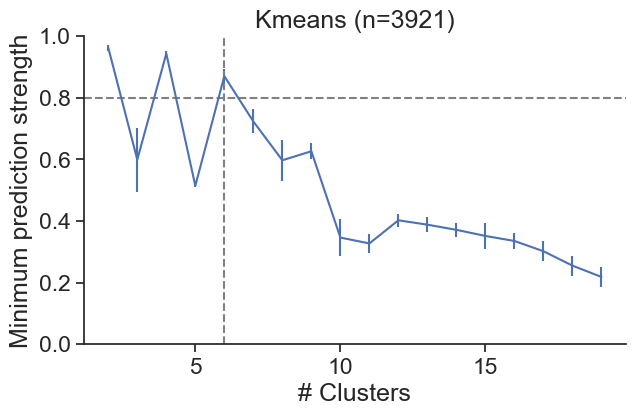

In [ ]:
range_of_k = np.sort(min_scores_df.n_clusters.unique())
pred_strengths = min_scores_df.sort_values(by=['n_clusters'])['mean_min_ps'].values
yerr = min_scores_df.sort_values(by=['n_clusters'])['sem_min_ps'].values

fig, ax = plt.subplots(figsize=(7,4))
ax.errorbar(range_of_k, pred_strengths, yerr=sems)
ax.set_ylim(0,1)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Minimum prediction strength')
ax.set_title('Kmeans (n='+str(len(X))+')')
ax.axhline(y=0.8, xmin=0, xmax=1, linestyle='--', color='gray')
# get the largest cluster that meets the threshold criterion
selected_k = min_scores_df[min_scores_df['threshold']>0.8].sort_values(by=['n_clusters'])['n_clusters'].values[-1]
# selected_k = range_of_k[np.where(np.asarray(pred_strengths)+np.asarray(sems)>0.8)[0][-1]]
ax.axvline(x=selected_k, ymin=0, ymax=1, linestyle='--', color='gray')

##### plot all together

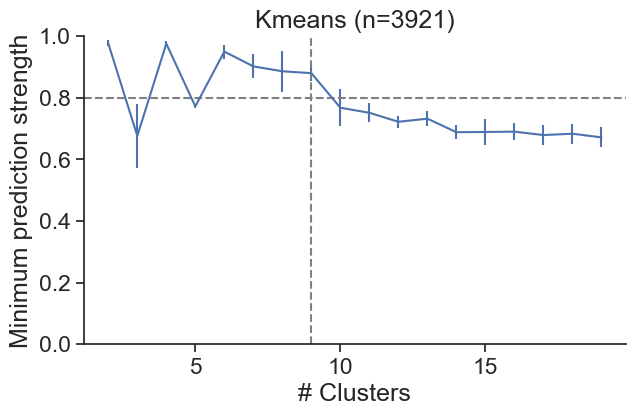

In [ ]:
X = feature_matrix.copy()
# X = feature_matrix.loc[cluster_meta.index.values].copy()

# get the prediction score for each cluster across repeated clusterings with different values of k
ps_scores_df = get_prediction_strengths(X, n_iterations=5, max_n_clusters=20)
# get average of min ps across iterations
mean_scores_df = get_mean_and_sem_across_iterations(ps_scores_df, col='mean')

range_of_k = np.sort(mean_scores_df.n_clusters.unique())
pred_strengths = mean_scores_df.sort_values(by=['n_clusters'])['mean_ps'].values
yerr = mean_scores_df.sort_values(by=['n_clusters'])['sem_ps'].values

fig, ax = plt.subplots(figsize=(7,4))
ax.errorbar(range_of_k, pred_strengths, yerr=sems)
ax.set_ylim(0,1.05)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Mean prediction strength')
ax.set_title('Kmeans (n='+str(len(X))+')')
ax.axhline(y=0.8, xmin=0, xmax=1, linestyle='--', color='gray')
# get the largest cluster that meets the threshold criterion
selected_k = mean_scores_df[mean_scores_df['threshold']>0.8].sort_values(by=['n_clusters'])['n_clusters'].values[-1]
# selected_k = range_of_k[np.where(np.asarray(pred_strengths)+np.asarray(sems)>0.8)[0][-1]]
ax.axvline(x=selected_k, ymin=0, ymax=1, linestyle='--', color='gray')

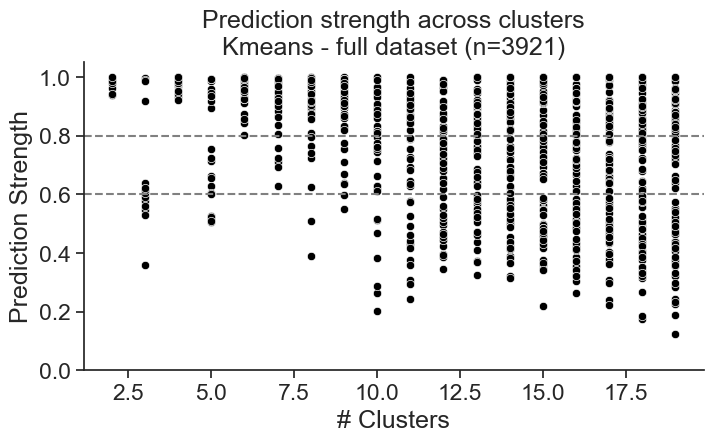

In [ ]:
fig, ax = plt.subplots(figsize=(7,4))
ax = sns.scatterplot(data=ps_scores_df, x='n_clusters', y='prediction_strength',
                   color='k', linestyle='None', ax=ax)
# ax.get_legend().remove()
ax.set_ylim(0, 1.05)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Prediction strength')
ax.set_title('Prediction strength across clusters and iterations\nKmeans (n='+str(len(X))+')')
ax.axhline(y=0.8, xmin=0, xmax=1, linestyle='--', color='gray')
ax.axhline(y=0.6, xmin=0, xmax=1, linestyle='--', color='gray')

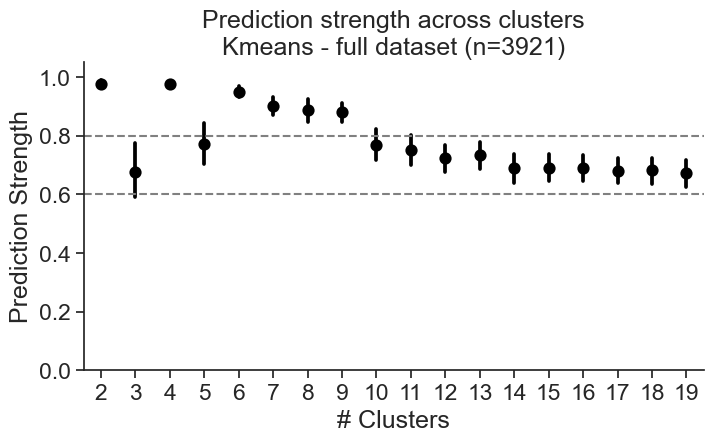

In [ ]:
fig, ax = plt.subplots(figsize=(8,4))
ax = sns.pointplot(data=ps_scores_df, x='n_clusters', y='prediction_strength',
                   color='k', linestyle='None', ax=ax)
# ax.get_legend().remove()
ax.set_ylim(0, 1.05)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Mean prediction strength')
ax.set_title('Prediction strength across clusters and iterations\nKmeans (n='+str(len(X))+')')
ax.axhline(y=0.8, xmin=0, xmax=1, linestyle='--', color='gray')
ax.axhline(y=0.6, xmin=0, xmax=1, linestyle='--', color='gray')

##### repeat for the set of cells in original clustering

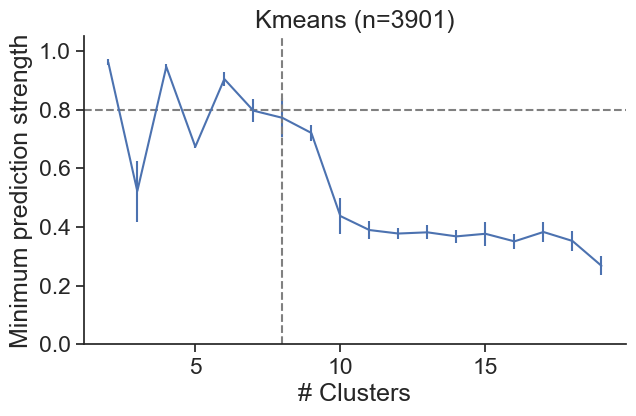

In [ ]:
X = feature_matrix.loc[cluster_meta.index.values].copy()

# get the prediction score for each cluster across repeated clusterings with different values of k
ps_scores_df = get_prediction_strengths(X, n_iterations=5, max_n_clusters=20)
# get average of min ps across iterations
min_scores_df = get_mean_and_sem_across_iterations(ps_scores_df, col='min')

range_of_k = np.sort(min_scores_df.n_clusters.unique())
pred_strengths = min_scores_df.sort_values(by=['n_clusters'])['mean_ps'].values
yerr = min_scores_df.sort_values(by=['n_clusters'])['sem_ps'].values

fig, ax = plt.subplots(figsize=(7,4))
ax.errorbar(range_of_k, pred_strengths, yerr=sems)
ax.set_ylim(0,1.05)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Minimum prediction strength')
ax.set_title('Kmeans (n='+str(len(X))+')')
ax.axhline(y=0.8, xmin=0, xmax=1, linestyle='--', color='gray')
# get the largest cluster that meets the threshold criterion
selected_k = min_scores_df[min_scores_df['threshold']>0.8].sort_values(by=['n_clusters'])['n_clusters'].values[-1]
# selected_k = range_of_k[np.where(np.asarray(pred_strengths)+np.asarray(sems)>0.8)[0][-1]]
ax.axvline(x=selected_k, ymin=0, ymax=1, linestyle='--', color='gray')

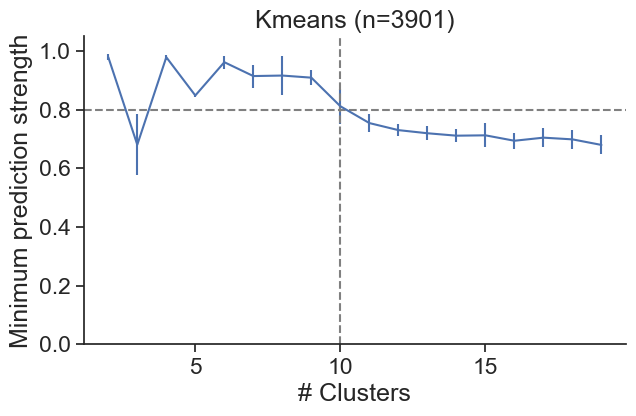

In [ ]:
# get the prediction score for each cluster across repeated clusterings with different values of k
ps_scores_df = get_prediction_strengths(X, n_iterations=5, max_n_clusters=20)
# get average of min ps across iterations
mean_scores_df = get_mean_and_sem_across_iterations(ps_scores_df, col='mean')

range_of_k = np.sort(mean_scores_df.n_clusters.unique())
pred_strengths = mean_scores_df.sort_values(by=['n_clusters'])['mean_ps'].values
yerr = mean_scores_df.sort_values(by=['n_clusters'])['sem_ps'].values

fig, ax = plt.subplots(figsize=(7,4))
ax.errorbar(range_of_k, pred_strengths, yerr=sems)
ax.set_ylim(0,1.05)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Minimum prediction strength')
ax.set_title('Kmeans (n='+str(len(X))+')')
ax.axhline(y=0.8, xmin=0, xmax=1, linestyle='--', color='gray')
# get the largest cluster that meets the threshold criterion
selected_k = mean_scores_df[mean_scores_df['threshold']>0.8].sort_values(by=['n_clusters'])['n_clusters'].values[-1]
# selected_k = range_of_k[np.where(np.asarray(pred_strengths)+np.asarray(sems)>0.8)[0][-1]]
ax.axvline(x=selected_k, ymin=0, ymax=1, linestyle='--', color='gray')

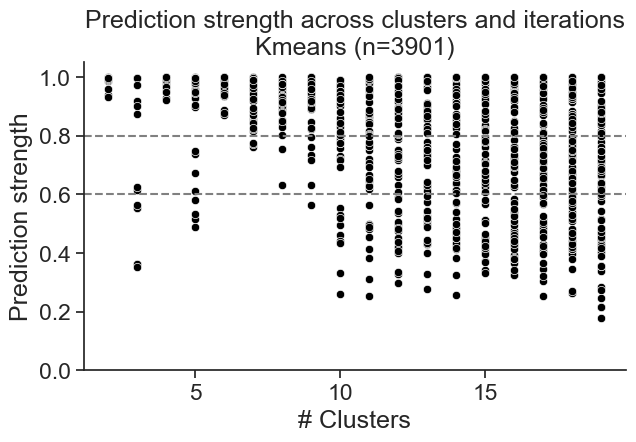

In [ ]:
fig, ax = plt.subplots(figsize=(7,4))
ax = sns.scatterplot(data=ps_scores_df, x='n_clusters', y='prediction_strength',
                   color='k', linestyle='None', ax=ax)
# ax.get_legend().remove()
ax.set_ylim(0, 1.05)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Prediction strength')
ax.set_title('Prediction strength across clusters and iterations\nKmeans (n='+str(len(X))+')')
ax.axhline(y=0.8, xmin=0, xmax=1, linestyle='--', color='gray')
ax.axhline(y=0.6, xmin=0, xmax=1, linestyle='--', color='gray')

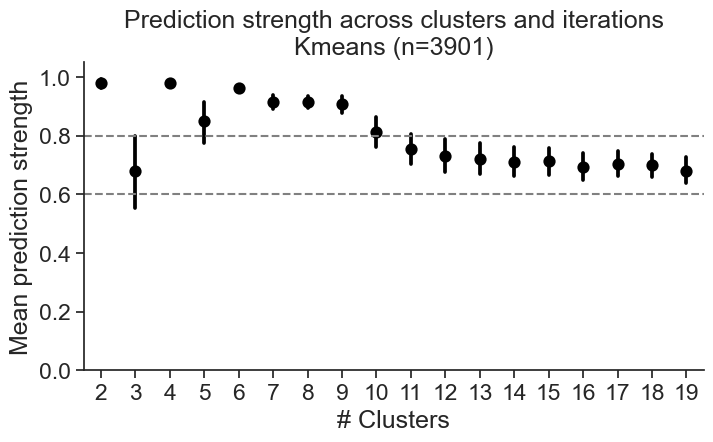

In [ ]:
fig, ax = plt.subplots(figsize=(8,4))
ax = sns.pointplot(data=ps_scores_df, x='n_clusters', y='prediction_strength',
                   color='k', linestyle='None', ax=ax)
# ax.get_legend().remove()
ax.set_ylim(0, 1.05)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Mean prediction strength')
ax.set_title('Prediction strength across clusters and iterations\nKmeans (n='+str(len(X))+')')
ax.axhline(y=0.8, xmin=0, xmax=1, linestyle='--', color='gray')
ax.axhline(y=0.6, xmin=0, xmax=1, linestyle='--', color='gray')

##### look at the clusters identified for train and test sets for this K

In [ ]:
# # Need to make a fake cluster meta for plotting function to work
# cluster_meta_train = cluster_meta.loc[X_train.index.values].copy()
# cluster_meta_train['cluster_id'] = train_labels
# cluster_meta_test = cluster_meta.loc[X_test.index.values].copy()
# cluster_meta_test['cluster_id'] = test_labels

# cluster_meta_train.head()

In [ ]:
# plotting.plot_coding_score_heatmap_matched(cluster_meta_train, X_train, sort_by='cluster_id',
#                                         session_colors=True, experience_index=None, title='training set clusters',
#                                         save_dir=None);

In [ ]:
# plotting.plot_coding_score_heatmap_matched(cluster_meta_train, X_train, sort_by='cluster_id',
#                                         session_colors=True, experience_index=None, title='test set clusters',
#                                         save_dir=None);

#### Do it for spectral clustering

Spectral Clustering is different from K-means because it doesn't naturally produce "centroids" that can be used to classify new data. In scikit-learn, the SpectralClustering class does not have a .predict() method.

To compute the Prediction Strength for Spectral Clustering, the standard approach is to treat the training cluster labels as "ground truth" and train a supervised classifier (usually a K-Nearest Neighbors (KNN) classifier) to mimic the clustering logic on the test set.

This code uses a 1-Nearest Neighbor classifier to extend the spectral labels from the training set to the test set, which is the most common way to handle "out-of-sample" prediction for this algorithm.

Why use a KNN Classifier?

Spectral clustering defines clusters based on the connectivity or similarity of points (the "Laplacian matrix"). Since this matrix is specific to the data points provided during fitting, you cannot easily "add" a new point to the graph.

By using a 1-Nearest Neighbor classifier:

    You take a point from the test set.

    Find its closest neighbor in the training set.

    Assign it the same label that the Spectral algorithm gave to that training neighbor.

This effectively approximates the "Nearest Centroid" logic used in the K-means version of the Prediction Strength metric, but it is adapted for the local-connectivity logic of Spectral Clustering.

In [ ]:
def get_train_test_predict_labels_SpectralClustering(feature_matrix, n_clusters, iteration=42, affinity='rbf'):
    '''
    Run clustering on train and test sets, then predict the labels in the test set using the training set model
    i.e. for each cell in the test set, find the nearest centroid in the training set and assign to that cluster

    iteration is the random seed to use, to make sure that different splits are selected if different iterations are run 
    '''
    from sklearn.model_selection import train_test_split
    from sklearn.cluster import SpectralClustering
    from sklearn.neighbors import KNeighborsClassifier

    # Assign coding scores over sessions to X (~3000 observations, 9 features)
    # Use only the cells that got included in the final clusters (removing cells that fell into clusters with <5 cells)
    # X = feature_matrix.loc[cluster_meta.index.values].copy()
    # print(len(X))
    X = feature_matrix.copy()

    # 1. Split into Training (1500) and Test (1500) sets
    X_train, X_test = train_test_split(X, test_size=0.5, random_state=iteration)

    # 2. Cluster the Training Set
    # In our analysis we used the default which is affinity = 'rbf' (radial basis function), example code used
    spectral_train = SpectralClustering(n_clusters=n_clusters, affinity=affinity, random_state=iteration)
    train_labels = spectral_train.fit_predict(X_train)

    # 3. Create a 'Predictor' for Spectral Clustering
    # Since Spectral has no .predict(), we train a KNN classifier on the training results
    # This creates a decision boundary based on the spectral labels.
    predictor = KNeighborsClassifier(n_neighbors=1)
    # predictor = KNeighborsClassifier(n_neighbors=10, weights='distance')
    predictor.fit(X_train, train_labels)

    # 4. Generate Test Predictions (using the classifier)
    test_predictions = predictor.predict(X_test)
    # print("First 10 predictions for test data:", test_predictions[:10])

    # 5. Cluster the Test Set independently
    spectral_test = SpectralClustering(n_clusters=n_clusters, affinity=affinity, random_state=iteration)
    test_labels = spectral_test.fit_predict(X_test)
    # print("First 10 labels for test data:", test_labels[:10])

    return X_train, X_test, train_labels, test_labels, test_predictions

# X_train, X_test, train_labels, test_labels, test_predictions = get_train_test_predict_labels_SpectralClustering(feature_matrix, n_clusters=12, iteration=42)


In [ ]:
def get_prediction_strengths(X, n_iterations=5, max_n_clusters=20, model='SpectralClustering', affinity='rbf'):
    '''
    Produce a dataframe with mean prediction strength per cluster, across n_iterations of clustering, 
    for clustering performed using a range of values for k 
 
    X: feature matrix
    max_n_clusters: max for range of cluster k values to quantify prediction strength over
    model: 'SpectralClustering' or 'KMeans'
    affinity: if using 'SpectralClustering', which method to use to construct affinity matrix (typically 'rbf' or 'nearest_neighbors') 
    '''
    range_of_k = range(2, max_n_clusters)
    ps_scores_df = pd.DataFrame()
    for n_clusters in range_of_k:
        # print('n_clusters:', n_clusters)
        for iteration in range(n_iterations): 
            if model == 'KMeans':
                X_train, X_test, train_labels, test_labels, test_predictions = get_train_test_predict_labels_KMeans(X,
                                                                            n_clusters=n_clusters, iteration=iteration)
            elif model == 'SpectralClustering':
                X_train, X_test, train_labels, test_labels, test_predictions = get_train_test_predict_labels_SpectralClustering(X,
                                                                            n_clusters=n_clusters, iteration=iteration, affinity=affinity)
            ps_scores = get_prediction_strength(test_labels, test_predictions)
            # get new cluster ID based on cluster size
            ps_scores['cluster_id'] = pd.Series(test_labels).value_counts().index
            ps_scores['n_clusters'] = n_clusters
            ps_scores['iteration'] = iteration
            ps_scores_df = pd.concat([ps_scores_df, ps_scores])
    return ps_scores_df



In [ ]:
# ps_scores_df = get_prediction_strengths(feature_matrix, n_iterations=2, max_n_clusters=6, model='SpectralClustering', affinity='rbf')

##### spectral clustering with rbf, knn=1, gamma=1 (default)

In [ ]:
X = feature_matrix.copy()
# X = feature_matrix.loc[cluster_meta.index.values].copy()

# get the prediction score for each cluster across repeated clusterings with different values of k
ps_scores_df = get_prediction_strengths(X, n_iterations=5, max_n_clusters=20, model='SpectralClustering', affinity='rbf')
ps_scores_df.head()

,cluster_number,prediction_strength,cluster_id,n_clusters,iteration
0,0,0.930734,0,2,0
1,1,0.905867,1,2,0
0,0,0.943970,1,2,1
1,1,0.935736,0,2,1
0,0,0.899728,0,2,2


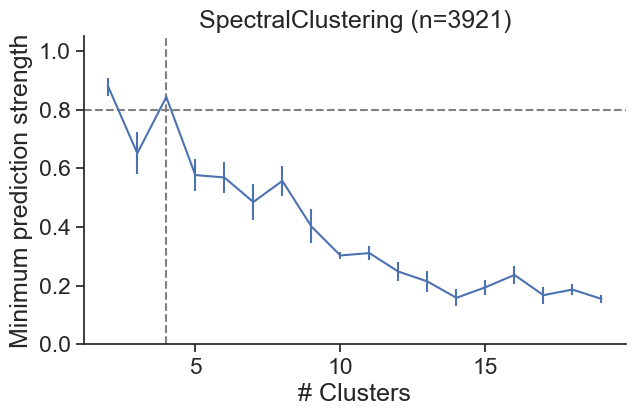

In [ ]:
# get average of min ps across iterations
min_scores_df = get_mean_and_sem_across_iterations(ps_scores_df, col='min')

range_of_k = np.sort(min_scores_df.n_clusters.unique())
pred_strengths = min_scores_df.sort_values(by=['n_clusters'])['mean_ps'].values
yerr = min_scores_df.sort_values(by=['n_clusters'])['sem_ps'].values

fig, ax = plt.subplots(figsize=(7,4))
ax.errorbar(range_of_k, pred_strengths, yerr=yerr)
ax.set_ylim(0,1.05)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Minimum prediction strength')
ax.set_title('SpectralClustering (n='+str(len(X))+')')
ax.axhline(y=0.8, xmin=0, xmax=1, linestyle='--', color='gray')
# get the largest cluster that meets the threshold criterion
selected_k = mean_scores_df[min_scores_df['threshold']>0.8].sort_values(by=['n_clusters'])['n_clusters'].values[-1]
# selected_k = range_of_k[np.where(np.asarray(pred_strengths)+np.asarray(sems)>0.8)[0][-1]]
ax.axvline(x=selected_k, ymin=0, ymax=1, linestyle='--', color='gray')

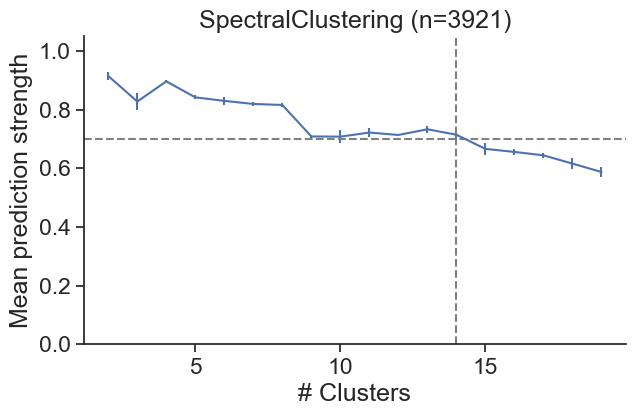

In [ ]:
# get average of min ps across iterations
mean_scores_df = get_mean_and_sem_across_iterations(ps_scores_df, col='mean')

range_of_k = np.sort(mean_scores_df.n_clusters.unique())
pred_strengths = mean_scores_df.sort_values(by=['n_clusters'])['mean_ps'].values
yerr = mean_scores_df.sort_values(by=['n_clusters'])['sem_ps'].values

fig, ax = plt.subplots(figsize=(7,4))
ax.errorbar(range_of_k, pred_strengths, yerr=yerr)
ax.set_ylim(0,1.05)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Mean prediction strength')
ax.set_title('SpectralClustering (n='+str(len(X))+')')
ax.axhline(y=0.7, xmin=0, xmax=1, linestyle='--', color='gray')
# get the largest cluster that meets the threshold criterion
selected_k = mean_scores_df[mean_scores_df['threshold']>0.7].sort_values(by=['n_clusters'])['n_clusters'].values[-1]
# selected_k = range_of_k[np.where(np.asarray(pred_strengths)+np.asarray(sems)>0.8)[0][-1]]
ax.axvline(x=selected_k, ymin=0, ymax=1, linestyle='--', color='gray')

##### check what our gamma value for clustering should be (scale param for rbf affinity matrix)

In [ ]:
from sklearn.metrics.pairwise import euclidean_distances
import numpy as np

# X is your (3000, 9) array
distances = euclidean_distances(X)

# Use the median distance as the scale parameter sigma
sigma = np.median(distances)
gamma = 1.0 / (2 * (sigma**2))

print(f"Suggested Gamma for RBF: {gamma}")

# Now use this in your SpectralClustering
# sc = SpectralClustering(n_clusters=3, affinity='rbf', gamma=gamma)

Suggested Gamma for RBF: 0.5004346145717357


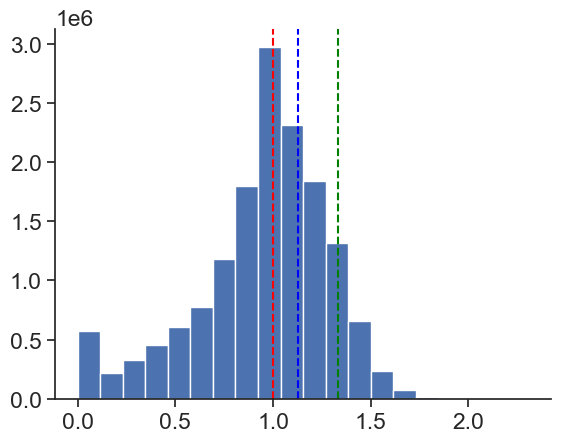

In [ ]:
distances = np.hstack(distances)
fig, ax = plt.subplots()
ax.hist(distances, bins=20)
ax.axvline(x=np.median(distances), ymin=0, ymax=1, color='r', linestyle='--')
ax.axvline(x=np.percentile(distances, 70), ymin=0, ymax=1, color='b', linestyle='--')
ax.axvline(x=np.percentile(distances, 90), ymin=0, ymax=1, color='g', linestyle='--')

##### compare min and median PS

In [ ]:
# X = feature_matrix.copy()
X = feature_matrix.loc[cluster_meta.index.values].copy()

# get the prediction score for each cluster across repeated clusterings with different values of k
ps_scores_df = get_prediction_strengths(X, n_iterations=5, max_n_clusters=20, model='SpectralClustering', affinity='rbf')
ps_scores_df.head()


,cluster_number,prediction_strength,cluster_id,n_clusters,iteration
0,0,0.921659,0,2,0
1,1,0.944488,1,2,0
0,0,0.903653,0,2,1
1,1,0.954475,1,2,1
0,0,0.854946,0,2,2


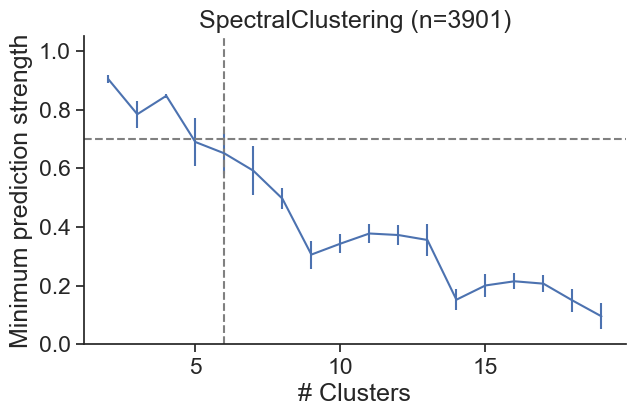

In [ ]:
# get average of min ps across iterations
min_scores_df = get_mean_and_sem_across_iterations(ps_scores_df, col='min')

range_of_k = np.sort(min_scores_df.n_clusters.unique())
pred_strengths = min_scores_df.sort_values(by=['n_clusters'])['mean_ps'].values
yerr = min_scores_df.sort_values(by=['n_clusters'])['sem_ps'].values

fig, ax = plt.subplots(figsize=(7,4))
ax.errorbar(range_of_k, pred_strengths, yerr=yerr)
ax.set_ylim(0,1.05)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Minimum prediction strength')
ax.set_title('SpectralClustering (n='+str(len(X))+')')
ax.axhline(y=0.7, xmin=0, xmax=1, linestyle='--', color='gray')
# get the largest cluster that meets the threshold criterion
selected_k = mean_scores_df[min_scores_df['threshold']>0.7].sort_values(by=['n_clusters'])['n_clusters'].values[-1]
# selected_k = range_of_k[np.where(np.asarray(pred_strengths)+np.asarray(sems)>0.8)[0][-1]]
ax.axvline(x=selected_k, ymin=0, ymax=1, linestyle='--', color='gray')

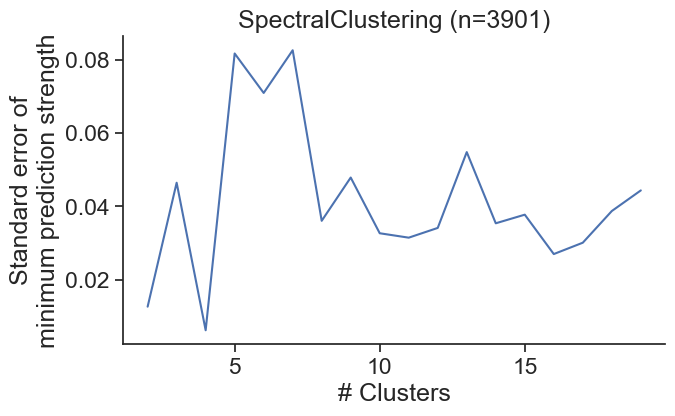

In [ ]:
# get average of min ps across iterations
min_scores_df = get_mean_and_sem_across_iterations(ps_scores_df, col='min')

range_of_k = np.sort(min_scores_df.n_clusters.unique())
pred_strengths = min_scores_df.sort_values(by=['n_clusters'])['mean_ps'].values
yerr = min_scores_df.sort_values(by=['n_clusters'])['sem_ps'].values

fig, ax = plt.subplots(figsize=(7,4))
ax.plot(range_of_k, yerr)
# ax.set_ylim(0,1.05)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Standard error of\nminimum prediction strength')
ax.set_title('SpectralClustering (n='+str(len(X))+')')
# ax.axhline(y=0.8, xmin=0, xmax=1, linestyle='--', color='gray')
# get the largest cluster that meets the threshold criterion
selected_k = mean_scores_df[min_scores_df['threshold']>0.8].sort_values(by=['n_clusters'])['n_clusters'].values[-1]
# selected_k = range_of_k[np.where(np.asarray(pred_strengths)+np.asarray(sems)>0.8)[0][-1]]
# ax.axvline(x=selected_k, ymin=0, ymax=1, linestyle='--', color='gray')

Text(0, 0.5, 'Standard error of prediction strength')

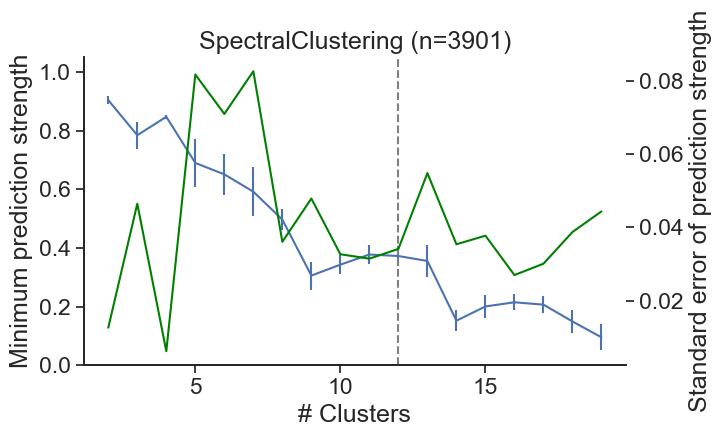

In [ ]:
# get average of min ps across iterations
min_scores_df = get_mean_and_sem_across_iterations(ps_scores_df, col='min')

range_of_k = np.sort(min_scores_df.n_clusters.unique())
pred_strengths = min_scores_df.sort_values(by=['n_clusters'])['mean_ps'].values
yerr = min_scores_df.sort_values(by=['n_clusters'])['sem_ps'].values

fig, ax = plt.subplots(figsize=(7,4))
ax.errorbar(range_of_k, pred_strengths, yerr=yerr, label='min')
ax.set_ylim(0,1.05)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Minimum prediction strength')
ax.set_title('SpectralClustering (n='+str(len(X))+')')
# ax.axhline(y=0.7, xmin=0, xmax=1, linestyle='--', color='gray')
# # get the largest cluster that meets the threshold criterion
# selected_k = mean_scores_df[min_scores_df['threshold']>0.7].sort_values(by=['n_clusters'])['n_clusters'].values[-1]
# # selected_k = range_of_k[np.where(np.asarray(pred_strengths)+np.asarray(sems)>0.8)[0][-1]]
ax.axvline(x=12, ymin=0, ymax=1, linestyle='--', color='gray')

ax2 = ax.twinx()
ax2.plot(range_of_k, yerr, color='g', label='sem')
ax2.set_ylabel('Standard error of prediction strength')

C:\Users\marinag\AppData\Local\Temp\ipykernel_19540\243288973.py:1: UserWarning: The palette list has more values (10) than needed (9), which may not be intended.
  sns.scatterplot(data=min_scores_df[min_scores_df.n_clusters.isin(range(6,15))],


<AxesSubplot:xlabel='mean_ps', ylabel='sem_ps'>

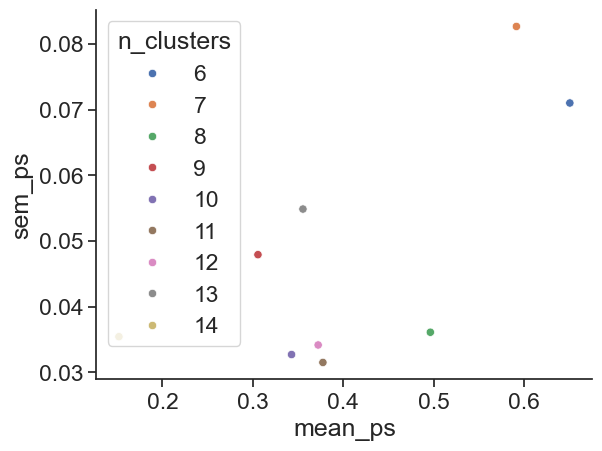

In [ ]:
sns.scatterplot(data=min_scores_df[min_scores_df.n_clusters.isin(range(6,15))], 
                x='mean_ps',  y='sem_ps', hue='n_clusters', palette=sns.color_palette())

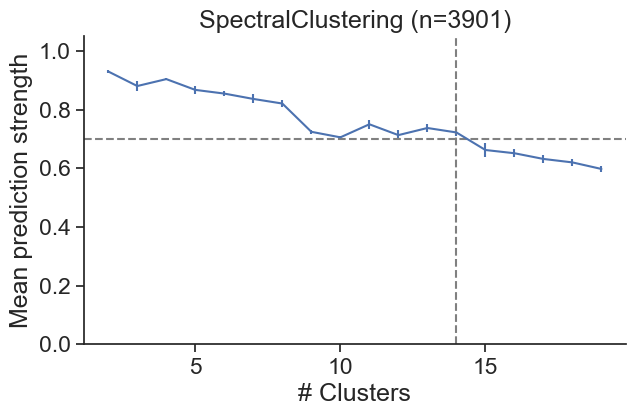

In [ ]:
# get average of mean ps across iterations
mean_scores_df = get_mean_and_sem_across_iterations(ps_scores_df, col='mean')

range_of_k = np.sort(mean_scores_df.n_clusters.unique())
pred_strengths = mean_scores_df.sort_values(by=['n_clusters'])['mean_ps'].values
yerr = mean_scores_df.sort_values(by=['n_clusters'])['sem_ps'].values

fig, ax = plt.subplots(figsize=(7,4))
ax.errorbar(range_of_k, pred_strengths, yerr=yerr)
ax.set_ylim(0,1.05)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Mean prediction strength')
ax.set_title('SpectralClustering (n='+str(len(X))+')')
ax.axhline(y=0.7, xmin=0, xmax=1, linestyle='--', color='gray')
# get the largest cluster that meets the threshold criterion
selected_k = mean_scores_df[mean_scores_df['threshold']>0.7].sort_values(by=['n_clusters'])['n_clusters'].values[-1]
# selected_k = range_of_k[np.where(np.asarray(pred_strengths)+np.asarray(sems)>0.8)[0][-1]]
ax.axvline(x=selected_k, ymin=0, ymax=1, linestyle='--', color='gray')


C:\Users\marinag\AppData\Local\Temp\ipykernel_19540\1602409305.py:3: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  ax = sns.stripplot(data=ps_scores_df, hue='iteration', palette=sns.color_palette(), dodge=True,


Text(0.5, 0, 'Number of clusters')

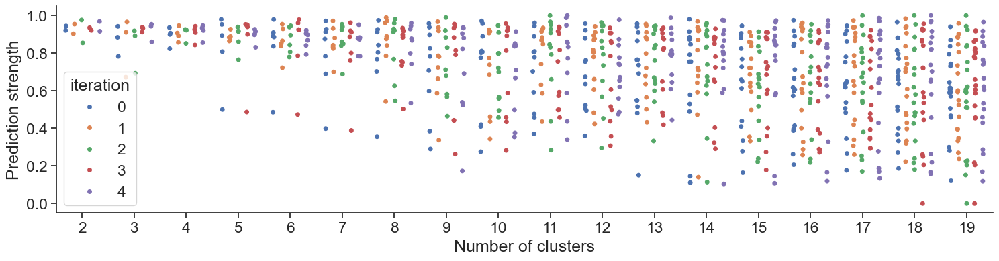

In [ ]:
# plot scores across iterations for a given k
fig, ax = plt.subplots(figsize=(18,4))
ax = sns.stripplot(data=ps_scores_df, hue='iteration', palette=sns.color_palette(), dodge=True,
                   x='n_clusters', y='prediction_strength', ax=ax)
# ax.get_legend().remove()
ax.set_ylabel('Prediction strength')
ax.set_xlabel('Number of clusters')

Text(0.5, 0, 'Iteration')

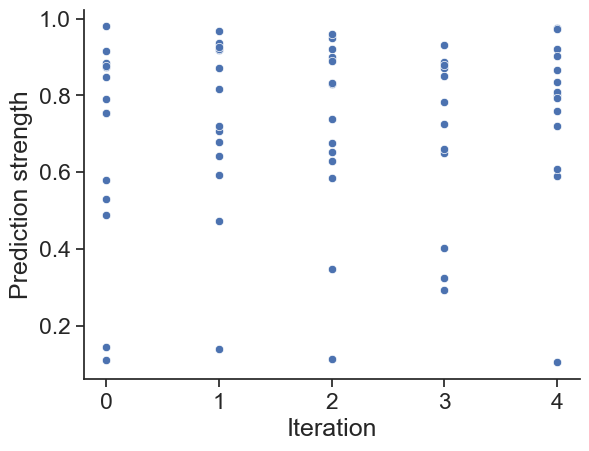

In [ ]:
# plot scores across iterations for a given k
fig, ax = plt.subplots()
ax = sns.scatterplot(data=ps_scores_df[ps_scores_df.n_clusters==14], 
                   x='iteration', y='prediction_strength', ax=ax)
# ax.get_legend().remove()
ax.set_ylabel('Prediction strength')
ax.set_xlabel('Iteration')

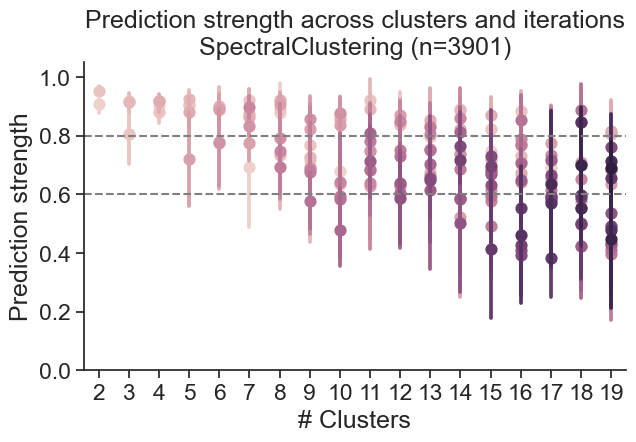

In [ ]:
# plot for all k, with hue for cluster ID
fig, ax = plt.subplots(figsize=(7,4))
ax = sns.pointplot(data=ps_scores_df, x='n_clusters', y='prediction_strength', hue='cluster_number', 
                   linestyle='None', ax=ax)
ax.get_legend().remove()
ax.set_ylim(0, 1.05)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Prediction strength')
ax.set_title('Prediction strength across clusters and iterations\nSpectralClustering (n='+str(len(X))+')')
ax.axhline(y=0.8, xmin=0, xmax=1, linestyle='--', color='gray')
ax.axhline(y=0.6, xmin=0, xmax=1, linestyle='--', color='gray')


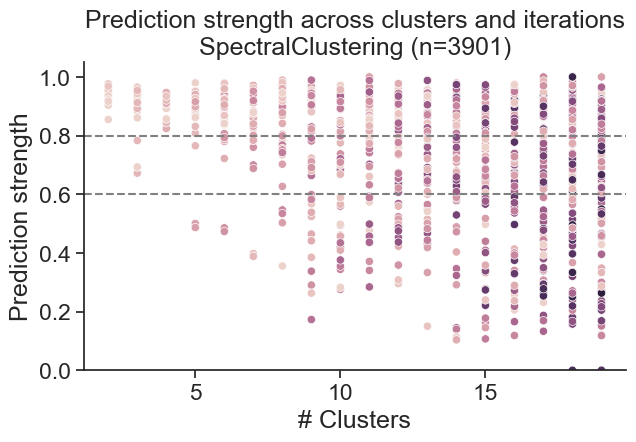

In [ ]:
# plot for all k, with hue for cluster ID
fig, ax = plt.subplots(figsize=(7,4))
ax = sns.scatterplot(data=ps_scores_df, x='n_clusters', y='prediction_strength', hue='cluster_id', 
                   linestyle='None', ax=ax)
ax.get_legend().remove()
ax.set_ylim(0, 1.05)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Prediction strength')
ax.set_title('Prediction strength across clusters and iterations\nSpectralClustering (n='+str(len(X))+')')
ax.axhline(y=0.8, xmin=0, xmax=1, linestyle='--', color='gray')
ax.axhline(y=0.6, xmin=0, xmax=1, linestyle='--', color='gray')


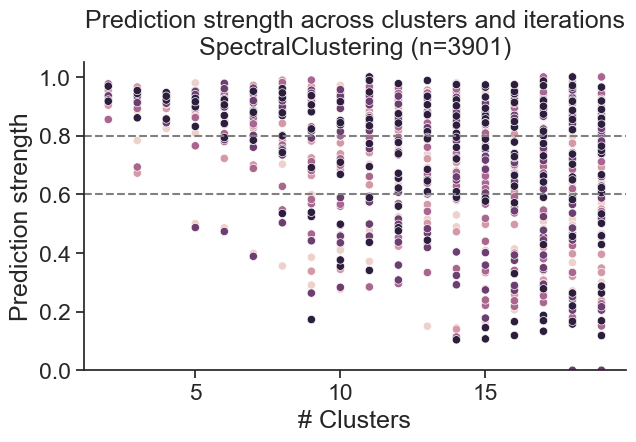

In [ ]:
fig, ax = plt.subplots(figsize=(7,4))
ax = sns.scatterplot(data=ps_scores_df, x='n_clusters', y='prediction_strength', hue='iteration', 
                   linestyle='None', ax=ax)
ax.get_legend().remove()
ax.set_ylim(0, 1.05)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Prediction strength')
ax.set_title('Prediction strength across clusters and iterations\nSpectralClustering (n='+str(len(X))+')')
ax.axhline(y=0.8, xmin=0, xmax=1, linestyle='--', color='gray')
ax.axhline(y=0.6, xmin=0, xmax=1, linestyle='--', color='gray')


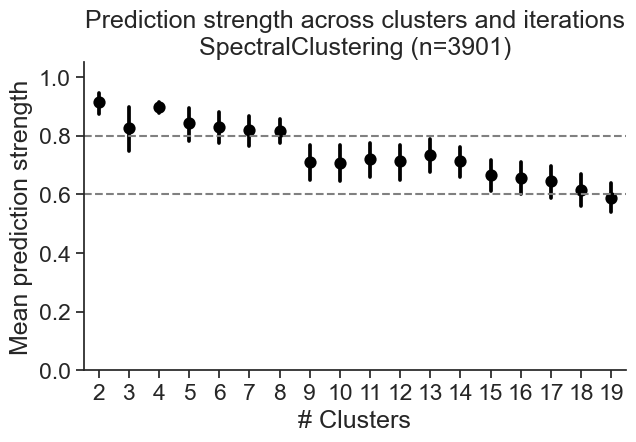

In [ ]:
fig, ax = plt.subplots(figsize=(7,4))
ax = sns.pointplot(data=ps_scores_df, x='n_clusters', y='prediction_strength',
                   color='k', linestyle='None', ax=ax)
# ax.get_legend().remove()
ax.set_ylim(0, 1.05)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Mean prediction strength')
ax.set_title('Prediction strength across clusters and iterations\nSpectralClustering (n='+str(len(X))+')')
ax.axhline(y=0.8, xmin=0, xmax=1, linestyle='--', color='gray')
ax.axhline(y=0.6, xmin=0, xmax=1, linestyle='--', color='gray')

### Problem - cluster size penalty

1. Sensitivity to Cluster Size (The "Small Cluster" Penalty)

Prediction strength is highly sensitive to cluster size, but in a very specific way.

The Minimum Rule: The metric is defined as ps(k)=min1≤j≤k​psj​, where psj​ is the strength of the jth cluster. Because it uses the minimum, the entire score for a given k is dictated by the "weakest link."

The Problem: If your data contains one large, very stable cluster and one small, slightly noisy cluster, the PS metric will report a low score. It does not matter if 90% of your data is perfectly clustered; if the remaining 10% (the small cluster) cannot be predicted reliably from the training set, the metric will suggest that k is invalid.

Implication: This makes the metric very "safe" against over-clustering, but it may cause you to under-cluster if you are looking for small, niche subgroups in a large dataset.

In short, the metric is intentionally biased towards fewer, larger, and more stable clusters. This makes it a "conservative" metric that is excellent at preventing the discovery of "clusters" that are actually just noise.

**solution**  
Because small clusters	Can drive the total score down unfairly, you can evaluate the score for each cluster individually.

2. Lower the Threshold

The authors suggest a threshold of 0.8 to 0.9 for "well-separated" clusters. However, for smaller clusters or datasets with more overlap (common in 9-feature real-world data), these thresholds may be too conservative.

The Fix: Consider a lower threshold (e.g., 0.6 or 0.7) as your cut-off, but only if the standard error is very small. If a small cluster is consistently "predictable" at 70% across all cross-validation folds, it is likely a real structure rather than a random artifact.

5. Consider the Gap Statistic as a Supplement

Since the authors of the PS paper also wrote the Gap Statistic paper, they often use them together.

The Gap Statistic is generally better at identifying the "global" k, while Prediction Strength is better at identifying "stable" k.

If the Gap Statistic suggests k=5 but PS suggests k=2, it usually means there is structure at k=5, but it isn't stable enough to be "predicted" reliably yet. This tells you that the small clusters are there, but you might need more observations to prove they aren't noise.

##### also - dependency on classifier and linearity

4. Dependency on the "Prediction" Bridge

The metric assumes that your clustering algorithm has a way to "predict" new data.

As discussed, K-means does this naturally with centroids.

Spectral Clustering does not. The caveat here is that the robustness you measure is actually a joint measure of the clustering algorithm AND the classifier (like KNN) you used to bridge the gap. If you choose a poor classifier to represent your spectral clusters, your PS score will be low even if the clusters themselves are "real."

5. Linear vs. Non-Linear Separation

The standard implementation of PS (using centroids) effectively tests for linear separability.

If you have two nested "ring" clusters (non-convex), the training centroids will likely be near the center of the rings. When you try to "predict" the test rings using those centroids, the labels will be a mess.

Caveat: The metric might tell you k=2 is "weak" for rings, even if the rings are perfectly distinct. To fix this, you must ensure your prediction method matches the geometry of your algorithm (e.g., using KNN for spectral clusters).

### Prediction strength of individual observations

According to the paper "Cluster Validation by Prediction Strength" (Section 2, Equation 2.2), prediction strength can indeed be defined for an individual observation i.

While the general metric ps(k) evaluates the stability of an entire clustering by looking at the "worst-case" cluster, the individual metric ps(i,k) measures how "predictable" a specific point is based on its co-membership with other points in its test cluster.

**Definition of Individual Prediction Strength**

For an observation i in a test set, its individual prediction strength is the proportion of other observations in its same test cluster that also share the same predicted cluster label (using centers from the training set).

High Strength (e.g., > 0.9): The point is consistently grouped with its neighbors across both training and test data, typically indicating it is in the core of a cluster.

Low Strength: The point's relationship with its neighbors is inconsistent, often indicating it lies in an "overlap region" between clusters

**Interpretation in the Paper**

The authors demonstrate this by plotting points and coloring them by their individual strength. For instance, in a two-cluster scenario, points in the center of clusters appear red (high strength), while those in the bridge between clusters appear green, with their specific individual ps values marked to show their relative instability

In [ ]:
def get_individual_prediction_strength(obs_index, test_labels, test_predictions):
    """
    Computes prediction strength for a single observation i as per Eq 2.2.
    
    Args:
        obs_index (int): The index of the observation in the test set.
        test_labels (array): Independent cluster labels for the test set.
        test_predictions (array): Predicted labels for the test set using training centers.
        
    Returns:
        float: Individual prediction strength for the observation.
    """
    # 1. Identify which test cluster the observation belongs to
    target_cluster = test_labels[obs_index]
    
    # 2. Find indices of all OTHER points in that same test cluster
    # This corresponds to the set Ak(i) in the paper
    same_cluster_indices = np.where((test_labels == target_cluster) & 
                                    (np.arange(len(test_labels)) != obs_index))[0]
    
    if len(same_cluster_indices) == 0:
        return 0.0
    
    # 3. For these neighbors, check if they share the same PREDICTED label as obs i
    # This checks if D[C(X_tr, k), X_te]_{ii'} == 1
    obs_predicted_label = test_predictions[obs_index]
    neighbors_predicted_labels = test_predictions[same_cluster_indices]
    
    matches = np.sum(neighbors_predicted_labels == obs_predicted_label)
    
    # 4. Return the proportion of matches
    return matches / len(same_cluster_indices)

# --- Example Usage ---
# Calculate strength for the 10th observation in your test set
# strength_i = get_individual_prediction_strength(9, test_labels, test_predictions)
# print(f"Individual Prediction Strength for observation 9: {strength_i:.4f}")

In [ ]:
import scipy.stats as stats

##### average prediction strength based on single cell measure

n_clusters: 2
n_clusters: 3
n_clusters: 4
n_clusters: 5
n_clusters: 6
n_clusters: 7
n_clusters: 8
n_clusters: 9
n_clusters: 10
n_clusters: 11
n_clusters: 12
n_clusters: 13
n_clusters: 14
n_clusters: 15
n_clusters: 16
n_clusters: 17
n_clusters: 18
n_clusters: 19


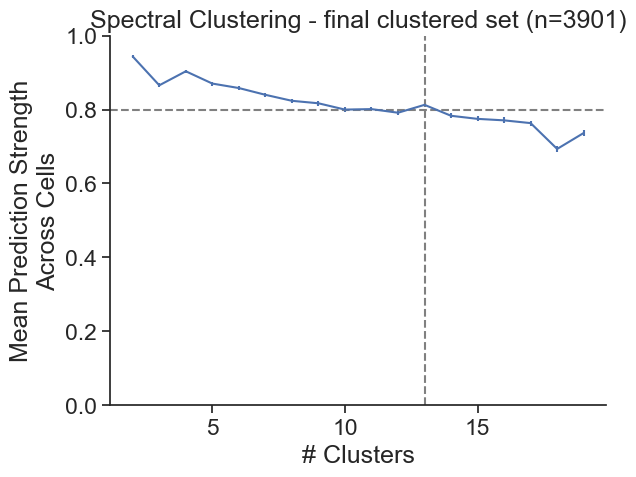

In [ ]:
# X = feature_matrix.copy()
X = feature_matrix.loc[cluster_meta.index.values].copy()

sems = []
pred_strengths = []
# iterate through k
range_of_k = range(2, 20)
for n_clusters in range_of_k:
    print('n_clusters:', n_clusters)
    # bootstrapping - run cross validation more than once
    # for iteration in range(n_iterations):
    X_train, X_test, train_labels, test_labels, test_predictions = get_train_test_predict_labels_SpectralClustering(X, 
                                                                    n_clusters=n_clusters, iteration=42)
    # Get prediction strength of each cell in this clustering iteration 
    strengths = []
    for i, cell_specimen_id in enumerate(X_test.index.values): 
        strength_i = get_individual_prediction_strength(i, test_labels, test_predictions)
        strengths.append(strength_i)
    # Take the average and SEM over cells for plotting
    pred_strengths.append(np.mean(strengths))
    sems.append(stats.sem(strengths))
    # ps_score = get_prediction_strength(test_labels, test_predictions)
    # ps_score = np.mean(ps_score)
    # print(f"minimum Prediction Strength: {ps_score:.4f}")
    # pred_strengths.append(ps_score)

fig, ax = plt.subplots(figsize=(7,4))
ax.errorbar(range_of_k, pred_strengths, yerr=sems)
ax.set_ylim(0,1)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Mean Prediction Strength\nAcross Cells')
ax.set_title('Prediction strength across cells (n='+str(len(X))+')')
ax.axhline(y=0.7, xmin=0, xmax=1, linestyle='--', color='gray')
selected_k = range_of_k[np.where(np.asarray(pred_strengths)+np.asarray(sems)>0.7)[0][-1]]
ax.axvline(x=selected_k, ymin=0, ymax=1, linestyle='--', color='gray')

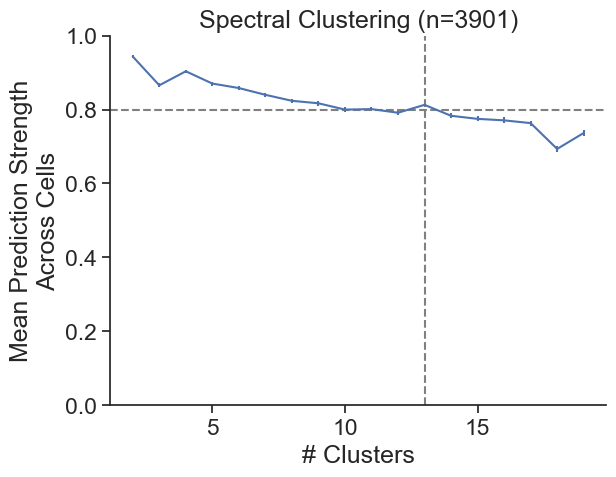

In [ ]:
fig, ax = plt.subplots(figsize=(7,4))
ax.errorbar(range_of_k, pred_strengths, yerr=sems)
ax.set_ylim(0,1)
ax.set_xlabel('# Clusters')
ax.set_ylabel('Mean Prediction Strength\nAcross Cells')
ax.set_title('Spectral Clustering (n=3901)')
ax.axhline(y=0.8, xmin=0, xmax=1, linestyle='--', color='gray')
selected_k = range_of_k[np.where(np.asarray(pred_strengths)+np.asarray(sems)>0.8)[0][-1]]
ax.axvline(x=selected_k, ymin=0, ymax=1, linestyle='--', color='gray')

##### plot cells colored by their prediction score

In [ ]:
# for n=12 clusters

##### get prediction strengths for cells in each cluster for a set number of clusters

n_clusters: 12


Text(0.5, 1.0, 'Spectral Clustering - final clustered set (n=3901)')

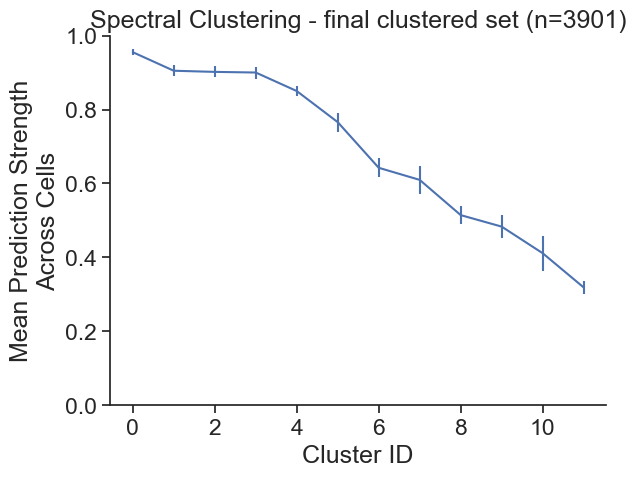

In [ ]:
# X = feature_matrix.copy()
X = feature_matrix.loc[cluster_meta.index.values].copy()

sems = []
pred_strengths = []
# iterate through k
# range_of_k = range(2, 20)
# for n_clusters in range_of_k:
n_clusters = 12
iterations = 2
print('n_clusters:', n_clusters)
X_train, X_test, train_labels, test_labels, test_predictions = get_train_test_predict_labels_SpectralClustering(X, 
                                                                n_clusters=n_clusters, iteration=42)
# Get prediction strength of each cell in each cluster
cluster_strengths = []
cluster_sems = []
for n_cluster in range(n_clusters):
    cells_in_cluster = np.where(test_labels==n_cluster)[0]
    # cell_specimen_ids = X_test.index.values[cells_in_cluster]
    # for i, cell_specimen_id in enumerate(cell_specimen_ids):
    strengths = []
    for i in cells_in_cluster: 
        strength_i = get_individual_prediction_strength(i, test_labels, test_predictions)
        strengths.append(strength_i)
    pred_strengths.append(np.mean(strengths))
    sems.append(stats.sem(strengths))

# ps_score = get_prediction_strength(test_labels, test_predictions)
# ps_score = np.mean(ps_score)
# print(f"minimum Prediction Strength: {ps_score:.4f}")
# pred_strengths.append(ps_score)

inds = np.argsort(pred_strengths)[::-1]
fig, ax = plt.subplots(figsize=(7,4))
ax.errorbar(np.arange(0, n_clusters), np.asarray(pred_strengths)[inds], yerr=np.asarray(sems)[inds])
ax.set_ylim(0,1)
ax.set_xlabel('Cluster ID')
ax.set_ylabel('Mean Prediction Strength\nAcross Cells')
ax.set_title('Spectral Clustering - final clustered set (n=3901)')
# ax.axhline(y=0.8, xmin=0, xmax=1, linestyle='--', color='gray')
# selected_k = range_of_k[np.where(np.asarray(pred_strengths)+np.asarray(sems)>0.8)[0][-1]]
# ax.axvline(x=selected_k, ymin=0, ymax=1, linestyle='--', color='gray')

##### validate pre-determined clusters

Yes, you can test the robustness of pre-determined clusters by treating them as a supervised classification problem, much like the authors did in Section 5 when they validated specific branches of a hierarchical tree.

To do this for Spectral Clustering, you need a way to "predict" the labels of a test set using the structure learned from a training set. Since Spectral Clustering captures non-convex shapes (like rings or moons), using K-means centroids won't work well. Instead, the standard "bridge" is to use a K-Nearest Neighbors (KNN) classifier.
The Methodology

    Data Splitting: Split your 3,000 observations into a training set and a test set (e.g., 50/50).

    Surrogate Training: Train a KNN Classifier on the training set using your pre-determined spectral labels as the target. This "learns" the decision boundary that the spectral algorithm created.

    Prediction: Use that KNN classifier to predict labels for the observations in your test set.

    Co-membership Calculation:

        Look at all pairs of observations in your test set that share the same original spectral label.

        Calculate what proportion of those pairs also share the same predicted label.

        The Prediction Strength is the minimum proportion across all your pre-determined clusters.

1) split data into test and training set
2) train a classifier to predict the original cluster labels using the training set, then predict the cluster IDs in the test set using this classifier
3) find cells in test set belonging to each original cluster and ask what proportion of those cell pairs have the same predicted label in the test prediction (prediction based on training classifier trained to learn the original cluster IDs)
4) compute minimum proportion of matching pairs across the original set of clusters. 

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X = feature_matrix.loc[cluster_meta.index.values]
pre_determined_labels = cluster_meta.cluster_id.values
X_tr, X_te, L_tr, L_te = train_test_split(X, pre_determined_labels, test_size=0.5, random_state=i)

In [ ]:
def get_robustness_of_labels(X, pre_determined_labels, n_neighbors=5, n_iters=10):
    """
    Computes the prediction strength for a set of fixed labels.
    
    Args:
        X: Feature matrix (3000, 9).
        pre_determined_labels: The labels you want to test.
        n_neighbors: KNN neighbors (should match your spectral logic).
    """
    from sklearn.model_selection import train_test_split
    from sklearn.neighbors import KNeighborsClassifier
    from scipy.special import comb

    cluster_ids = np.sort(np.unique(pre_determined_labels))
    scores = []
    all_cluster_strengths = []

    ps_df = []

    for i in range(n_iters):
        # 1. Split data and labels
        X_train, X_test, labels_training, labels_test = train_test_split(
            X, pre_determined_labels, test_size=0.5, random_state=i)

        # 2. Train a KNN 'Surrogate' on the training labels
        knn = KNeighborsClassifier(n_neighbors=n_neighbors)
        knn.fit(X_train, labels_training)

        # 3. Predict labels for the test set
        test_predictions = knn.predict(X_test)

        # 4. Calculate prediction strength for each original cluster
        cluster_strengths = []
        for cluster_id in cluster_ids:
            # Indices of points that belong to this cluster in the TEST set
            indices = np.where(labels_test == cluster_id)[0]
            n_kj = len(indices)
            
            if n_kj < 2: continue
            
            # How many of these points share a predicted label?
            preds = test_predictions[indices]
            _, counts = np.unique(preds, return_counts=True)
            
            same_predict_pairs = np.sum(comb(counts, 2))
            total_pairs = comb(n_kj, 2)
            strength = same_predict_pairs / total_pairs
            cluster_strengths.append(strength)
            ps_df.append([i, cluster_id, strength])
        
        all_cluster_strengths.append(cluster_strengths)
        scores.append(np.min(cluster_strengths))

    prediction_score = np.mean(scores)
    prediction_sem = np.std(scores) / np.sqrt(n_iters)

    ps_df = pd.DataFrame(data=ps_df, columns=['iteration', 'cluster_id', 'cluster_strength'])

    return ps_df, prediction_score, prediction_sem, all_cluster_strengths


In [ ]:
X = feature_matrix.loc[cluster_meta.index.values]
original_cluster_labels = cluster_meta.cluster_id.values

ps_df, prediction_score, prediction_sem, all_cluster_strengths = get_robustness_of_labels(X, original_cluster_labels)
print(np.round(prediction_score, 2), np.round(prediction_sem, 2))

0.33 0.02


C:\Users\marinag\AppData\Local\Temp\ipykernel_19540\1174711554.py:2: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax = sns.pointplot(data=ps_df, x='cluster_id', y='cluster_strength', join=False, ax=ax)


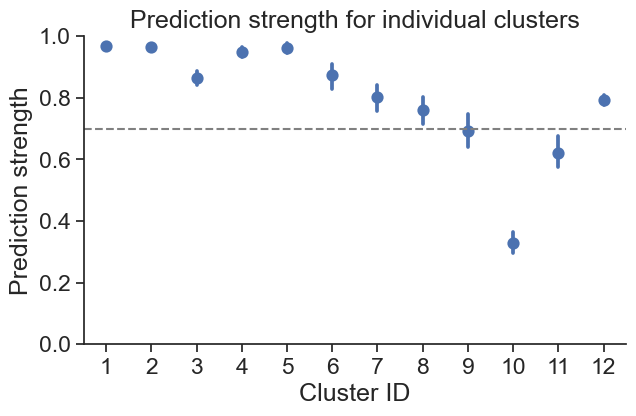

In [ ]:
fig, ax = plt.subplots(figsize=(7,4))
ax = sns.pointplot(data=ps_df, x='cluster_id', y='cluster_strength', join=False, ax=ax)
ax.set_title('Prediction strength for individual clusters')
ax.set_ylabel('Prediction strength')
ax.set_xlabel('Cluster ID')
ax.set_ylim(0, 1)
ax.axhline(y=0.7, xmin=0, xmax=1, linestyle='--', color='gray')

In [ ]:
ps_df.groupby(['cluster_id']).mean()

,iteration,cluster_strength
cluster_id,,
1,4.5,0.967819
2,4.5,0.964259
3,4.5,0.865954
4,4.5,0.949537
5,4.5,0.961338
6,4.5,0.872915
7,4.5,0.803773
8,4.5,0.760441
9,4.5,0.691534


##### Compare to cluster size

In [ ]:
tmp = cluster_meta.copy()
tmp['cre_line'] = 'all'
n_cells_per_cluster = processing.get_fraction_cells_per_cluster_per_group(tmp, col_to_group='cre_line')
n_cells_per_cluster['percent_cells'] = n_cells_per_cluster.fraction_per_cluster * 100
n_cells_per_cluster

,cre_line,cluster_id,n_cells_cluster,n_cells_group,fraction_per_cluster,percent_cells
0,all,1,789,3901,0.202256,20.225583
1,all,2,673,3901,0.172520,17.251987
2,all,3,404,3901,0.103563,10.356319
3,all,4,356,3901,0.091259,9.125865
4,all,5,328,3901,0.084081,8.408100
5,all,6,229,3901,0.058703,5.870290
6,all,7,234,3901,0.059985,5.998462
7,all,8,112,3901,0.028711,2.871059
8,all,9,92,3901,0.023584,2.358370
9,all,10,311,3901,0.079723,7.972315


In [ ]:
mean_ps_df = ps_df.groupby(['cluster_id']).mean()
mean_ps_df = mean_ps_df.merge(n_cells_per_cluster[['cluster_id', 'percent_cells']], on=['cluster_id'])
mean_ps_df.head()

,cluster_id,iteration,cluster_strength,percent_cells
0,1,4.5,0.967819,20.225583
1,2,4.5,0.964259,17.251987
2,3,4.5,0.865954,10.356319
3,4,4.5,0.949537,9.125865
4,5,4.5,0.961338,8.408100


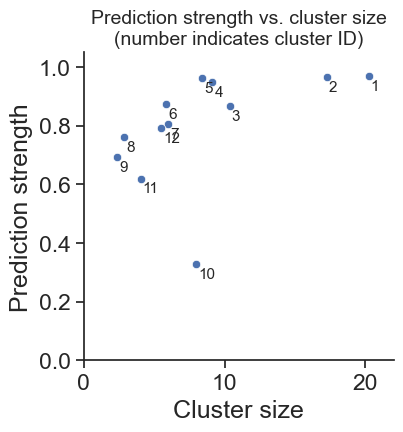

In [ ]:
figsize = (4,4)
fig, ax = plt.subplots(figsize=figsize)
ax = sns.scatterplot(data=mean_ps_df, x='percent_cells', y='cluster_strength')
ax.set_xlim(0, 22)
ax.set_ylim(0, 1.05)
ax.set_ylabel('Prediction strength')
ax.set_xlabel('Cluster size')
ax.set_title('Prediction strength vs. cluster size\n(number indicates cluster ID)', fontsize=14)
for cluster_id in mean_ps_df.cluster_id.unique(): 
    row_data = mean_ps_df[mean_ps_df.cluster_id==cluster_id]
    ax.text(s=str(row_data.cluster_id.values[0]), fontsize=11, ha='left', va='top',
            x=row_data.percent_cells.values[0]+0.15, y=row_data.cluster_strength.values[0]-0.01)

##### plot each iteration

C:\Users\marinag\AppData\Local\Temp\ipykernel_19540\3494706586.py:2: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax = sns.pointplot(data=ps_df, x='cluster_id', y='cluster_strength', hue='iteration', join=False, ax=ax)


Text(0.5, 0, 'Cluster ID')

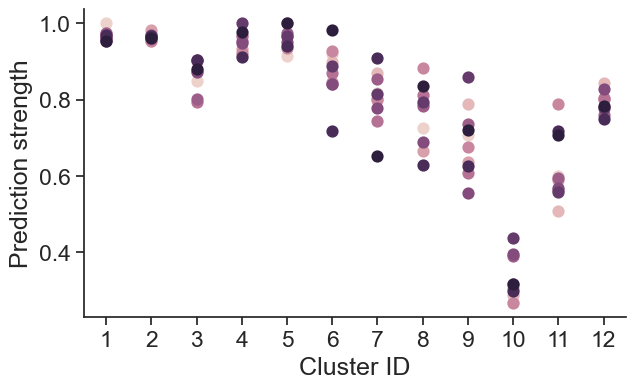

In [ ]:
fig, ax = plt.subplots(figsize=(7,4))
ax = sns.pointplot(data=ps_df, x='cluster_id', y='cluster_strength', hue='iteration', join=False, ax=ax)
ax.get_legend().remove()
ax.set_ylabel('Prediction strength')
ax.set_xlabel('Cluster ID')

##### Robustness of clusters for individual cre lines

In [ ]:
counts = pd.DataFrame(cluster_meta.value_counts(['cell_type', 'cluster_id']), columns=['n_cells']).reset_index().sort_values(by=['cell_type', 'cluster_id'])
clusters_to_remove = counts[counts.n_cells<10]
clusters_to_remove

,cell_type,cluster_id,n_cells
29,Sst Inhibitory,1,6
25,Sst Inhibitory,12,9
26,Vip Inhibitory,3,8
28,Vip Inhibitory,5,7
27,Vip Inhibitory,7,7


In [ ]:
cells_to_remove = []
for i, row_data in clusters_to_remove.iterrows():
    csids = cluster_meta[(cluster_meta.cell_type==row_data.cell_type) & (cluster_meta.cluster_id==row_data.cluster_id)].index.values
    cells_to_remove = np.hstack((cells_to_remove, csids))

C:\Users\marinag\AppData\Local\Temp\ipykernel_19540\1076826168.py:15: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax = sns.pointplot(data=df, x='cluster_id', y='cluster_strength', hue='cell_type',


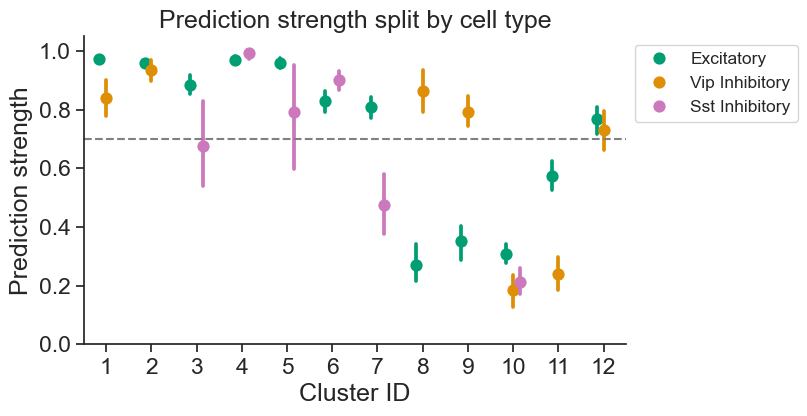

In [ ]:
cluster_meta_tmp = cluster_meta.copy()
cluster_meta_tmp = cluster_meta_tmp.drop(index=cells_to_remove)

df = pd.DataFrame()
for cell_type in cell_types: 
    cre_cluster_meta = cluster_meta_tmp[cluster_meta_tmp.cell_type==cell_type]
    X = feature_matrix.loc[cre_cluster_meta.index.values]
    original_cluster_labels = cre_cluster_meta.cluster_id.values

    ps_df, prediction_score, prediction_sem, all_cluster_strengths = get_robustness_of_labels(X, original_cluster_labels)
    ps_df['cell_type'] = cell_type
    df = pd.concat([df, ps_df])

fig, ax = plt.subplots(figsize=(7,4))
ax = sns.pointplot(data=df, x='cluster_id', y='cluster_strength', hue='cell_type', 
                   palette=utils.get_cell_type_colors(), join=False, dodge=0.3, ax=ax)
ax.legend(bbox_to_anchor=(1,1), fontsize='x-small', title='')
ax.set_title('Prediction strength split by cell type')
ax.set_ylabel('Prediction strength')
ax.set_xlabel('Cluster ID')
ax.set_ylim(0, 1.05)
ax.axhline(y=0.7, xmin=0, xmax=1, linestyle='--', color='gray')

In [ ]:
df.groupby(['cluster_id', 'cell_type']).mean()

iteration  cluster_strength
cluster_id cell_type                                  
1          Excitatory            4.5          0.972700
           Vip Inhibitory        4.5          0.840755
2          Excitatory            4.5          0.957771
           Vip Inhibitory        4.5          0.935055
3          Excitatory            4.5          0.884956
           Sst Inhibitory        4.5          0.674282
4          Excitatory            4.5          0.968109
           Sst Inhibitory        4.5          0.991304
5          Excitatory            4.5          0.959822
           Sst Inhibitory        4.5          0.792857
6          Excitatory            4.5          0.829642
           Sst Inhibitory        4.5          0.900952
7          Excitatory            4.5          0.808534
           Sst Inhibitory        4.5          0.476123
8          Excitatory            4.5          0.270692
           Vip Inhibitory        4.5          0.863961
9          Excitatory            4.5          0.352592
           Vip Inhibitory        4.5          0.790998
10         Excitatory            4.5          0.307463
           Sst Inhibitory        4.5          0.211890
           Vip Inhibitory        4.5          0.184048
11         Excitatory            4.5          0.574510
           Vip Inhibitory        4.5          0.239377
12         Excitatory            4.5          0.767552
           Vip Inhibitory        4.5          0.728840

### redo gap statistic

In [ ]:
def compute_dispersion(X, labels):
    '''
    Compute within cluster dispersion based on Tibshirani, Walther, & Hastie, 2001,
    defined as the sum of the pairwise distances divided by the number of points in the cluster
    '''
    from sklearn.metrics import pairwise_distances

    Wk = 0
    unique_labels = np.unique(labels)
    for c in unique_labels:
        cluster_points = X[labels == c]
        nr = cluster_points.shape[0]
        if nr <= 1: continue

        # Calculate sum of all pairwise squared Euclidean distances
        # Note: pairwise_distances(metric='sqeuclidean') is faster/more accurate for this
        dist_matrix = pairwise_distances(cluster_points, metric='sqeuclidean')
        Dr = np.sum(dist_matrix)

        # Normalize by 2 * number of points in cluster
        Wk += Dr / (2 * nr)
    return Wk


def calculate_gap_statistics(wk_original, wk_refs):
    """
    Args:
        wk_original: List of Wk values for k=1...K for your real data.
        wk_refs: List of lists. Each inner list contains Wk values 
                 from one Monte Carlo reference simulation.
                 Shape: (n_simulations, K)
    """
    # 1. Convert to log scale
    log_wk_orig = np.log(wk_original)
    log_wk_refs = np.log(wk_refs)

    # 2. Calculate Expected log(Wk) and Standard Deviation
    # Mean across the simulations (axis 0)
    e_log_wk = np.mean(log_wk_refs, axis=0)

    # Standard deviation of the reference logs
    sdk = np.std(log_wk_refs, axis=0)

    # 3. Calculate the Gap
    gap_k = e_log_wk - log_wk_orig

    # 4. Calculate the Simulation Error (sk)
    # The paper defines sk = sdk * sqrt(1 + 1/B) where B is n_simulations
    B = log_wk_refs.shape[0]
    sk = sdk * np.sqrt(1 + 1 / B)

    return gap_k, sk

def find_optimal_k(gap_k, sk):
    """
    The 1-standard-error rule: choose the smallest k such that:
    Gap(k) >= Gap(k+1) - s_{k+1}
    """
    for k_idx in range(len(gap_k) - 1):
        if gap_k[k_idx] >= gap_k[k_idx + 1] - sk[k_idx + 1]:
            # Returns k value (index + 1)
            return k_idx + 1
    return len(gap_k)


# --- Example Usage ---
# gap_values, errors = calculate_gap_statistics(my_wks, reference_wks)
# best_k = find_optimal_k(gap_values, errors)
# print(f"Optimal clusters based on Gap Statistic: {best_k}")

In [ ]:
def compute_gap(clustering, data, k_max=5, n_boots=20, reference_shuffle='all', metric='euclidean', separate_cre_lines_for_shuffle=False):
    '''
    Computes gap statistic between clustered data (ondata inertia) and null hypothesis (reference intertia).

    :param clustering: clustering object that includes "n_clusters" and "fit_predict"
    :param data: an array of data to be clustered (n samples by n features)
    :param k_max: (int) maximum number of clusters to test, starts at 1
    :param n_boots: (int) number of repetitions for computing mean inertias
    :param reference: (str) what type of shuffle to use, shuffle_dropout_scores,
            None is use random normal distribution
    :param metric: (str) type of distance to use, default = 'euclidean'
    :param separate_cre_lines_for_shuffle: (bool) whether or not to shuffle within cre lines.
                                Set to True if feature matrix consists of multiple cre lines.
                                If feature_matrix consists of a single cre line, no need to separate anything before shuffling
    :return:
    gap: array of gap values that are the difference between two inertias
    reference_inertia: array of log of reference inertia
    ondata_inertia: array of log of ondata inertia
    '''

    if len(data.shape) == 1:
        data = data.reshape(-1, 1)

    if isinstance(data, pd.core.frame.DataFrame):
        data_array = data.values
    else:
        data_array = data

    gap_statistics = {}
    reference_inertia = []
    reference_sem = []
    gap_mean = []
    gap_sem = []
    for k in range(1, k_max ):
        local_ref_inertia = []
        for _ in range(n_boots):
            # draw random dist or shuffle for every nboot
            if reference_shuffle is None:
                reference = np.random.rand(*data.shape) * -1
            else:
                reference_df = processing.shuffle_dropout_score(data, shuffle_type=reference_shuffle, separate_cre_lines_for_shuffle=separate_cre_lines_for_shuffle)
                # reference = reference_df.values

            clustering.n_clusters = k
            assignments = clustering.fit_predict(reference_df)
            local_ref_inertia.append(compute_dispersion(assignments, reference_df))
        reference_inertia.append(np.mean(local_ref_inertia))
        reference_sem.append(sem(local_ref_inertia))

    ondata_inertia = []
    ondata_sem = []
    for k in range(1, k_max ):
        local_ondata_inertia = []
        for _ in range(n_boots):
            clustering.n_clusters = k
            assignments = clustering.fit_predict(data)
            local_ondata_inertia.append(compute_dispersion(assignments, data))
        ondata_inertia.append(np.mean(local_ondata_inertia))
        ondata_sem.append(sem(local_ondata_inertia))

        # compute difference before mean
        gap_mean.append(np.mean(np.subtract(np.log(local_ondata_inertia), np.log(local_ref_inertia))))
        gap_sem.append(sem(np.subtract(np.log(local_ondata_inertia), np.log(local_ref_inertia))))

    # maybe plotting error bars with this metric would be helpful but for now I'll leave it
    gap = np.log(reference_inertia) - np.log(ondata_inertia)

    # we potentially do not need all of this info but saving it to plot it for now
    gap_statistics['gap'] = gap
    gap_statistics['reference_dispersion'] = np.log(reference_inertia)
    gap_statistics['ondata_dispersion'] = np.log(ondata_inertia)
    gap_statistics['reference_sem'] = reference_sem
    gap_statistics['ondata_sem'] = ondata_sem
    gap_statistics['gap_mean'] = gap_mean
    gap_statistics['gap_sem'] = gap_sem

    gap_values, errors = calculate_gap_statistics(ondata_inertia, reference_inertia)
    best_k = find_optimal_k(gap_values, errors)
    print(f"Optimal clusters based on Gap Statistic: {best_k}")

    return gap_statistics, gap_values, errors


In [ ]:
# metric = 'euclidean' # default distance metric
# shuffle_type ='all' # default shuffle type is all shuffle (cell id and regressors)
# k_max = 20 #max number of clusters to test

# from sklearn.cluster import SpectralClustering
# sc = SpectralClustering()
# gap_dict,  gap_values, errors = compute_gap(clustering=sc, data=feature_matrix, k_max=k_max, 
#                                 reference_shuffle=shuffle_type, metric=metric, separate_cre_lines_for_shuffle=True)


### Clustering validation

#### Plot co-clustering matrix

In [ ]:
# load co-clustering results
coclust_filename = os.path.join(data_dir, 'coclustering_matrix_n_' + str(n_clusters) + '_clusters.h5')
coclustering_df = pd.read_hdf(coclust_filename, key='df')

In [ ]:
coclustering_df.head()

cell_specimen_id,1086489847,1086489860,1086489891,1086489976,1086490002,1086490039,1086490067,1086490073,1086490095,1086490100,...,1120133177,1120133194,1120133281,1120133297,1120133316,1120133342,1120133375,1120133471,1120133515,1120133649
cell_specimen_id,,,,,,,,,,,,,,,,,,,,,
1086489847,1.006711,0.000000,1.006711,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000
1086489860,0.000000,1.006711,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.006711,0.0,0.0,0.0,1.006711,0.000000,0.0,1.006711
1086489891,1.006711,0.000000,1.006711,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000
1086489976,0.000000,0.000000,0.000000,1.006711,1.006711,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,1.006711,0.0,0.000000
1086490002,0.000000,0.000000,0.000000,1.006711,1.006711,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,1.006711,0.0,0.000000


In [ ]:
# # plot coclustering matrix 
# coclustering_dict = {}
# coclustering_dict['all'] = coclustering_df
# cluster_meta_tmp = cluster_meta.copy()
# cluster_meta_tmp['cre_line'] = 'all'

# plotting.plot_coclustering_matrix_sorted_by_cluster_size(coclustering_dict, cluster_meta_tmp, cre_line='all',
#                                                                  suffix='_' + str(n_clusters) + '_clusters', 
#                                                                  save_dir=save_dir, folder='clustering_results')

#### Within cluster correlation

adding within cluster correlation to cluster_meta


c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-

adding within cluster correlation to cluster_meta


c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-

<AxesSubplot:title={'center':'Within cluster correlation'}, xlabel='Cluster ID', ylabel='Pearson\ncorrelation'>

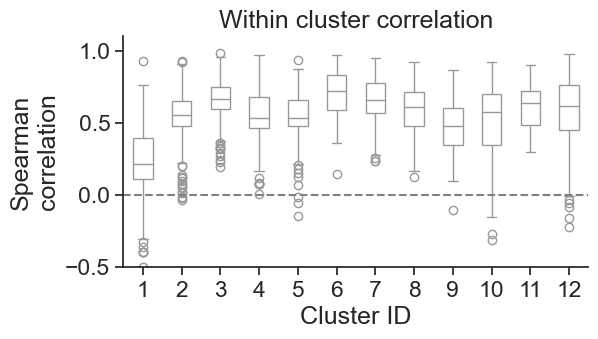

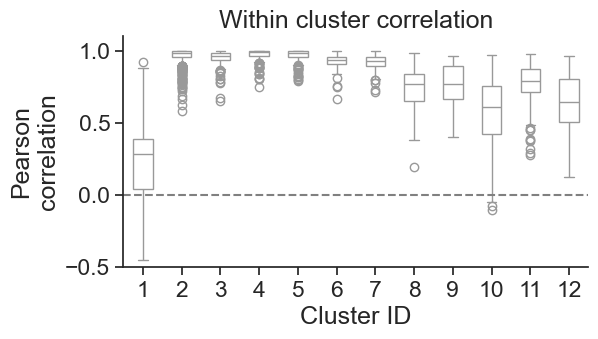

In [ ]:
# plot within cluster correlations distribution
spearman = True
cluster_meta = processing.add_within_cluster_corr_to_cluster_meta(feature_matrix, cluster_meta, use_spearmanr=spearman)
plotting.plot_within_cluster_correlations(cluster_meta, sort_order=None, spearman=spearman, suffix='_'+str(n_clusters)+'_clusters',
                                                save_dir=save_dir, folder='clustering_results', ax=None)

# plot within cluster correlations distribution
spearman = False
cluster_meta = processing.add_within_cluster_corr_to_cluster_meta(feature_matrix, cluster_meta, use_spearmanr=spearman)
plotting.plot_within_cluster_correlations(cluster_meta, sort_order=None, spearman=spearman, suffix='_'+str(n_clusters)+'_clusters',
                                                save_dir=save_dir, folder='clustering_results', ax=None)

In [ ]:
# # plot within cluster correlations distribution
# spearman = False
# cluster_meta = processing.add_within_cluster_corr_to_cluster_meta(feature_matrix, cluster_meta, use_spearmanr=spearman)
# plotting.plot_within_cluster_correlations(cluster_meta, sort_order=None, spearman=spearman, suffix='_'+str(n_clusters)+'_clusters',
#                                                 save_dir=save_dir, folder='clustering_results', ax=None)

#### UMAP

In [ ]:
# get saved umap results
umap_df = processing.get_umap_results(feature_matrix, cluster_meta, save_dir=data_dir, suffix='')

loading umap results from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\clustering\umap_results_df.h5


#### Original figures

using provided umap_df


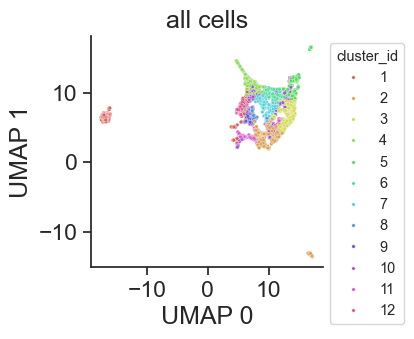

In [ ]:
# show all clusters in same plot
plotting.plot_umap_for_clusters(cluster_meta, feature_matrix, umap_df, label_col='cluster_id', cre_lines = ['all'],
                                save_dir=save_dir, folder='cluster_results')

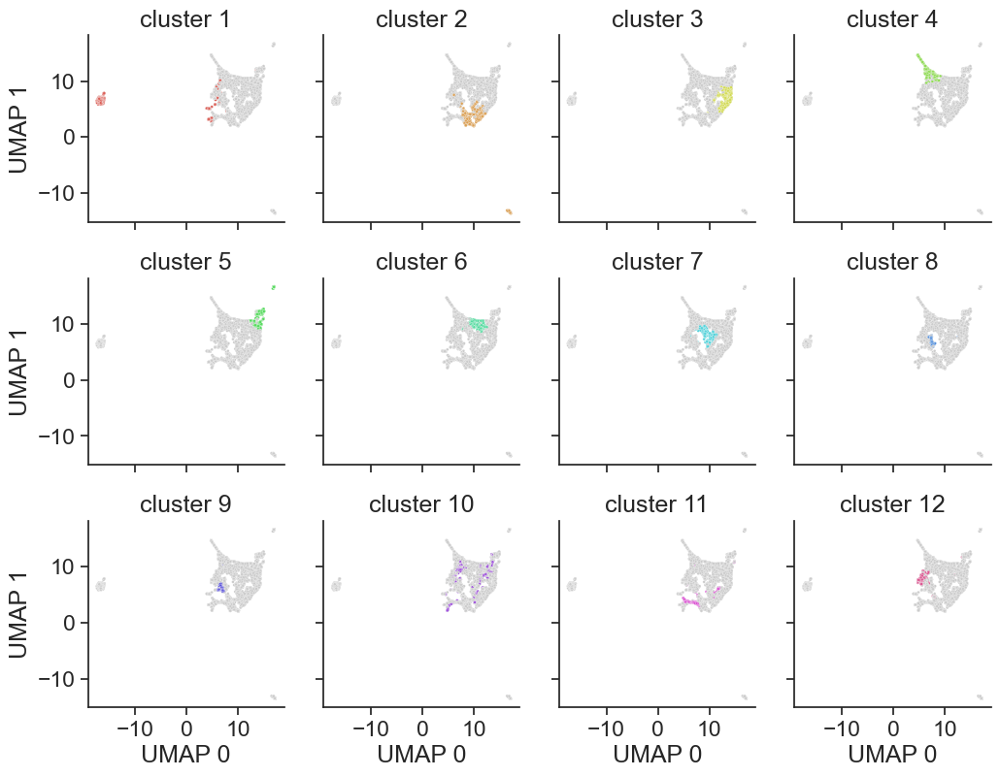

In [ ]:
# plot clusters in separate axes
plotting.plot_umap_for_clusters_separately(cluster_meta, feature_matrix, umap_df, label_col='cluster_id', save_dir=save_dir, folder='clustering_results')

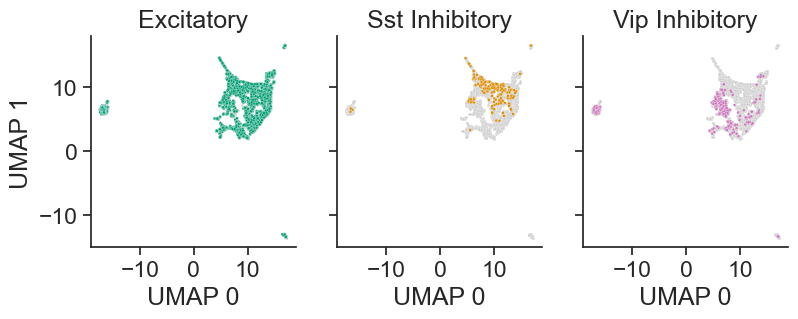

In [ ]:
# plot cell type distribution 
cmap = utils.get_cell_type_colors()
plotting.plot_umap_for_features_separately(cluster_meta, feature_matrix, umap_df, label_col='cell_type', cmap=cmap, save_dir=save_dir, folder='clustering_results')

#### Distribution of animals and rigs across clusters

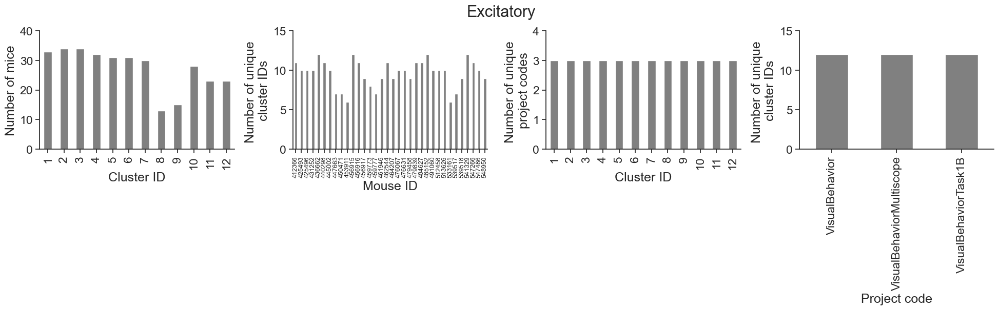

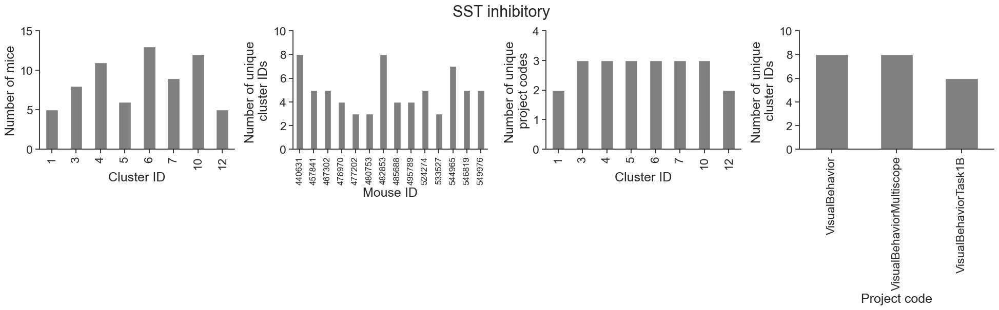

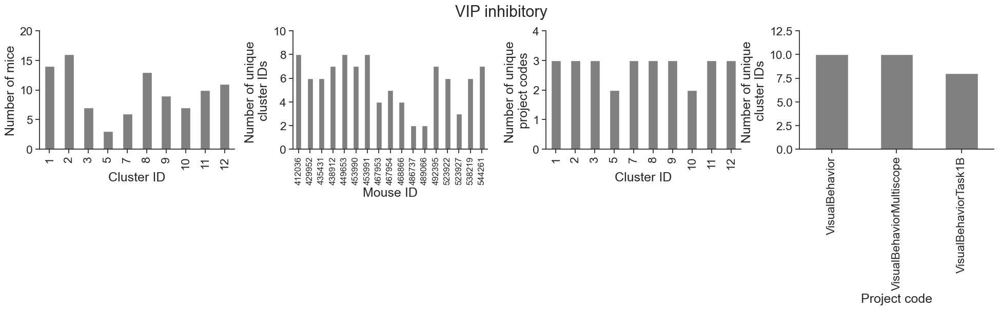

In [ ]:
plotting.plot_cluster_info(cre_lines, cluster_meta, save_dir=save_dir, folder='clustering_controls')

In [ ]:
mice_exp = cluster_meta.groupby(['cell_type', 'cluster_id', 'mouse_id']).count()[['labels']].reset_index()
mice_exp = mice_exp.merge(platform_experiments[platform_experiments.experience_level=='Novel +'][['mouse_id', 'prior_exposures_to_image_set']], on='mouse_id')
mice_exp

,cell_type,cluster_id,mouse_id,labels,prior_exposures_to_image_set
0,Excitatory,1,412366,1,2
1,Excitatory,2,412366,8,2
2,Excitatory,3,412366,14,2
3,Excitatory,4,412366,13,2
4,Excitatory,5,412366,4,2
...,...,...,...,...,...
1090,Vip Inhibitory,2,523927,3,2
1091,Vip Inhibitory,8,523927,3,2
1092,Vip Inhibitory,9,523927,3,2
1093,Vip Inhibitory,8,489066,3,2


In [ ]:
mice_labels = mice_exp.groupby(['cell_type', 'cluster_id', 'prior_exposures_to_image_set']).sum().reset_index()
mice_labels[mice_labels.cell_type=='Excitatory']

,cell_type,cluster_id,prior_exposures_to_image_set,mouse_id,labels
0,Excitatory,1,1,6799418,1077
1,Excitatory,1,2,14397912,1411
2,Excitatory,1,3,6308923,413
3,Excitatory,1,4,2047122,34
4,Excitatory,2,1,6799418,578
5,Excitatory,2,2,14851823,1343
6,Excitatory,2,3,6308923,294
7,Excitatory,2,4,2047122,34
8,Excitatory,3,1,6799418,706
9,Excitatory,3,2,14851823,488


## New cluster plot for graphical abstract

In [ ]:
import umap

In [ ]:
umap_df = processing.get_umap_results(feature_matrix, cluster_meta, save_dir=data_dir, suffix='')

loading umap results from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\clustering\umap_results_df.h5


In [ ]:
# limit cluster meta to cells that are not in cluster 1 (which is an outlier in the plot)
main_cluster_meta = cluster_meta[cluster_meta.cluster_id!=1]
# limit umap_df to non-cluster 1
umap_df['cell_specimen_id'] = cluster_meta.index.values
umap_df = umap_df.set_index('cell_specimen_id')
umap_df = umap_df.loc[main_cluster_meta.index.values]
# identify other non-outlier points and limit both tables to those
csids = umap_df[umap_df.x<16].index.values
main_cluster_meta = main_cluster_meta.loc[csids]
umap_df = umap_df.loc[csids]
print(len(umap_df), len(main_cluster_meta))
umap_df.head()

2941 2941


,x,y
cell_specimen_id,,
1086489847,4.780380,7.625232
1086489860,9.371953,2.737884
1086489891,4.785028,7.619345
1086489976,6.144250,11.332527
1086490002,9.028252,10.901272


In [ ]:
exp_colors = utils.get_experience_level_colors()
gray = (0.8, 0.8, 0.8)
cluster_color_dict = {1: gray, # non coding - gray
                      2: exp_colors[1], # novel image coding - red
                      3: exp_colors[2], # persistent novel image coding - purple 
                      4: exp_colors[0], # familiar image coding - blue
                      5: gray, # weird coding - gray
                      6: exp_colors[2], # novelty suppression - purple
                      7: gray, # everything coding gray
                      8: exp_colors[0], # omission coding during familiar - blue
                      9: exp_colors[2], # omission coding during novel+ - purple
                      10: exp_colors[0], # task coding during familiar - blue
                      11: gray, # task coding during novel - gray
                      12: gray, # behavior coding - gray
                      }

colors = [cluster_color_dict[main_cluster_meta.loc[cell_specimen_id]['cluster_id']] for cell_specimen_id in main_cluster_meta.index.values]

feature_colors = plotting.get_feature_colors_with_gray()
edge_color_dict = {1: gray, # non coding - gray
                      2: feature_colors[1], # image coding
                      3: feature_colors[1], # image coding
                      4: feature_colors[1], # image coding
                      5: gray, # image coding
                      6: feature_colors[1], # image coding 
                      7: gray, # image coding
                      8: feature_colors[2], # omission coding
                      9: feature_colors[2], # omission coding
                      10: feature_colors[3], # task coding
                      11: gray, # task coding
                      12: feature_colors[4], # behavior coding
                      }

edge_colors = [edge_color_dict[main_cluster_meta.loc[cell_specimen_id]['cluster_id']] for cell_specimen_id in main_cluster_meta.index.values]

labels_dict = {1: '', # non coding - gray
                2: 'novelty enhanced', # novel image coding - red
                3: 'novel image coding', # persistent novel image coding - purple 
                4: 'familiar image coding', # familiar image coding - blue
                5: '', # weird coding - gray
                6: 'novelty suppressed', # novelty suppression - purple
                7: '', # everything coding gray
                8: 'omission coding', # omission coding during familiar - blue
                9: 'omission coding', # omission coding during novel+ - purple
                10: 'task coding', # task coding during familiar - blue
                11: '', # task coding during novel - gray
                12: 'behavior coding', # behavior coding - gray
                }
labels = [labels_dict[main_cluster_meta.loc[cell_specimen_id]['cluster_id']] for cell_specimen_id in main_cluster_meta.index.values]


markers_dict = {'Exc': 'o', # '^'
                'Sst': 's', # 'o'
                'Vip': 'd'}

markers = [markers_dict[main_cluster_meta.loc[cell_specimen_id]['cell_type'][:3]] for cell_specimen_id in main_cluster_meta.index.values]

No handles with labels found to put in legend.


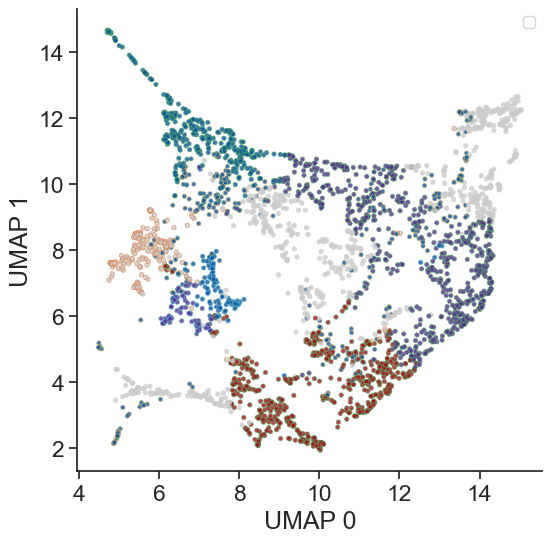

In [ ]:
figsize = (6, 6)

fig, ax = plt.subplots(figsize=figsize)

umap_df['labels'] = labels
ax = sns.scatterplot(data=umap_df, x='x', y='y', s=10, ax=ax, #label=labels,
                     color=colors, edgecolor=edge_colors, markers=markers, linewidth=0.5, alpha=0.8)

ax.set_xlabel('UMAP 0')
ax.set_ylabel('UMAP 1')
ax.legend(fontsize='xx-small', title='', title_fontsize='xx-small', bbox_to_anchor=(1, 1))


No handles with labels found to put in legend.


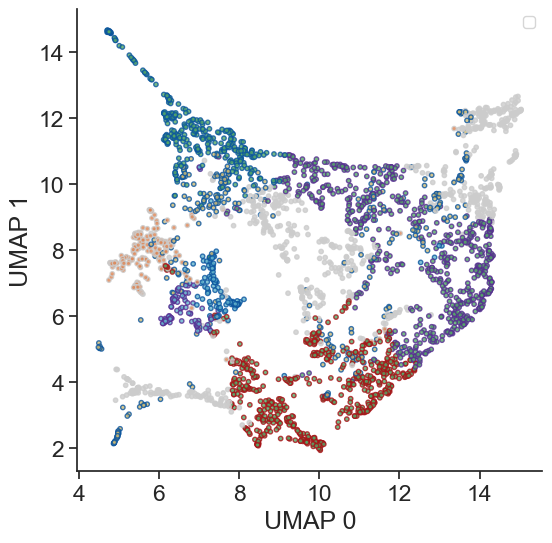

In [ ]:
figsize = (6, 6)

fig, ax = plt.subplots(figsize=figsize)

umap_df['labels'] = labels
ax = sns.scatterplot(data=umap_df, x='x', y='y', s=10, ax=ax, #label=labels,
                     color=edge_colors, edgecolor=colors, markers=markers, linewidth=1, alpha=0.8)

ax.set_xlabel('UMAP 0')
ax.set_ylabel('UMAP 1')
ax.legend(fontsize='xx-small', title='', title_fontsize='xx-small', bbox_to_anchor=(1, 1))
# ax.set_title(utils.get_cell_type_for_cre_line(cre_line, cluster_meta))

# plt.subplots_adjust(wspace=0.3)
# if save_dir:
#     utils.save_figure(fig, figsize, save_dir, folder, 'UMAP_' + label_col)


Text(0, 0.5, 'UMAP 1')

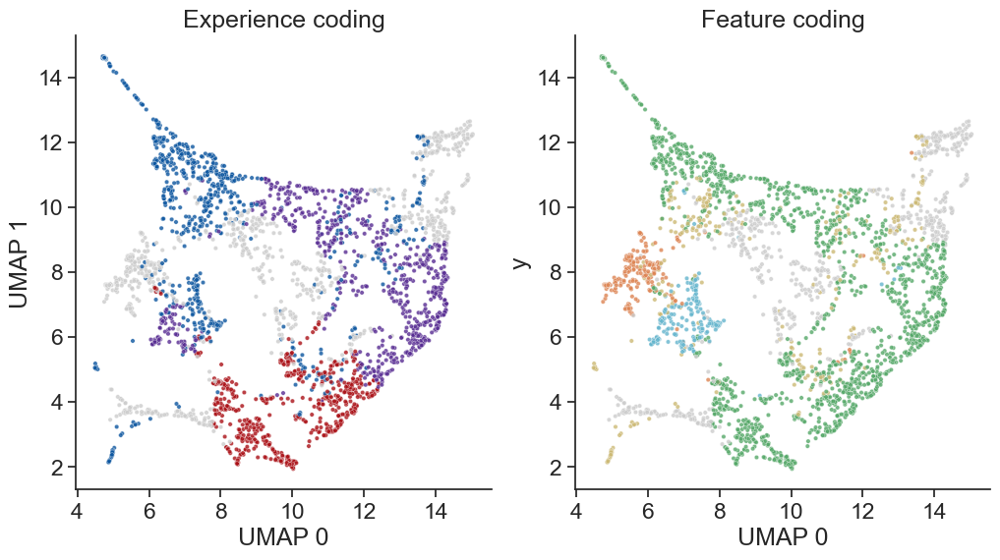

In [ ]:
figsize = (12, 6)

fig, ax = plt.subplots(1, 2, figsize=figsize)

umap_df['labels'] = labels
ax[0] = sns.scatterplot(data=umap_df, x='x', y='y', s=10, ax=ax[0], #label=labels,
                     color=colors, markers=markers, alpha=0.8)
ax[0].set_title('Experience coding')
ax[1] = sns.scatterplot(data=umap_df, x='x', y='y', s=10, ax=ax[1], #label=labels,
                     color=edge_colors, markers=markers, alpha=0.8)
ax[1].set_title('Feature coding')
ax[0].set_xlabel('UMAP 0')
ax[1].set_xlabel('UMAP 0')
ax[0].set_ylabel('UMAP 1')

In [ ]:
# umap_df['cell_type'] = [cell_type[:3] for cell_type in main_cluster_meta.cell_type.values]
# markers_dict = {'Exc': 'o', # '^'
#                 'Sst': 's', # 'o'
#                 'Vip': 'd'}

# figsize = (12, 6)

# fig, ax = plt.subplots(1, 2, figsize=figsize)

# umap_df['labels'] = labels
# ax[0] = sns.scatterplot(data=umap_df, x='x', y='y', s=10, ax=ax[0], style='cell_type',
#                      color=colors, markers=markers_dict, alpha=0.8, linewidth=0)
# ax[0].set_title('Experience coding')
# ax[1] = sns.scatterplot(data=umap_df, x='x', y='y', s=10, ax=ax[1], style='cell_type',
#                      color=edge_colors, markers=markers_dict, alpha=0.8, linewidth=0)
# ax[1].set_title('Feature coding')
# ax[0].set_xlabel('UMAP 0')
# ax[1].set_xlabel('UMAP 0')
# ax[0].set_ylabel('UMAP 1')

#### Try with new colors for specific cluster types

In [ ]:

labels_dict = {1: 'other', # non coding - gray
                2: 'novelty enhanced', # novel image coding - red #AB0F15
                3: 'novel image coding', # persistent novel image coding -  reddish purple #A2258F
                4: 'familiar image coding', # familiar image coding - blue #0B549D
                5: 'other', # weird coding - gray
                6: 'novelty suppressed', # novelty suppression - light red #E38686
                7: 'other', # everything coding gray
                8: 'familiar omission coding', # omission coding during familiar - light blue #71A9DE
                9: 'novel+ omission coding', # omission coding during novel+ - light purple #9A79C9
                10: 'task coding', # task coding during familiar - yellow #DBD689
                11: 'other', # task coding during novel - gray
                12: 'behavior coding', # behavior coding - orange #FAB171
                }
labels = [labels_dict[main_cluster_meta.loc[cell_specimen_id]['cluster_id']] for cell_specimen_id in main_cluster_meta.index.values]

cluster_id_labels = ['cluster '+str(main_cluster_meta.loc[cell_specimen_id]['cluster_id']) for cell_specimen_id in main_cluster_meta.index.values]

labels_dict = {1: 'other', # non coding - gray
                2: 'novelty enhanced', # novel image coding - red #AB0F15
                3: 'novel image coding', # persistent novel image coding -  reddish purple #A2258F
                4: 'familiar image coding', # familiar image coding - blue #0B549D
                5: 'other', # weird coding - gray
                6: 'novelty suppressed', # novelty suppression - light red #E38686
                7: 'other', # everything coding gray
                8: 'familiar omission coding', # omission coding during familiar - light blue #71A9DE
                9: 'novel+ omission coding', # omission coding during novel+ - light purple #9A79C9
                10: 'task coding', # task coding during familiar - yellow #DBD689
                11: 'other', # task coding during novel - gray
                12: 'behavior coding', # behavior coding - orange #FAB171
                }
labels = [labels_dict[main_cluster_meta.loc[cell_specimen_id]['cluster_id']] for cell_specimen_id in main_cluster_meta.index.values]


# gray = #BFBFBF
clutster_colors_dict = {1: '#BFBFBF', # non coding - gray #BFBFBF
                2: '#AB0F15', # novel image coding - red #AB0F15
                3: '#A2258F', # persistent novel image coding -  reddish purple #A2258F
                4: '#0B549D', # familiar image coding - blue #0B549D
                5: '#BFBFBF', # weird coding - gray
                6: '#E38686', # novelty suppression - light red #E38686
                7: '#BFBFBF', # everything coding gray
                8: '#71A9DE', # omission coding during familiar - light blue #71A9DE
                9: '#9A79C9', # omission coding during novel+ - light purple #9A79C9
                10: '#DBD689', # task coding during familiar - yellow #DBD689
                11: '#BFBFBF', # task coding during novel - gray
                12: '#FAB171', # behavior coding - orange #FAB171
                }
new_colors = [clutster_colors_dict[main_cluster_meta.loc[cell_specimen_id]['cluster_id']] for cell_specimen_id in main_cluster_meta.index.values]


markers_dict = {'Exc': 'o', # '^'
                'Sst': 's', # 'o'
                'Vip': 'd'}

markers = [markers_dict[main_cluster_meta.loc[cell_specimen_id]['cell_type'][:3]] for cell_specimen_id in main_cluster_meta.index.values]

In [ ]:
umap_df['cluster_id'] = [main_cluster_meta.loc[cell_specimen_id]['cluster_id'] for cell_specimen_id in main_cluster_meta.index.values]
umap_df['cluster_label'] = [labels_dict[main_cluster_meta.loc[cell_specimen_id]['cluster_id']] for cell_specimen_id in main_cluster_meta.index.values]
umap_df['cluster_id'] = ['cluster '+str(main_cluster_meta.loc[cell_specimen_id]['cluster_id']) for cell_specimen_id in main_cluster_meta.index.values]
umap_df['cell_type'] = [cell_type for cell_type in main_cluster_meta.cell_type.values]
umap_df.head()

,x,y,labels,cluster_id,cluster_label,cell_type
cell_specimen_id,,,,,,
1086489847,4.780380,7.625232,behavior coding,cluster 12,behavior coding,Vip Inhibitory
1086489860,9.371953,2.737884,novelty enhanced,cluster 2,novelty enhanced,Vip Inhibitory
1086489891,4.785028,7.619345,behavior coding,cluster 12,behavior coding,Vip Inhibitory
1086489976,6.144250,11.332527,familiar image coding,cluster 4,familiar image coding,Sst Inhibitory
1086490002,9.028252,10.901272,familiar image coding,cluster 4,familiar image coding,Sst Inhibitory


In [ ]:
red = sns.color_palette('Reds_r', 6).as_hex()[0]
blue = sns.color_palette('Blues_r', 6).as_hex()[0]
purple = sns.color_palette('Purples_r', 6).as_hex()[0]
print(red, blue, purple)

red = sns.color_palette('Reds_r', 6).as_hex()[2]
blue = sns.color_palette('Blues_r', 6).as_hex()[2]
purple = sns.color_palette('Purples_r', 6).as_hex()[2]
print(red, blue, purple)

#aa1016 #0b559f #572c92
#f44f39 #539ecd #8d89c0


In [ ]:
hue_order = umap_df.cluster_label.unique()
hue_order = [ 'novelty enhanced', 'novelty suppressed',
             'novel image coding', 'familiar image coding', 
             'novel+ omission coding','familiar omission coding', 
             'task coding', 'behavior coding', 'other']

palette = ['#aa1016', # novelty enhanced - red #AB0F15, #aa1016 
           '#55a868', # novelty suppressed - light red #E38686, #fc8161, pink #E68C8F, green #55a868
            '#572c92', # novel image coding -  purple #A2258F, #572c92
            '#0b559f', # familiar image coding - blue #0B549D, #0b559f 
            '#8d89c0', # omission coding during novel+ - light purple #9A79C9, #afaed4
            '#539ecd', # omission coding during familiar - light blue #71A9DE, #89bedc 
            '#ccb974', # task coding during familiar - yellow #DBD689
            '#dd8452', # behavior coding - orange #FAB171
            '#BFBFBF',] # non coding - gray #BFBFBF


Text(0.5, 1.0, 'Main clusters')

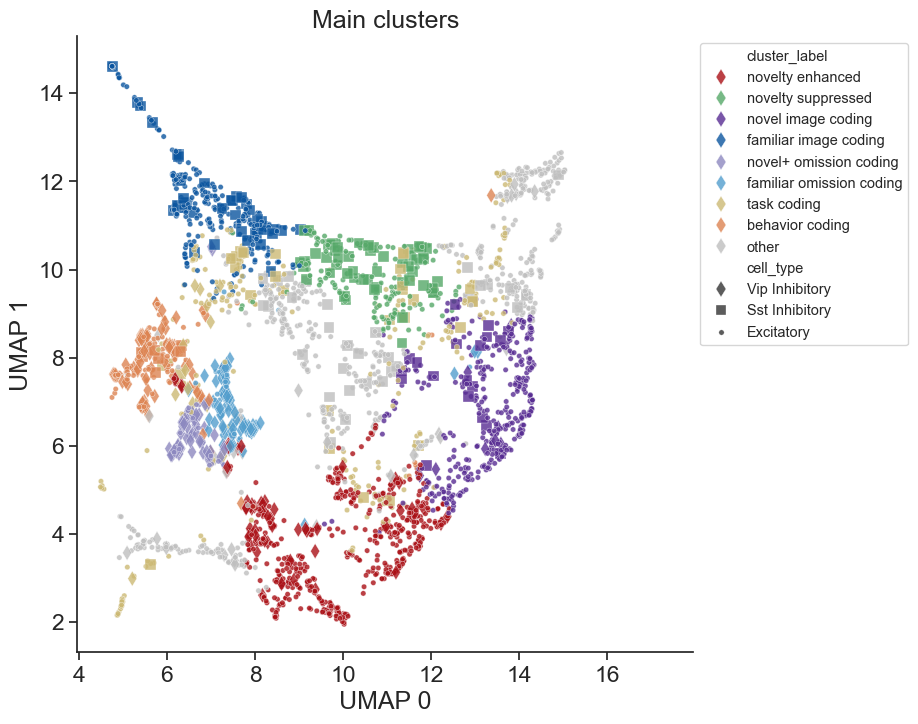

In [ ]:
figsize = (8,8)
fig, ax = plt.subplots(figsize=figsize)

markers_dict = {'Excitatory': '.', # '^'
                'Sst Inhibitory': 's', # 'o', 's'
                'Vip Inhibitory': 'd'}

ax = sns.scatterplot(data=umap_df, x='x', y='y', s=60, ax=ax, #label=labels,
                     hue='cluster_label', hue_order=hue_order, style='cell_type', 
                     palette=palette, markers=markers_dict, linewidth=0.3, alpha=0.8, edgecolor='w')
ax.set_xlabel('UMAP 0')
ax.set_ylabel('UMAP 1')
ax.axis('square')
ax.legend(fontsize='xx-small', title_fontsize='xx-small',  bbox_to_anchor=(1,1))
ax.set_title('Main clusters')

In [ ]:
gray_cluster_ids = ['cluster 1', 'cluster 5', 'cluster 7', 'cluster 11']
umap_df['cluster_id'] = ['other' if cluster_id in gray_cluster_ids else cluster_id for cluster_id in umap_df.cluster_id.values]
umap_df.cluster_id.unique()

array(['cluster 12', 'cluster 2', 'cluster 4', 'cluster 3', 'cluster 10',
       'other', 'cluster 6', 'cluster 8', 'cluster 9'], dtype=object)

In [ ]:
cluster_ids = np.sort(umap_df.cluster_id.unique())
gray_cluster_ids = [cluster_id for cluster_id in cluster_ids if cluster_id!='cluster 10']

umap_df['cluster_id'] = ['other' if cluster_id in gray_cluster_ids else cluster_id for cluster_id in umap_df.cluster_id.values]
umap_df.cluster_id.unique()

hue_order = ['cluster 10',  'other']
palette = ['#000000', '#BFBFBF']

Text(0.5, 1.0, 'Cluster 10')

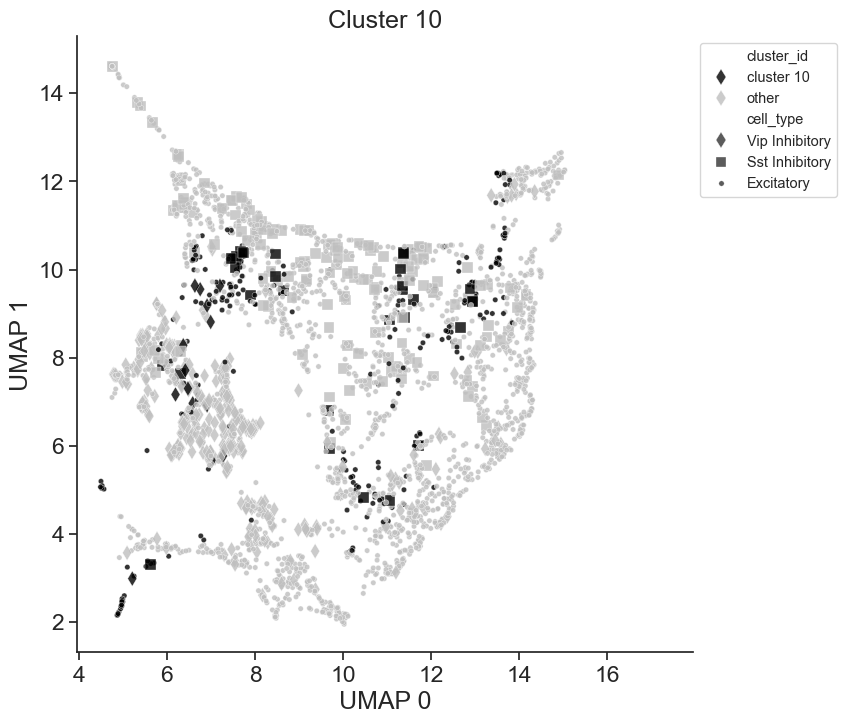

In [ ]:
figsize = (8,8)
fig, ax = plt.subplots(figsize=figsize)

markers_dict = {'Excitatory': '.', # '^'
                'Sst Inhibitory': 's', # 'o', 's'
                'Vip Inhibitory': 'd'}

ax = sns.scatterplot(data=umap_df, x='x', y='y', s=60, ax=ax, #label=labels,
                     hue='cluster_id', hue_order=hue_order, style='cell_type', 
                     palette=palette, markers=markers_dict, linewidth=0.3, alpha=0.8, edgecolor='w')
ax.set_xlabel('UMAP 0')
ax.set_ylabel('UMAP 1')
ax.axis('square')
ax.legend(fontsize='xx-small', title_fontsize='xx-small',  bbox_to_anchor=(1,1))
ax.set_title('Cluster 10')

#### pie charts

In [ ]:
hue_order = ['cluster 2', 'cluster 6', 'cluster 3', 'cluster 4',
             'cluster 9', 'cluster 8', 'cluster 10', 'cluster 12', 
             'other']

palette = ['#aa1016', # novelty enhanced - red #AB0F15, #aa1016 
           '#55a868', # novelty suppressed - light red #E38686, #fc8161, pink #E68C8F, green #55a868
            '#572c92', # novel image coding -  purple #A2258F, #572c92
            '#0b559f', # familiar image coding - blue #0B549D, #0b559f 
            '#8d89c0', # omission coding during novel+ - light purple #9A79C9, #afaed4
            '#539ecd', # omission coding during familiar - light blue #71A9DE, #89bedc 
            '#ccb974', # task coding during familiar - yellow #DBD689
            '#dd8452', # behavior coding - orange #FAB171
            '#BFBFBF',] # non coding - gray #BFBFBF


In [ ]:
labels_dict = {1: 'non-coding', # non coding - gray
                2: 'novelty enhanced', # novel image coding - red #AB0F15
                3: 'novel image coding', # persistent novel image coding -  reddish purple #A2258F
                4: 'familiar image coding', # familiar image coding - blue #0B549D
                5: 'novel image coding', # weird coding -reddish purple
                6: 'novelty suppressed', # novelty suppression - light red #E38686
                7: 'unselective', # everything coding gray
                8: 'familiar omission coding', # omission coding during familiar - light blue #71A9DE
                9: 'novel+ omission coding', # omission coding during novel+ - light purple #9A79C9
                10: 'task coding', # task coding during familiar - yellow #DBD689
                11: 'task coding', # task coding during novel - gray
                12: 'behavior coding', # behavior coding - orange #FAB171
                }
labels = [labels_dict[main_cluster_meta.loc[cell_specimen_id]['cluster_id']] for cell_specimen_id in main_cluster_meta.index.values]


In [ ]:
hue_order = umap_df.cluster_label.unique()
hue_order = [ 'novelty enhanced', 'novelty suppressed',
             'novel image coding', 'familiar image coding', 
             'novel+ omission coding','familiar omission coding', 
             'task coding', 'behavior coding', 'unselective', 'non-coding']

palette = ['#aa1016', # novelty enhanced - red #AB0F15, #aa1016 
           '#55a868', # novelty suppressed - light red #E38686, #fc8161, pink #E68C8F, green #55a868
            '#572c92', # novel image coding -  purple #A2258F, #572c92
            '#0b559f', # familiar image coding - blue #0B549D, #0b559f 
            '#8d89c0', # omission coding during novel+ - light purple #9A79C9, #afaed4
            '#539ecd', # omission coding during familiar - light blue #71A9DE, #89bedc 
            '#ccb974', # task coding during familiar - yellow #DBD689
            '#dd8452', # behavior coding - orange #FAB171
            '#BFBFBF', # unselective
            '#BFBFBF',] # non-coding - gray #BFBFBF


In [ ]:
# get saved umap results
umap_df = processing.get_umap_results(feature_matrix, cluster_meta, save_dir=data_dir, suffix='')
umap_df['cell_specimen_id'] = cluster_meta.index.values
umap_df = umap_df.set_index('cell_specimen_id')

umap_df['cluster_id'] = [cluster_meta.loc[cell_specimen_id]['cluster_id'] for cell_specimen_id in cluster_meta.index.values]
umap_df['cluster_label'] = [labels_dict[cluster_meta.loc[cell_specimen_id]['cluster_id']] for cell_specimen_id in cluster_meta.index.values]
umap_df['cluster_id'] = ['cluster '+str(cluster_meta.loc[cell_specimen_id]['cluster_id']) for cell_specimen_id in cluster_meta.index.values]
umap_df['cell_type'] = [cell_type for cell_type in cluster_meta.cell_type.values]
umap_df.head()

loading umap results from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\clustering\umap_results_df.h5


,x,y,cluster_id,cluster_label,cell_type
cell_specimen_id,,,,,
1086489847,4.780380,7.625232,cluster 12,behavior coding,Vip Inhibitory
1086489860,9.371953,2.737884,cluster 2,novelty enhanced,Vip Inhibitory
1086489891,4.785028,7.619345,cluster 12,behavior coding,Vip Inhibitory
1086489976,6.144250,11.332527,cluster 4,familiar image coding,Sst Inhibitory
1086490002,9.028252,10.901272,cluster 4,familiar image coding,Sst Inhibitory


In [ ]:
cluster_counts = umap_df.groupby(['cell_type', 'cluster_label']).count().rename(columns={'cluster_id':'n_cluster'})[['n_cluster']].reset_index()
cre_counts = umap_df.groupby(['cell_type']).count().rename(columns={'cluster_id':'n_cre'})[['n_cre']].reset_index()
counts = cluster_counts.merge(cre_counts, on='cell_type')
counts['fraction'] = counts['n_cluster']/counts['n_cre']
counts

,cell_type,cluster_label,n_cluster,n_cre,fraction
0,Excitatory,behavior coding,128,3298,0.038811
1,Excitatory,familiar image coding,313,3298,0.094906
2,Excitatory,familiar omission coding,25,3298,0.007580
3,Excitatory,non-coding,722,3298,0.218921
4,Excitatory,novel image coding,687,3298,0.208308
5,Excitatory,novel+ omission coding,29,3298,0.008793
6,Excitatory,novelty enhanced,611,3298,0.185264
7,Excitatory,novelty suppressed,177,3298,0.053669
8,Excitatory,task coding,402,3298,0.121892
9,Excitatory,unselective,204,3298,0.061856


In [ ]:
hue_order = [ 'novelty enhanced', 'novelty suppressed',
             'novel image coding', 'familiar image coding', 
             'novel+ omission coding','familiar omission coding', 
             'task coding', 'behavior coding', 'unselective', 'non-coding']

In [ ]:
cell_type = 'Vip Inhibitory'

data = counts[counts.cell_type==cell_type]

fractions = []
colors = []
cluster_labels = []
for i, cluster_label in enumerate(hue_order): 
    tmp = data[data.cluster_label==cluster_label]
    if len(tmp)>0: 
        fractions.append(tmp.fraction.values[0])
        colors.append(palette[i])
        cluster_labels.append(cluster_label.replace(' ','\n'))


In [ ]:
cluster_labels[3].replace(' ','\n')

'familiar\nomission\ncoding'

C:\Users\marinag\AppData\Local\Temp\ipykernel_5896\839088336.py:22: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 
  wedges, texts, autotexts = ax[i].pie(fractions,


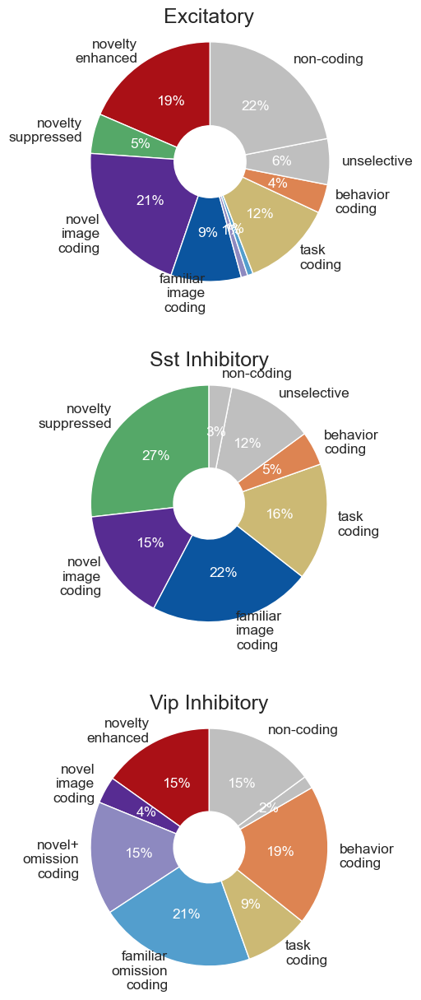

In [ ]:
figsize = (5, 15)
fig, ax = plt.subplots(3, 1, figsize=figsize)

for i, cell_type in enumerate(cell_types): 
    # get data for this cell type, with cluster labels & colors in a specific order
    data = counts[counts.cell_type==cell_type]
    fractions = []
    colors = []
    cluster_labels = []
    for c, cluster_label in enumerate(hue_order): 
        tmp = data[data.cluster_label==cluster_label]
        if len(tmp)>0: 
            fractions.append(tmp.fraction.values[0])
            colors.append(palette[c])
            if tmp.fraction.values[0]<=0.03: 
                label = ''
            else: 
                label = cluster_label.replace(' ','\n')
            cluster_labels.append(label)

    # plot it 
    wedges, texts, autotexts = ax[i].pie(fractions, 
                                        labels=cluster_labels, 
                                        autopct='%.0f%%',
                                        startangle=90, 
                                        wedgeprops={'width': 0.7, 'edgecolor': 'white'},   
                                        textprops={'size': 'x-small'},
                                        colors=colors) # Use a Seaborn color palette
    ax[i].axis('equal') 
    ax[i].set_title(cell_type)
    for autotext in autotexts:
        autotext.set_color('white')

    # Equal aspect ratio ensures that pie is drawn as a circle.
plt.subplots_adjust(hspace=0.3)

## Example cells

#### Reliable matched cells

In [ ]:
# Load reliable example cells 
cache_dir = loading.get_platform_analysis_cache_dir()
filename = 'reliable_matched_cells_omissions_and_changes.csv'
all_matched_reliable_cells = pd.read_csv(os.path.join(cache_dir, filename))
all_matched_reliable_cells = all_matched_reliable_cells.merge(platform_experiments, on=['ophys_experiment_id', 'ophys_container_id'])
example_cells_df = all_matched_reliable_cells.copy()

cell_specimen_ids = example_cells_df.cell_specimen_id.unique()

#### For one cell

cell_specimen_id: 1086514606
experience_level: Familiar
ophys_experiment_id: 989213060


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


experience_level: Novel
ophys_experiment_id: 990400778


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


experience_level: Novel +
ophys_experiment_id: 991852002


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_single_cell_examples.py:1548: UserWarning: FixedFormatter should only be used together with FixedLocator
 

saving plot for 1086514606
saved


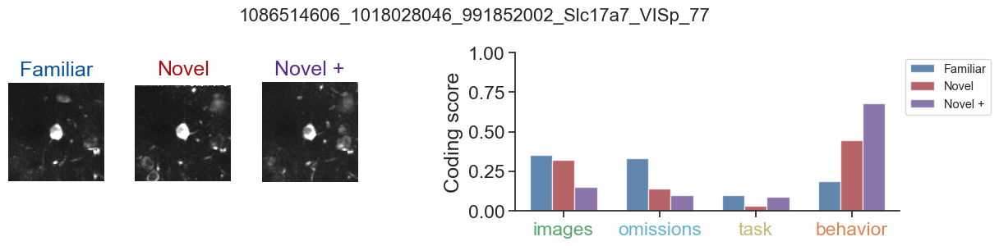

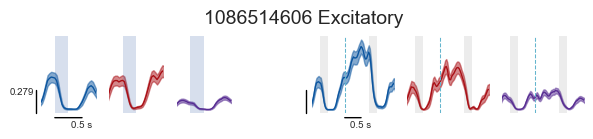

In [ ]:
cell_specimen_id = cell_specimen_ids[9]
cell_specimen_id = 1086515505
cell_specimen_id = 1086514606

cell_metadata = matched_cells_table[matched_cells_table.cell_specimen_id==cell_specimen_id]
cell_dropouts = results_pivoted[results_pivoted.cell_specimen_id==cell_specimen_id]

pse.plot_matched_roi_and_coding_scores(cell_metadata, cell_dropouts, platform_experiments, save_dir=save_dir)

pse.plot_cell_change_and_omission_responses(change_mdf, omission_mdf, cell_specimen_id, 
                                            save_dir=save_dir, folder='single_cell_roi_and_coding_scores')


#### Selected cells

In [ ]:
cell_specimen_ids = [1086581474, 
                     1086615099,
                     1086615304,
                     1086627527,
                     1086618157,
                     1086617472,
                     1086529704,
                     1086620671,
                     1086501719,
                     1086551881,
                     1086619787,
                     1086628708]

In [ ]:
# for cell_specimen_id in cell_specimen_ids:

#     cell_metadata = matched_cells_table[matched_cells_table.cell_specimen_id==cell_specimen_id]
#     cell_dropouts = results_pivoted[results_pivoted.cell_specimen_id==cell_specimen_id]

#     pse.plot_matched_roi_and_coding_scores(cell_metadata, cell_dropouts, platform_experiments, save_dir=save_dir)

#     pse.plot_cell_change_and_omission_responses(change_mdf, omission_mdf, cell_specimen_id, 
#                                                 save_dir=save_dir, folder='single_cell_roi_and_coding_scores')


#### Cells in main fig

cell_specimen_id: 1086628708
experience_level: Familiar
ophys_experiment_id: 882551935


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


experience_level: Novel
ophys_experiment_id: 882968564


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


experience_level: Novel +
ophys_experiment_id: 885146239


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_single_cell_examples.py:1548: UserWarning: FixedFormatter should only be used together with FixedLocator
 

saving plot for 1086628708
saved


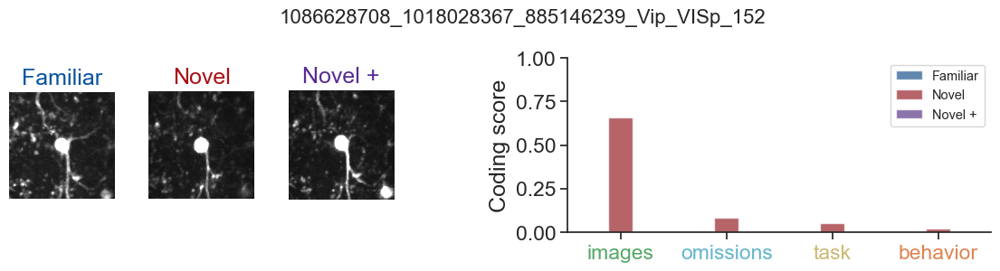

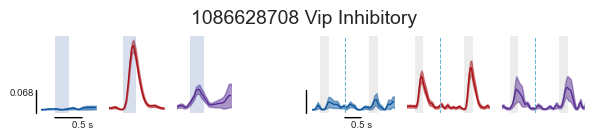

In [ ]:
cell_specimen_id = 1086620671
cell_specimen_id = 1086628708

cell_metadata = matched_cells_table[matched_cells_table.cell_specimen_id==cell_specimen_id]
cell_dropouts = results_pivoted[results_pivoted.cell_specimen_id==cell_specimen_id]

pse.plot_matched_roi_and_coding_scores(cell_metadata, cell_dropouts, platform_experiments, save_dir=save_dir)

pse.plot_cell_change_and_omission_responses(change_mdf, omission_mdf, cell_specimen_id, 
                                            save_dir=save_dir, folder='single_cell_roi_and_coding_scores')


#### For well matched cells

##### get cells that are well matched across days and have high var explained

In [ ]:
cell_specimen_dir = loading.get_platform_analysis_cache_dir()
cell_specimen_dir = os.path.join(cell_specimen_dir, 'cell_specimen_tables')

cells = pd.read_csv(os.path.join(cell_specimen_dir, 'meso_cell_specimen_table.csv'), index_col=0)

In [ ]:
matched_cells = cells[cells.cell_specimen_id.isin(matched_cells_table.cell_specimen_id.unique())]

std = matched_cells.groupby(['cell_specimen_id']).std()
mean = matched_cells.groupby(['cell_specimen_id']).mean()

C:\Users\marinag\AppData\Local\Temp\ipykernel_31024\164514183.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  std = matched_cells.groupby(['cell_specimen_id']).std()
C:\Users\marinag\AppData\Local\Temp\ipykernel_31024\164514183.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean = matched_cells.groupby(['cell_specimen_id']).mean()


In [ ]:
small_size_diff_cells = list(std[std.roi_size<20].index.unique())
small_aspect_diff_cells = list(std[std.roi_width_over_height<0.1].index.unique())
consistent_cells = small_size_diff_cells + small_aspect_diff_cells

In [ ]:
# high var explained cells that are also consistent over days
good_cells = all_results[(all_results.variance_explained_full>0.2) & 
                                     (all_results.cell_specimen_id.isin(consistent_cells))]

In [ ]:
good_cells = good_cells.drop_duplicates(subset=['cell_specimen_id', 'ophys_experiment_id'])

good_sessions = good_cells.groupby(['cre_line', 'ophys_session_id']).count()
best_sessions = good_sessions[good_sessions.dropout>5].reset_index().ophys_session_id.unique()
print(len(best_sessions))
good_experiments = good_cells.groupby(['cre_line', 'ophys_experiment_id']).count()
best_experiments = good_experiments[good_experiments.dropout>3].reset_index().ophys_experiment_id.unique()
print(len(best_experiments))

15
8


In [ ]:
cell_specimen_ids = good_cells[good_cells.ophys_experiment_id.isin(best_experiments)].cell_specimen_id.unique()
print(len(cell_specimen_ids))

22


##### Plot for all cells

In [ ]:
# for cell_specimen_id in cell_specimen_ids:

#     try:
#         cell_metadata = matched_cells_table[matched_cells_table.cell_specimen_id==cell_specimen_id]
#         cell_dropouts = results_pivoted[results_pivoted.cell_specimen_id==cell_specimen_id]

#         pse.plot_matched_roi_and_coding_scores(cell_metadata, cell_dropouts, platform_experiments, save_dir=save_dir)

#         pse.plot_cell_change_and_omission_responses(change_mdf, omission_mdf, cell_specimen_id, 
#                                                     save_dir=save_dir, folder='single_cell_roi_and_coding_scores')
#     except:
#         print('cant plot for', cell_specimen_id)

#### Cells with high explained variance

In [ ]:
cell_type = 'Sst Inhibitory'
cell_type = 'Vip Inhibitory'
cell_type = 'Excitatory'


# csids = cluster_meta[(cluster_meta.cluster_id==2) & (cluster_meta.cell_type==cell_type)].index.unique()
# csids = cluster_meta[(cluster_meta.cell_type==cell_type)].index.unique()
csids = matched_cells.cell_specimen_id.unique()
csids = all_results[(all_results.cell_specimen_id.isin(csids)) & (all_results.variance_explained_full>0.3)].cell_specimen_id.unique()

csids

array([1086509036, 1086514638, 1086619787, 1086516100, 1086517398,
       1086522580, 1086511294, 1086556879, 1086574138, 1086559937,
       1120116578, 1086514839, 1086512165, 1120095997, 1120095742,
       1120094089, 1120094211, 1086516067, 1086510529, 1120093580,
       1120093470, 1086524562, 1086531095, 1086514966, 1086512795,
       1086522715, 1086535682, 1086537571, 1086532555, 1086538633,
       1086559786, 1086519201, 1120091318, 1086518655, 1086514374,
       1086526678, 1086519680, 1086512917, 1086519261, 1086574614,
       1086579052, 1086580238, 1086580295, 1086581176, 1086570799,
       1086579643, 1086565334, 1086573026, 1086528784, 1086581474,
       1086572621, 1086581538, 1086581760, 1086583099, 1086545900,
       1086575766, 1086558573, 1086547630, 1086548118, 1086556532,
       1086552709, 1086553836, 1086559206, 1086558510, 1086559885,
       1086541783, 1120101680, 1120104599, 1120108018, 1120097060,
       1120104862, 1120095435, 1120099553, 1120110856, 1120101

##### Plot for all cells

In [ ]:
# for cell_specimen_id in csids:

#     try:

#         cell_metadata = matched_cells_table[matched_cells_table.cell_specimen_id==cell_specimen_id]
#         cell_dropouts = results_pivoted[results_pivoted.cell_specimen_id==cell_specimen_id]

#         pse.plot_matched_roi_and_coding_scores(cell_metadata, cell_dropouts, platform_experiments, save_dir=save_dir)

#         pse.plot_cell_change_and_omission_responses(change_mdf, omission_mdf, cell_specimen_id, 
#                                                     save_dir=save_dir, folder='single_cell_roi_and_coding_scores')
#     except:
#         pass

## Clustering results

### Coding scores for clusters

#### Coding score heatmaps

<AxesSubplot:>

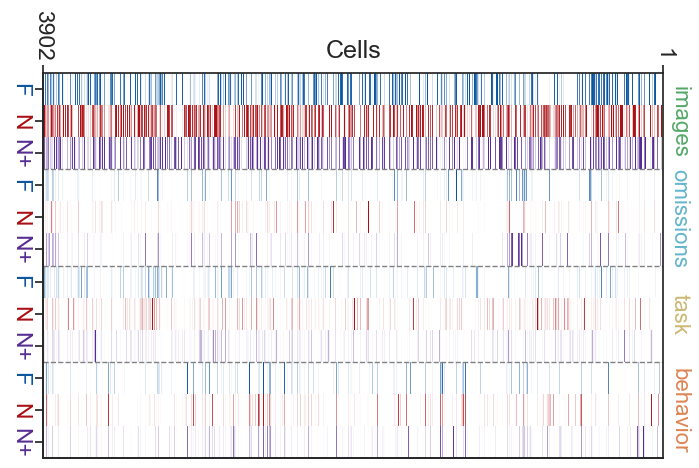

In [ ]:
# plot unsorted coding scores for matched cells
cluster_meta_tmp = cluster_meta.copy()
cluster_meta_tmp['cell_index'] = cluster_meta_tmp.index.values
plotting.plot_coding_score_heatmap_remapped(cluster_meta_tmp, feature_matrix, sort_by=None, session_colors=True,
                                    save_dir=save_dir, folder='clustering_results')

### Check strategy model relationship to individual mouse clusters

#### test individual Vips

In [ ]:
# cluster_meta_tmp = cluster_meta.copy()
# cluster_meta_tmp = cluster_meta_tmp[cluster_meta_tmp.cell_type=='Vip Inhibitory']
# mouse_ids = cluster_meta_tmp.mouse_id.unique()
# # for mouse_id in mouse_ids: 
# mouse_id = mouse_ids[0]
# tmp = cluster_meta_tmp[cluster_meta_tmp.mouse_id==mouse_id].copy()
# cell_specimen_ids = tmp.index.unique()

# xlim_seconds = [-1.1, 1.5]

# mdf = omission_mdf.copy()
# mdf = mdf[mdf.cell_specimen_id==cell_specimen_id]

# axes_column = 'cell_type'
# hue_column = 'experience_level'
# ax = ppf.plot_population_averages_for_conditions(mdf, 'events', 'omissions', axes_column, hue_column,
#                                                     horizontal=False, xlabel='Time from omission (s)',
#                                                     ylabel='Average calcium event magnitude', legend=False,
#                                                     xlim_seconds=xlim_seconds, interval_sec=1,
#                                                     palette=utils.get_experience_level_colors(), ax=None, title=None, suptitle='All cells',
#                                                     save_dir=None, folder=None, suffix=None)

In [ ]:
# tmp = cluster_meta_tmp[cluster_meta_tmp.mouse_id==mouse_id].copy()
# tmp['cell_index'] = tmp.index.values
# tmp.experience_level.unique()

In [ ]:
# mdf = omission_mdf.copy()

# # plot coding scores for matched cells sorted by clusters
# cluster_meta_tmp = cluster_meta.copy()
# cluster_meta_tmp = cluster_meta_tmp[cluster_meta_tmp.cell_type=='Vip Inhibitory']
# mouse_ids = cluster_meta_tmp.mouse_id.unique()
# for mouse_id in mouse_ids: 
#     tmp = cluster_meta_tmp[cluster_meta_tmp.mouse_id==mouse_id].copy()
#     cre = tmp.cell_type.values[0][:3]
#     tmp['cell_index'] = tmp.index.values

#     figsize = (16,5)
#     fig, ax = plt.subplots(1, 2, figsize=figsize)    
#     ax = ax.ravel()
#     plotting.plot_coding_score_heatmap_remapped(tmp, feature_matrix, session_colors=True,
#                                         save_dir=None, folder='clustering_results', ax=ax[0])
    
        
#     xlim_seconds = [-1.1, 1.5]
#     mdf_tmp = mdf[mdf.mouse_id==str(mouse_id)]
#     axes_column = 'cell_type'
#     hue_column = 'experience_level'

#     for c,experience_level in enumerate(utils.get_experience_levels()):
#         cdf = mdf_tmp[(mdf_tmp['experience_level'] == experience_level)]
#         traces = cdf.mean_trace.values
#         timestamps = cdf.trace_timestamps.values[0]
#         # plot average of all traces for this condition
#         ax[1] = utils.plot_mean_trace(np.asarray(traces), timestamps, ylabel='Events', 
#                                         legend_label='experience_level', color=utils.get_experience_level_colors()[c], interval_sec=1,
#                                         xlim_seconds=xlim_seconds, ax=ax[1])
#         # plot stimulus timing overlaid on trace
#         ax[1] = utils.plot_flashes_on_trace(ax[1], timestamps, change=False, omitted=True)
#         ax[1].set_xlabel('Time after omission (s)',)
#         ax[1].set_title('Mouse ID = '+str(mouse_id))

#     # ax[1] = ppf.plot_population_averages_for_conditions(mdf_tmp, 'events', 'omissions', axes_column, hue_column,
#     #                                                     horizontal=False, xlabel='Time from omission (s)',
#     #                                                     ylabel='Average calcium event magnitude', legend=False,
#     #                                                     xlim_seconds=xlim_seconds, interval_sec=1,
#     #                                                     palette=utils.get_experience_level_colors(), ax=ax[1], title=None, suptitle='All cells',
#         #                                                     save_dir=None, folder=None, suffix=None)
#     plt.subplots_adjust(wspace=0.3)
#     utils.save_figure(fig, figsize, save_dir, 'clustered_coding_scores_and_pop_response_per_mouse', 'mouse_id_'+str(mouse_id)+'_'+cre)



#### What is the behavior strategy for each mouse? 

In [ ]:
data_path = r"\\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\behavior_model_output\_mouse_summary_table.csv"
strategy_metrics = pd.read_csv(data_path)
strategy_metrics.head()

,donor_id,container_id,specimen_id,mouse_id,super_container_id,trained_A,trained_B,num_hits,num_fa,num_cr,...,prior_timing1D,dropout_timing1D,avg_weight_timing1D,avg_weight_timing1D_1st_half,avg_weight_timing1D_2nd_half,strategy_weight_index,strategy_weight_index_1st_half,strategy_weight_index_2nd_half,cre_line,strategy
0,722884873,782536745.0,722884882.0,403491.0,722884882.0,1.0,0.0,68.50,6.00,8.000000,...,0.287339,-25.366901,5.178888,4.793678,5.536401,-3.616697,-3.428666,-3.785323,Slc17a7-IRES2-Cre,timing
1,744911447,791352433.0,744911458.0,412036.0,744911458.0,1.0,0.0,87.75,4.50,18.750000,...,0.099120,-10.692702,2.067635,3.166991,1.036528,-0.449086,-1.525412,0.564005,Vip-IRES-Cre,timing
2,756674776,814796612.0,756674785.0,412366.0,756674785.0,1.0,0.0,74.75,10.25,10.000000,...,0.070061,-35.677267,5.395391,5.679159,5.114147,-4.957389,-5.242588,-4.674730,Slc17a7-IRES2-Cre,timing
3,760949537,814797528.0,760949544.0,421136.0,760949544.0,1.0,0.0,70.00,4.00,18.333333,...,0.254602,-15.726946,2.205734,3.461059,1.037516,-0.329666,-1.442718,0.701965,Vip-IRES-Cre,timing
4,772622642,803589437.0,772622653.0,425496.0,772622653.0,1.0,0.0,147.00,7.00,22.250000,...,0.102306,-12.122514,2.589783,3.229039,1.979653,0.425635,-0.078688,0.911693,Slc17a7-IRES2-Cre,visual


In [ ]:
strategy_metrics.columns

Index(['donor_id', 'container_id', 'specimen_id', 'mouse_id',
       'super_container_id', 'trained_A', 'trained_B', 'num_hits', 'num_fa',
       'num_cr', 'num_miss', 'num_aborts', 'fraction_engaged', 'session_roc',
       'lick_fraction', 'lick_fraction_1st_half', 'lick_fraction_2nd_half',
       'lick_hit_fraction', 'lick_hit_fraction_1st_half',
       'lick_hit_fraction_2nd_half', 'trial_hit_fraction',
       'trial_hit_fraction_1st_half', 'trial_hit_fraction_2nd_half',
       'strategy_dropout_index', 'visual_only_dropout_index',
       'timing_only_dropout_index', 'prior_bias', 'dropout_bias',
       'avg_weight_bias', 'avg_weight_bias_1st_half',
       'avg_weight_bias_2nd_half', 'prior_omissions', 'dropout_omissions',
       'avg_weight_omissions', 'avg_weight_omissions_1st_half',
       'avg_weight_omissions_2nd_half', 'prior_omissions1',
       'dropout_omissions1', 'avg_weight_omissions1',
       'avg_weight_omissions1_1st_half', 'avg_weight_omissions1_2nd_half',
       'pri

Text(0.5, 0, 'strategy_weight_index')

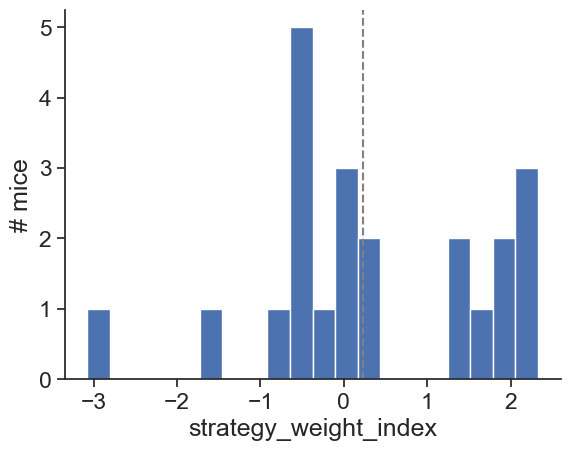

In [ ]:
metric = 'strategy_weight_index'

data = strategy_metrics[strategy_metrics.cre_line=='Vip-IRES-Cre']
mouse_data = strategy_metrics[strategy_metrics.mouse_id==453990]

plt.hist(data[metric].values, bins=20);
plt.axvline(x=mouse_data[metric].values[0], linestyle='--', color='gray')
plt.ylabel('# mice')
plt.xlabel(metric)

Text(0.5, 0, 'strategy_dropout_index')

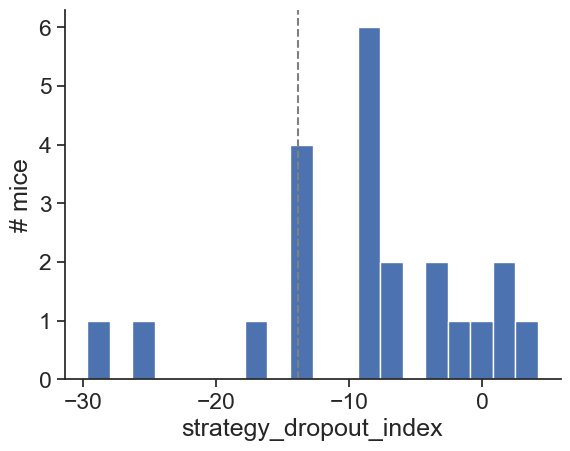

In [ ]:
metric = 'strategy_dropout_index'

data = strategy_metrics[strategy_metrics.cre_line=='Vip-IRES-Cre']
mouse_data = strategy_metrics[strategy_metrics.mouse_id==453990]

plt.hist(data[metric].values, bins=20);
plt.axvline(x=mouse_data[metric].values[0], linestyle='--', color='gray')
plt.ylabel('# mice')
plt.xlabel(metric)

In [ ]:
# mouse_id = 453990
# # mouse_id = 523922
# ophys_experiment_id = platform_experiments[(platform_experiments.mouse_id==mouse_id) & 
#                                            (platform_experiments.experience_level=='Familiar')].index.values[0]
# dataset = loading.get_ophys_dataset(ophys_experiment_id)

In [ ]:
# Fig, ax = plt.subplots(figsize=(10, 3))
# ax.plot(dataset.running_speed.timestamps.values, dataset.running_speed.speed.values)
# ax.set_ylabel('running speed\n(cm/s)')
# ax.set_title(str(mouse_id)+' - '+'Familiar')

In [ ]:
# Fig, ax = plt.subplots(figsize=(10, 3))
# ax.plot(dataset.running_speed.timestamps.values, dataset.running_speed.speed.values)
# ax.set_ylabel('running speed\n(cm/s)')
# ax.set_title(str(mouse_id)+' - '+'Familiar')

In [ ]:
# # plot coding scores for matched cells sorted by clusters
# cluster_meta_tmp = cluster_meta.copy()
# cluster_meta_tmp = cluster_meta_tmp[cluster_meta_tmp.cell_type=='Vip Inhibitory']
# mouse_ids = cluster_meta_tmp.mouse_id.unique()
# for mouse_id in mouse_ids: 
#     tmp = cluster_meta_tmp[cluster_meta_tmp.mouse_id==mouse_id].copy()
#     tmp['cell_index'] = tmp.index.values
#     fig, ax = plt.subplots()    
#     plotting.plot_coding_score_heatmap_remapped(tmp, feature_matrix, session_colors=True,
#                                         save_dir=None, folder='clustering_results', ax=ax)
#     ax.set_title(mouse_id)



<AxesSubplot:xlabel='Cluster ID'>

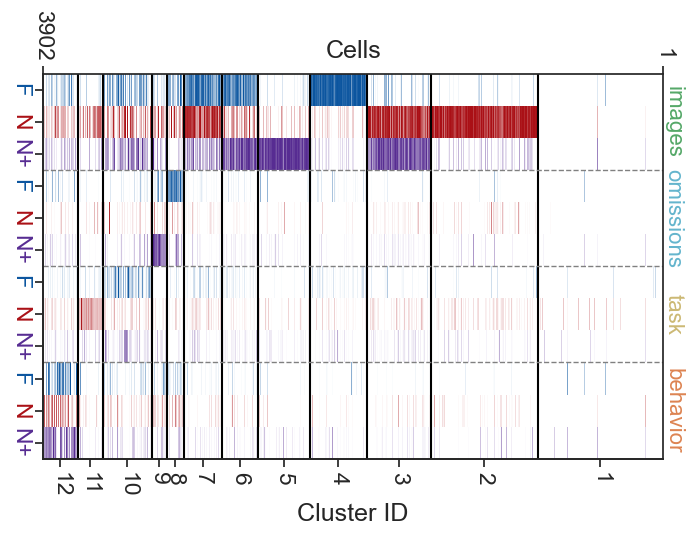

In [ ]:
# plot coding scores for matched cells sorted by clusters
cluster_meta_tmp = cluster_meta.copy()
cluster_meta_tmp['cell_index'] = cluster_meta_tmp.index.values
plotting.plot_coding_score_heatmap_remapped(cluster_meta_tmp, feature_matrix, session_colors=True,
                                    save_dir=save_dir, folder='clustering_results')

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:1547: FutureWarning: merging between different levels is deprecated and will be removed in a future version. (2 levels on the left, 1 on the right)
  cluster_means = feature_matrix.merge(cluster_meta[['cluster_id']], on='cell_specimen_id').groupby('cluster_id').mean()


<AxesSubplot:ylabel='Cluster ID'>

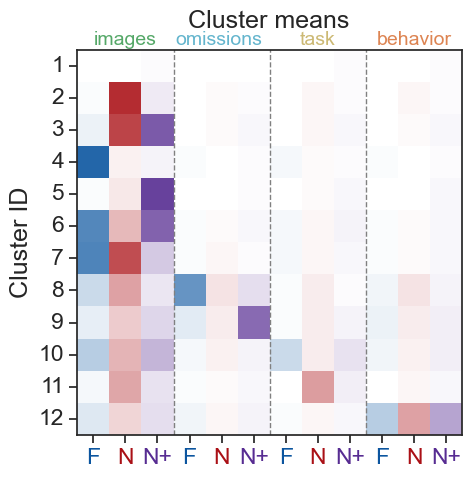

In [ ]:
# plot average of each cluster
plotting.plot_cluster_means_remapped(feature_matrix, cluster_meta, save_dir=save_dir, folder='clustering_results')

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:1558: FutureWarning: merging between different levels is deprecated and will be removed in a future version. (2 levels on the left, 1 on the right)
  cre_line_means = feature_matrix.merge(cluster_meta[['cre_line']], on='cell_specimen_id').groupby('cre_line').mean()


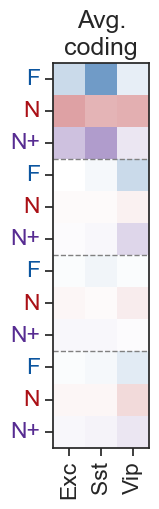

In [ ]:
# plot average coding scores for each cre line (average of matched cells only)
plotting.plot_cre_line_means_remapped(feature_matrix, cluster_meta, save_dir=save_dir, folder='clustering_results')

array([<AxesSubplot:title={'center':'Cluster 1\n20.2% n=789'}>,
       <AxesSubplot:title={'center':'Cluster 2\n17.3% n=673'}>,
       <AxesSubplot:title={'center':'Cluster 3\n10.4% n=404'}>,
       <AxesSubplot:title={'center':'Cluster 4\n9.1% n=356'}>,
       <AxesSubplot:title={'center':'Cluster 5\n8.4% n=328'}>,
       <AxesSubplot:title={'center':'Cluster 6\n5.9% n=229'}>,
       <AxesSubplot:title={'center':'Cluster 7\n6.0% n=234'}>,
       <AxesSubplot:title={'center':'Cluster 8\n2.9% n=112'}>,
       <AxesSubplot:title={'center':'Cluster 9\n2.4% n=92'}>,
       <AxesSubplot:title={'center':'Cluster 10\n8.0% n=311'}>,
       <AxesSubplot:title={'center':'Cluster 11\n4.1% n=158'}>,
       <AxesSubplot:title={'center':'Cluster 12\n5.5% n=215'}>],
      dtype=object)

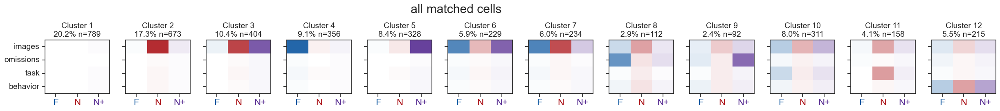

In [ ]:
# plot average of each cluster as separate heatmaps
clusters = cluster_meta.value_counts('cluster_id').index.values 
plotting.plot_mean_cluster_heatmaps_remapped(feature_matrix, cluster_meta, sort_by='cluster_id', 
                                             save_dir=save_dir, folder='clustering_results')

### New figure with aligned panels per cluster

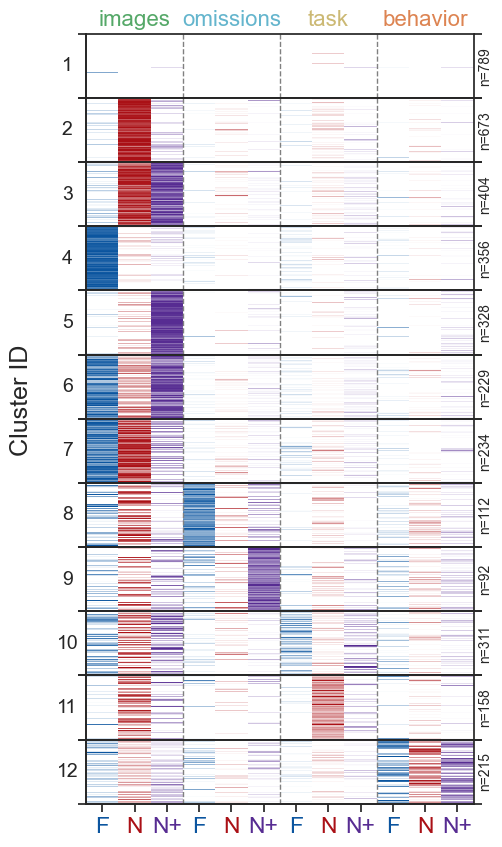

In [ ]:
plotting.plot_coding_score_heatmap_matched(cluster_meta, feature_matrix, sort_by='cluster_id',
                                        session_colors=True, experience_index=None, title='',
                                        save_dir=save_dir, folder='clustering_results', suffix='', ax=None);

### Population average responses

#### Remove outliers

In [ ]:
threshold_percentile = 99.8
image_mdf_clean, image_outliers = processing.remove_outliers(image_mdf, threshold_percentile)
change_mdf_clean, change_outliers = processing.remove_outliers(change_mdf, threshold_percentile)
omission_mdf_clean, omission_outliers = processing.remove_outliers(omission_mdf, threshold_percentile)


#### Population averages split by experience level

Familiar
Novel
Novel +


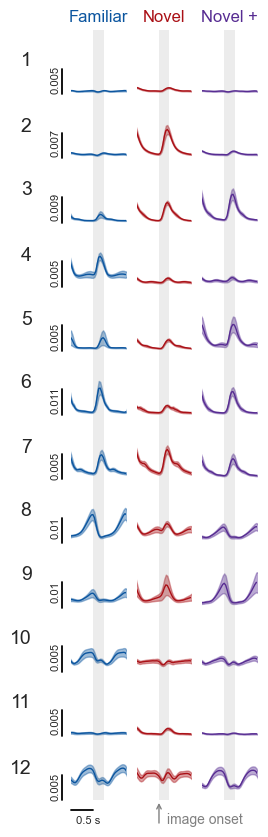

In [ ]:
# plot averages for all cells split by exp level

event_type = 'images'
plotting.plot_population_average_response_for_clusters_as_rows_split(image_mdf_clean, event_type, 
                                                                     cluster_order=None, save_dir=save_dir, ax=None);
   

Familiar
Novel
Novel +


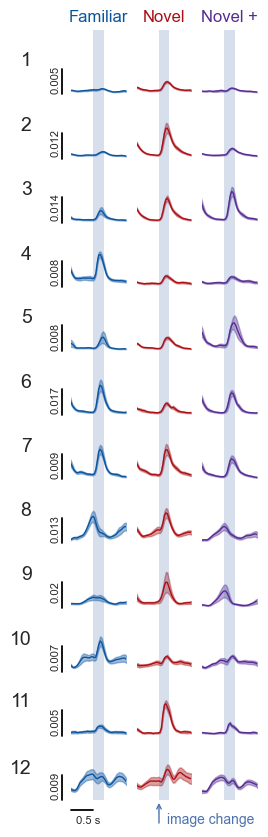

In [ ]:
# plot averages for all cells split by exp level

event_type = 'changes'
plotting.plot_population_average_response_for_clusters_as_rows_split(change_mdf_clean, event_type, with_pre_change=False,
                                                                     cluster_order=None, save_dir=save_dir, ax=None);
   

Familiar
Novel
Novel +


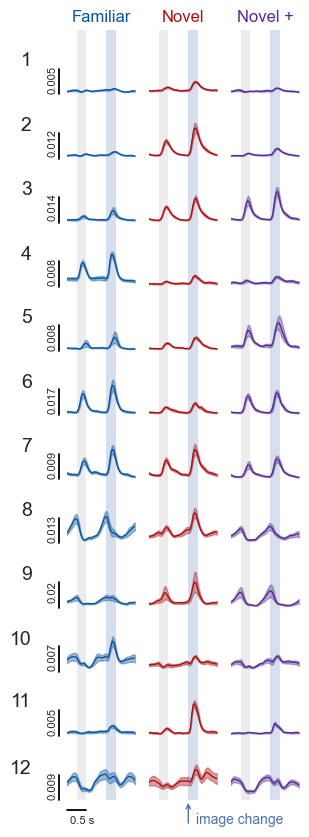

In [ ]:
# plot averages for all cells split by exp level

event_type = 'changes'
plotting.plot_population_average_response_for_clusters_as_rows_split(change_mdf_clean, event_type, with_pre_change=True,
                                                                     cluster_order=None, save_dir=save_dir, ax=None);
   

Familiar
Novel
Novel +


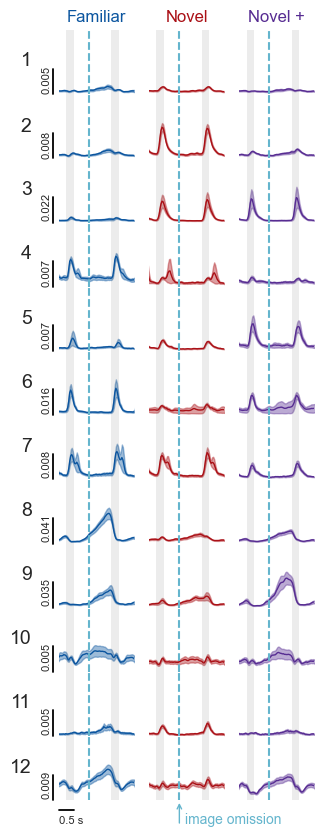

In [ ]:
# plot averages for all cells split by exp level

event_type = 'omissions'
plotting.plot_population_average_response_for_clusters_as_rows_split(omission_mdf_clean, event_type, with_pre_change=True,
                                                                     cluster_order=None, save_dir=save_dir, ax=None);
   

#### Population averages overlaid

12 3


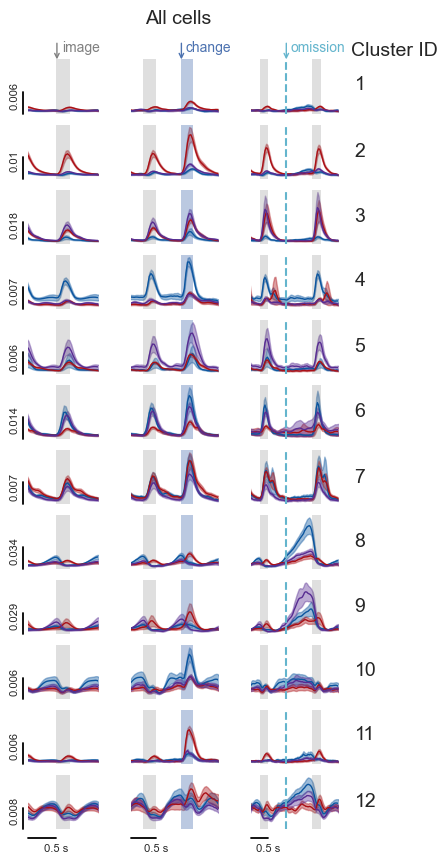

In [ ]:
# all cre lines together
suptitle = 'All cells'

plotting.plot_population_average_response_for_clusters_as_rows_all_response_types(image_mdf_clean, change_mdf_clean, omission_mdf_clean, 
                                                                             save_dir=save_dir, suptitle=suptitle, cluster_order=None, ax=None);

10 3


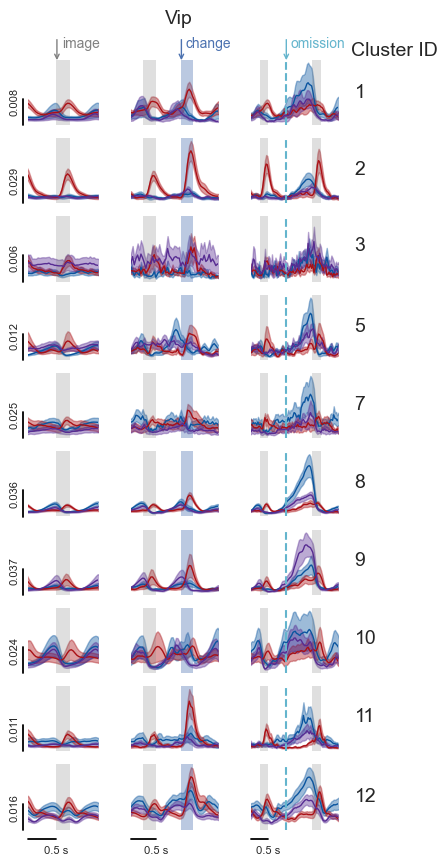

In [ ]:
# all cre lines together
cre_line = 'Vip-IRES-Cre'

image_mdf_clean_cre = image_mdf_clean[image_mdf_clean.cre_line==cre_line]
change_mdf_clean_cre = change_mdf_clean[change_mdf_clean.cre_line==cre_line]
omission_mdf_clean_cre = omission_mdf_clean[omission_mdf_clean.cre_line==cre_line]


plotting.plot_population_average_response_for_clusters_as_rows_all_response_types(image_mdf_clean_cre, change_mdf_clean_cre, omission_mdf_clean_cre, 
                                                                             save_dir=save_dir, suffix=cre_line[:3], 
                                                                             suptitle=cre_line[:3], cluster_order=None, ax=None);


#### Plot clusters, % cells, and population averages combined

12
12 3


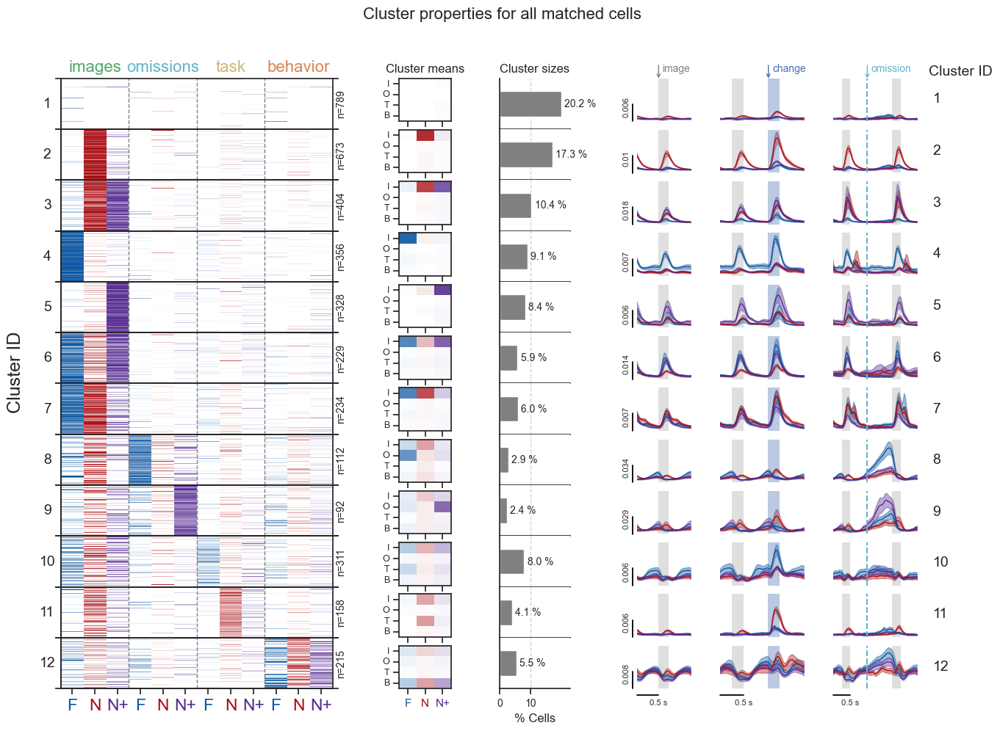

In [ ]:
cre_line = 'all'

tmp = cluster_meta.copy()
tmp['cre_line'] = 'all'

plotting.plot_cluster_properties_combined(tmp, feature_matrix, cre_line, 
                                     image_mdf, change_mdf, omission_mdf, save_dir=save_dir)

12
12 3


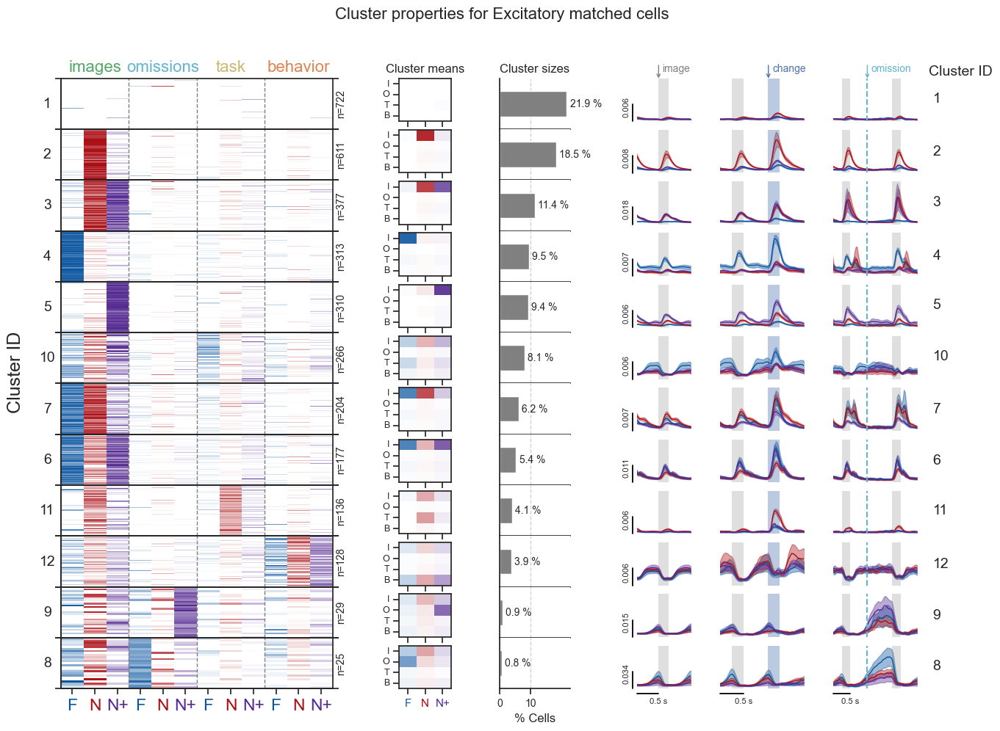

In [ ]:
cre_line = 'Slc17a7-IRES2-Cre'

plotting.plot_cluster_properties_combined(cluster_meta, feature_matrix, cre_line, 
                                     image_mdf, change_mdf, omission_mdf, save_dir=save_dir, sort_by='cluster_size')

8
8 3


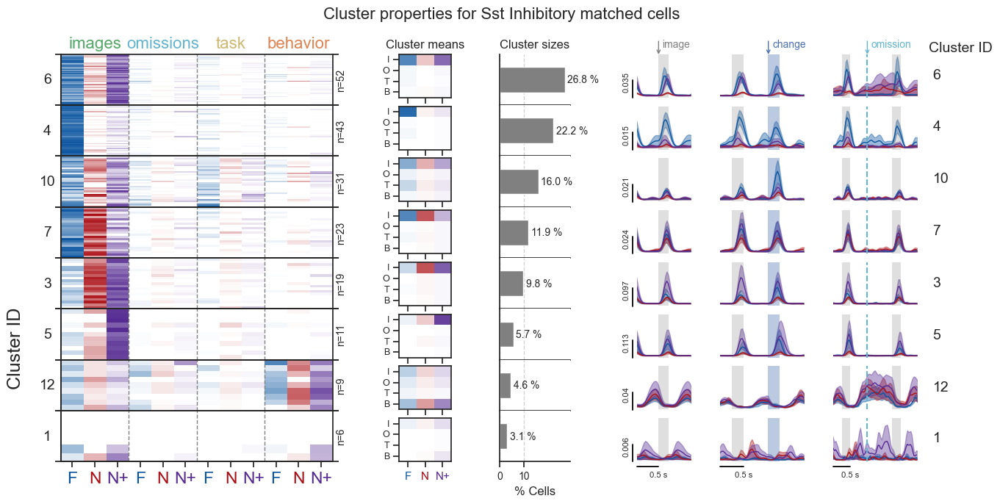

In [ ]:
cre_line = 'Sst-IRES-Cre'

plotting.plot_cluster_properties_combined(cluster_meta, feature_matrix, cre_line, 
                                     image_mdf, change_mdf, omission_mdf, save_dir=save_dir, sort_by='cluster_size')

10
10 3


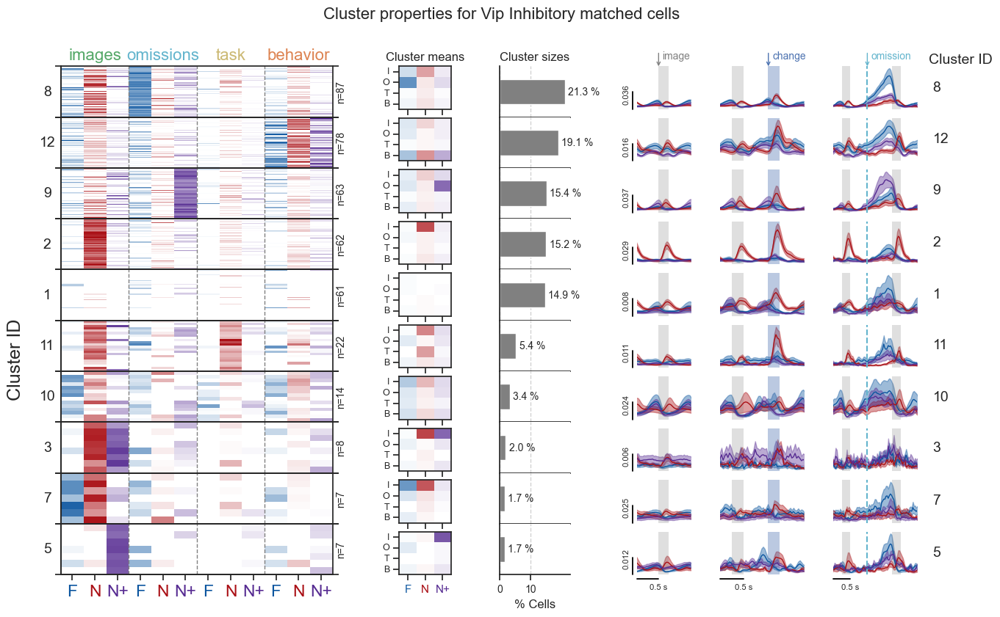

In [ ]:
cre_line = 'Vip-IRES-Cre'

plotting.plot_cluster_properties_combined(cluster_meta, feature_matrix, cre_line, 
                                     image_mdf, change_mdf, omission_mdf, save_dir=save_dir, sort_by='cluster_size')

#### heatmaps

18 total removed
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response within session
sort by mean response

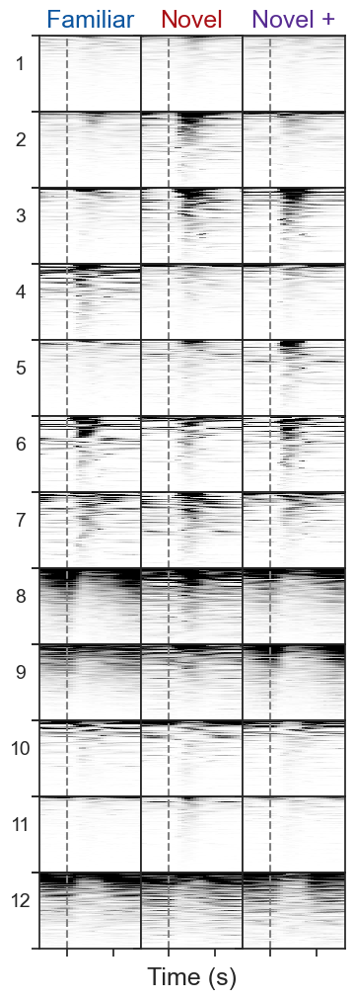

In [ ]:
plotting.plot_cell_response_heatmaps_for_clusters(image_mdf, data_type='events', event_type='images', 
                                                vmax=0.0005, xlim_seconds=[-0.3, 0.8], ax=None);

### % cells in each cluster & of each type

In [ ]:
# plotting.plot_percent_cells_per_cluster_all_cre(cluster_meta, horiz=False, col_to_group='cre_line', save_dir=save_dir)

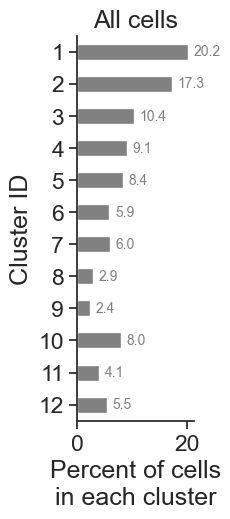

In [ ]:
plotting.plot_percent_cells_per_cluster_all_cre(cluster_meta, col_to_group='cre_line', save_dir=save_dir)

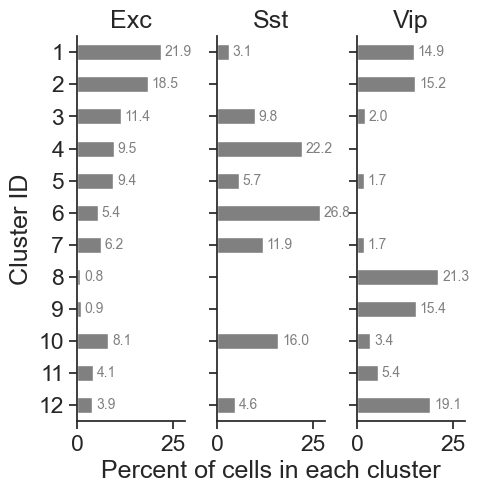

In [ ]:
plotting.plot_percent_cells_per_cluster_per_cre(cluster_meta, cluster_order=None, col_to_group='cre_line', 
                                                save_dir=save_dir)

#### % cells per cluster colored by dominant feature

In [ ]:
clustering_results = r'\\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\clustering'

In [ ]:
# save_dir = r'\\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_plots\figure_4\all_cre_clustering_113023'
metrics = processing.generate_merged_table_of_coding_score_and_model_free_metrics(cluster_meta, results_pivoted,
                                                                 data_type='events',
                                                                 session_subset='full_session',
                                                                 inclusion_criteria='platform_experiment_table',
                                                                 save_dir=clustering_results)


# Replace dominant experience level cluster with correct one
cluster_metrics = processing.get_coding_score_metrics_for_clusters(cluster_meta, results_pivoted)

cluster_metrics = cluster_metrics.rename(columns={'dominant_experience_level':'dominant_experience_level_cluster', 
                                                  'dominant_feature': 'dominant_feature_cluster'})


metrics = metrics.rename(columns={'dominant_experience_level_cluster':'dominant_experience_level_old', 
                                                  'dominant_feature_cluster': 'dominant_feature_old'})

response_metrics = metrics.merge(cluster_metrics.reset_index()[['cluster_id', 'dominant_experience_level_cluster', 'dominant_feature_cluster']])

# response_metrics.groupby(['cre_line', 'cluster_id', 'dominant_experience_level_cluster']).count()

loading coding score and model free metrics table


In [ ]:
# check that cluster 6 is reclassified as task 
response_metrics.groupby(['dominant_feature_cluster', 'cluster_id']).count()

cell_specimen_id  experience_level  \
dominant_feature_cluster cluster_id                                       
all-images               1                       2367              2367   
                         2                       2019              2019   
                         3                       1212              1212   
                         4                       1068              1068   
                         5                        984               984   
                         6                        687               687   
                         7                        702               702   
behavioral               12                       645               645   
omissions                8                        336               336   
                         9                        276               276   
task                     10                       933               933   
                         11                       474               474   

                                     all-images  omissions  task  behavioral  \
dominant_feature_cluster cluster_id                                            
all-images               1                 2367       2367  2367        2367   
                         2                 2019       2019  2019        2019   
                         3                 1212       1212  1212        1212   
                         4                 1068       1068  1068        1068   
                         5                  984        984   984         984   
                         6                  687        687   687         687   
                         7                  702        702   702         702   
behavioral               12                 645        645   645         645   
omissions                8                  336        336   336         336   
                         9                  276        276   276         276   
task                     10                 933        933   933         933   
                         11                 474        474   474         474   

                                     ophys_experiment_id  max_coding_score  \
dominant_feature_cluster cluster_id                                          
all-images               1                          2367                 0   
                         2                          2019                 0   
                         3                          1212                 0   
                         4                          1068                 0   
                         5                           984                 0   
                         6                           687                 0   
                         7                           702                 0   
behavioral               12                          645                 0   
omissions                8                           336                 0   
                         9                           276                 0   
task                     10                          933                 0   
                         11                          474                 0   

                                     dominant_feature  \
dominant_feature_cluster cluster_id                     
all-images               1                       2367   
                         2                       2019   
                         3                       1212   
                         4                       1068   
                         5                        984   
                         6                        687   
                         7                        702   
behavioral               12                       645   
omissions                8                        336   
                         9                        276   
task                     10                       933   
                         11    

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:2564: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.barplot(data=cre_data, y='cluster_id', x='percent_cells', order=order, orient='h',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:2564: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.barplot(data=cre_data, y='cluster_id', x='percent_cells', order=order, orient='h',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:2564: FutureWarning: 

Passing `palette` without assigning `hue` 

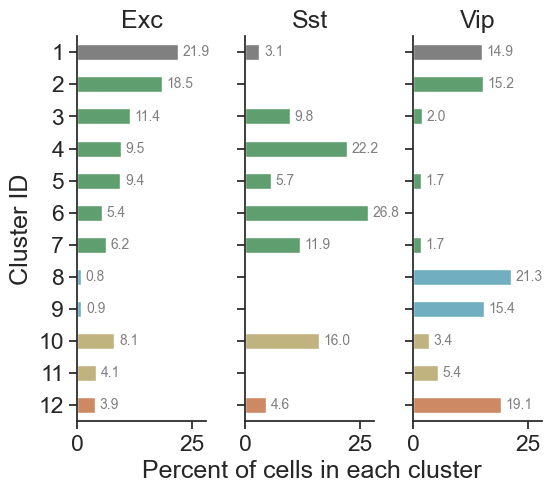

In [ ]:
features = response_metrics[['cell_specimen_id', 'dominant_feature_cluster']].drop_duplicates(subset='cell_specimen_id')
tmp = cluster_meta.merge(features, on='cell_specimen_id')

plotting.plot_percent_cells_per_cluster_per_cre_dominant_feature(tmp, cluster_order=cluster_order, 
                                                                 col_to_group='cre_line', save_dir=save_dir)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:2637: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.barplot(data=all_data, y='cluster_id', x='percent_cells', order=order, orient='h',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:2663: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax[i+1] = sns.barplot(data=cre_data, y='cluster_id', x='percent_cells', order=order, orient='h',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:2663: FutureWarning: 

Passing `palette` without assigning `hue

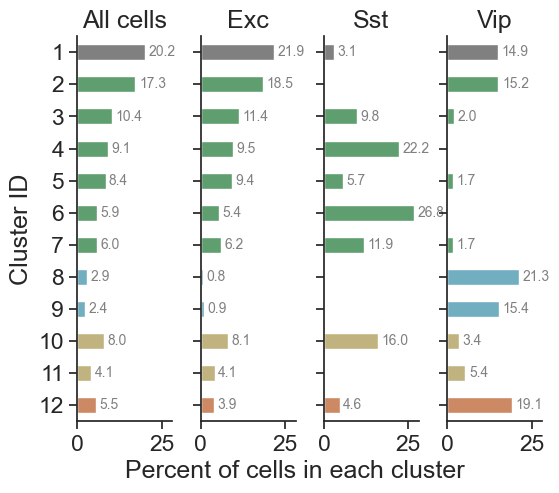

In [ ]:
features = response_metrics[['cell_specimen_id', 'dominant_feature_cluster']].drop_duplicates(subset='cell_specimen_id')
tmp = cluster_meta.merge(features, on='cell_specimen_id')

plotting.plot_percent_cells_per_cluster_per_cre_and_all(tmp, col_to_group='cre_line', save_dir=save_dir)

In [ ]:
# features = response_metrics[['cell_specimen_id', 'dominant_feature_cluster']].drop_duplicates(subset='cell_specimen_id')
# tmp = cluster_meta.merge(features, on='cell_specimen_id')

# plotting.plot_percent_cells_per_cluster_per_cre_dominant_feature(tmp, cluster_order=cluster_order, match_height=True,
#                             col_to_group='cre_line', save_dir=save_dir)

#### Plot fraction of cells per cluster for each cre line with cre on x-axis

array([<AxesSubplot:title={'center':'Exc'}>,
       <AxesSubplot:title={'center':'Sst'}>,
       <AxesSubplot:title={'center':'Vip'}>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:ylabel='Percent of cells in each cluster'>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:xlabel='Exc'>,
       <AxesSubplot:xlabel='Sst'>, <AxesSubplot:xlabel='Vip'>],
      dtype=object)

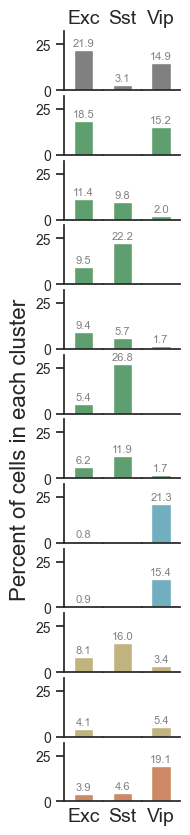

In [ ]:
features = response_metrics[['cell_specimen_id', 'dominant_feature_cluster']].drop_duplicates(subset='cell_specimen_id')
tmp = cluster_meta.merge(features, on='cell_specimen_id')


plotting.plot_percent_cells_per_cluster_per_cre_dominant_feature_xaxis(tmp, col_to_group='cre_line', match_height=True,
                                                            cluster_order=None, save_dir=save_dir)

### Area depth results

In [ ]:
location = 'binned_depth'
metric = 'fraction_cells_location'
ylabel = 'Fraction cells in each depth'

n_cells_table = processing.get_cluster_proportion_stats_for_locations(cluster_meta, location=location)
n_cells_table = n_cells_table.reset_index()

In [ ]:
n_cells_table.head()

,cre_line,cluster_id,binned_depth,n_cells_location,n_cells_location_total,fraction_cells_location,percent_cells_location,n_cells_cluster,n_cells_cre,fraction_cells_cluster,fraction_of_cluster_size,n_cells_chance_location,pvalue,significant,imq,bh_significant
0,Slc17a7-IRES2-Cre,1,75,49,125,0.392000,39.200000,722,3298,0.218921,1.790604,27.365070,2.097591e-37,True,0.000000,True
1,Slc17a7-IRES2-Cre,1,175,430,1310,0.328244,32.824427,722,3298,0.218921,1.499376,286.785931,2.097591e-37,True,0.000000,True
2,Slc17a7-IRES2-Cre,1,275,140,748,0.187166,18.716578,722,3298,0.218921,0.854948,163.752577,2.097591e-37,True,0.000000,True
3,Slc17a7-IRES2-Cre,1,375,103,1115,0.092377,9.237668,722,3298,0.218921,0.421964,244.096422,2.097591e-37,True,0.000000,True
4,Slc17a7-IRES2-Cre,2,75,15,125,0.120000,12.000000,611,3298,0.185264,0.647725,23.157975,3.216220e-09,True,0.016667,True


#### % cells per cluster per depth

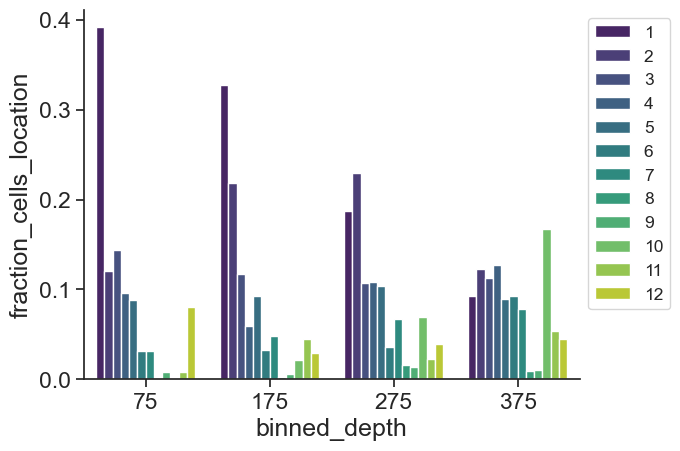

In [ ]:
data = n_cells_table[n_cells_table.cre_line=='Slc17a7-IRES2-Cre']
fig, ax = plt.subplots()
ax = sns.barplot(data=data[['binned_depth', 'cluster_id', 'fraction_cells_location']], 
            x='binned_depth', y='fraction_cells_location', hue='cluster_id', palette=sns.color_palette('viridis',12), ax=ax)
ax.legend(bbox_to_anchor=(1,1), fontsize='x-small')

In [ ]:
n_cells_table.pivot_table(index=['cre_line', 'cluster_id'], columns='binned_depth', values='fraction_cells_location')

binned_depth                       75        175       275       375
cre_line          cluster_id                                        
Slc17a7-IRES2-Cre 1           0.392000  0.328244  0.187166  0.092377
                  2           0.120000  0.219084  0.229947  0.122870
                  3           0.144000  0.116794  0.106952  0.113004
                  4           0.096000  0.059542  0.108289  0.127354
                  5           0.088000  0.092366  0.104278  0.089686
                  6           0.032000  0.032824  0.036096  0.092377
                  7           0.032000  0.048092  0.066845  0.078027
                  8                NaN  0.002290  0.016043  0.008969
                  9           0.008000  0.005344  0.013369  0.009865
                  10               NaN  0.021374  0.069519  0.166816
                  11          0.008000  0.044275  0.022727  0.053812
                  12          0.080000  0.029771  0.038770  0.044843
Sst-IRES-Cre      1           0.090909       NaN  0.027972  0.166667
                  3           0.090909  0.147059  0.090909       NaN
                  4           0.272727  0.264706  0.209790  0.166667
                  5           0.090909  0.029412  0.062937       NaN
                  6           0.272727  0.411765  0.237762  0.166667
                  7                NaN  0.058824  0.139860  0.166667
                  10          0.090909  0.088235  0.181818  0.166667
                  12          0.090909       NaN  0.048951  0.166667
Vip-IRES-Cre      1           0.290323  0.107317  0.083333  0.266667
                  2           0.139785  0.190244  0.104167       NaN
                  3                NaN  0.034146  0.010417       NaN
                  5           0.021505  0.014634  0.020833       NaN
                  7                NaN  0.024390  0.020833       NaN
                  8           0.118280  0.209756  0.281250  0.400000
                  9           0.215054  0.156098  0.114583       NaN
                  10          0.010753  0.024390  0.072917  0.066667
                  11          0.032258  0.082927  0.020833       NaN
                  12          0.172043  0.156098  0.270833  0.266667

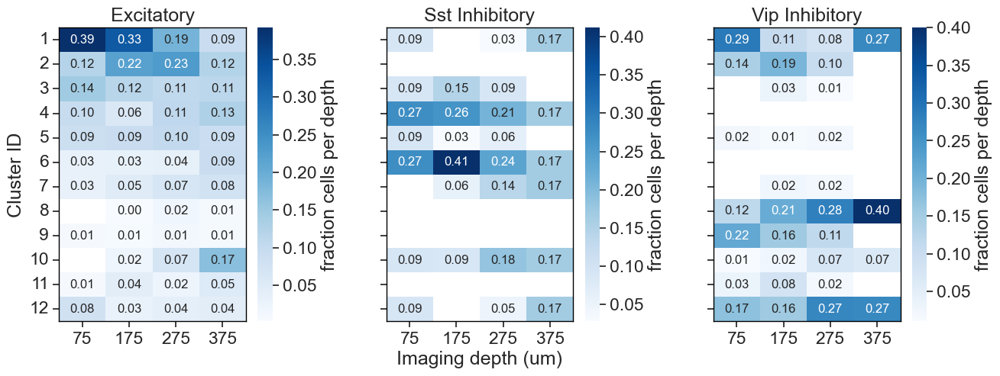

In [ ]:
fig, ax = plt.subplots(1,3, figsize=(15,5), sharey=True)
for i, cre_line in enumerate(cre_lines): 
    cell_type = utils.convert_cre_line_to_cell_type(cre_line)
    data = n_cells_table[n_cells_table.cre_line==cre_line]
    pivot = data.pivot_table(index='cluster_id', columns='binned_depth', values='fraction_cells_location')
    # fill in blank values
    for cluster_id in np.arange(1, 13,1): 
        if cluster_id not in pivot.index.values: 
            pivot.loc[cluster_id] = np.nan
    # order
    pivot = pivot.loc[np.arange(1, 13,1)]
    ax[i] = sns.heatmap(pivot, cmap='Blues', ax=ax[i], 
                        annot=True, fmt=".2f", annot_kws={"fontsize": 12},
                        cbar_kws={'label':'fraction cells per depth'})
    ax[i].set_yticklabels(pivot.index.values, rotation=0)
    ax[i].set_ylabel('')
    ax[i].set_xlabel('')
    ax[i].set_title(cell_type)
ax[0].set_ylabel('Cluster ID')
ax[1].set_xlabel('Imaging depth (um)')
for i in range(3):
    for _, spine in ax[i].spines.items():
        spine.set_visible(True)
        spine.set_color('black')  # Set the color of the box
        spine.set_linewidth(1) 
fig.subplots_adjust(wspace=0.4)

In [ ]:
def get_pivoted_data_for_cell_counts(n_cells_table, cre_line, cluster_ids=np.arange(1,13,1),
                                     column='binned_depth', value='fraction_cells_location'):
    data = n_cells_table[n_cells_table.cre_line==cre_line]
    pivot = data.pivot_table(index='cluster_id', columns=column, values=value)
    # fill in blank values
    for cluster_id in cluster_ids: 
        if cluster_id not in pivot.index.values: 
            pivot.loc[cluster_id] = np.nan
    # order numerically
    pivot = pivot.loc[cluster_ids]
    return pivot

get_pivoted_data_for_cell_counts(n_cells_table, cre_line, value='fraction_cells_location')

binned_depth,75,175,275,375
cluster_id,,,,
1,0.392,0.328244,0.187166,0.092377
2,0.120,0.219084,0.229947,0.122870
3,0.144,0.116794,0.106952,0.113004
4,0.096,0.059542,0.108289,0.127354
5,0.088,0.092366,0.104278,0.089686
6,0.032,0.032824,0.036096,0.092377
7,0.032,0.048092,0.066845,0.078027
8,NaN,0.002290,0.016043,0.008969
9,0.008,0.005344,0.013369,0.009865


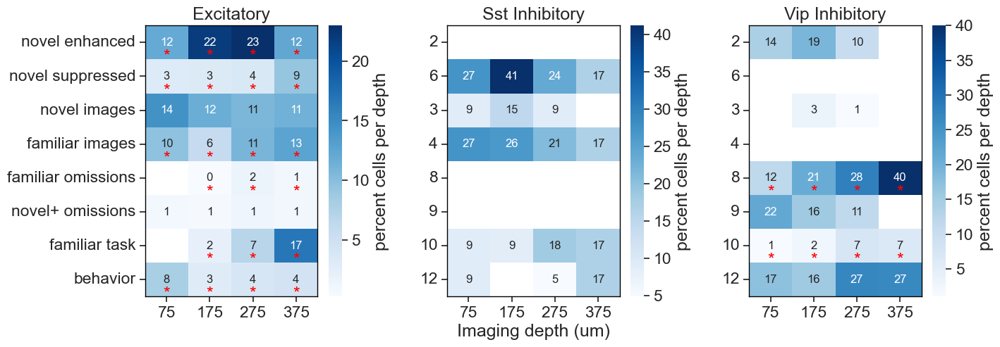

In [ ]:
clusters_to_keep = [2, 6, 3, 4, 8, 9, 10, 12]
cluster_names = ['novel enhanced', 'novel suppressed',
                 'novel images', 'familiar images',  
                 'familiar omissions', 'novel+ omissions', 
                 'familiar task', 'behavior']
n_cells_table_tmp = n_cells_table[n_cells_table.cluster_id.isin(clusters_to_keep)]


fig, ax = plt.subplots(1,3, figsize=(15,5), sharey=False)
ax = ax.ravel()
for i, cre_line in enumerate(cre_lines): 
    cell_type = utils.convert_cre_line_to_cell_type(cre_line)
    pivot = get_pivoted_data_for_cell_counts(n_cells_table_tmp, cre_line, value='percent_cells_location', cluster_ids=clusters_to_keep)
    ax[i] = sns.heatmap(pivot, cmap='Blues', ax=ax[i], annot=True, fmt=".0f", annot_kws={"fontsize": 12},
                        cbar_kws={'label':'percent cells per depth'})
    pivot_sig = get_pivoted_data_for_cell_counts(n_cells_table_tmp, cre_line, value='bh_significant', cluster_ids=clusters_to_keep)
    rows, cols = np.where(pivot_sig==1)
    coords = list(zip(rows, cols))
    for coord in coords: 
        ax[i].text(s='*',y=coord[0]+0.7, x=coord[1]+0.5, ha='center', va='top', color='r')
    ax[i].set_ylabel('')
    if i == 0:
        ax[i].set_yticklabels(cluster_names, rotation=0)
    else: 
        ax[i].set_yticklabels(clusters_to_keep, rotation=0)
    ax[i].set_xlabel('')
    ax[i].set_title(cell_type)
# ax[0].set_ylabel('Cluster ID')
ax[1].set_xlabel('Imaging depth (um)')
for i in range(3):
    for _, spine in ax[i].spines.items():
        spine.set_visible(True)
        spine.set_color('black')  # Set the color of the box
        spine.set_linewidth(1)  
fig.subplots_adjust(wspace=0.4)

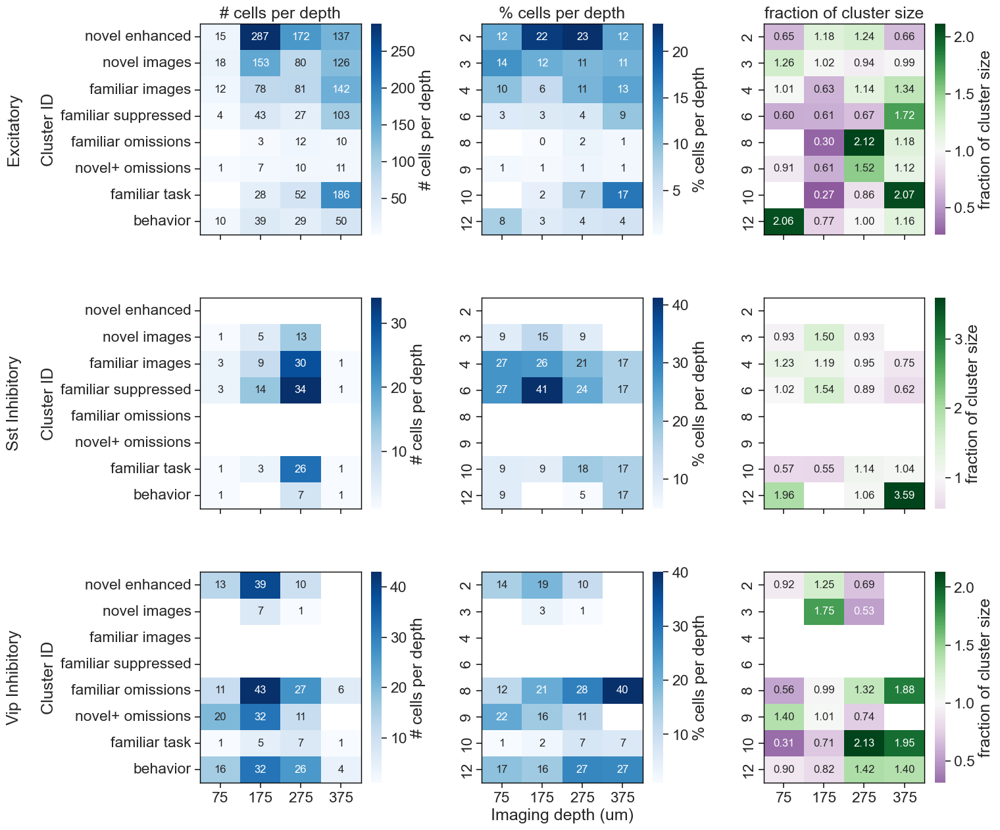

In [ ]:
clusters_to_keep = [2, 3, 4, 6, 8, 9, 10, 12]
cluster_names = ['novel enhanced', 'novel images', 'familiar images', 'familiar suppressed', 
                 'familiar omissions', 'novel+ omissions', 'familiar task', 'behavior']
n_cells_table_tmp = n_cells_table[n_cells_table.cluster_id.isin(clusters_to_keep)]

fig, ax = plt.subplots(3, 3, figsize=(15, 15), sharey=False, sharex=True)
ax = ax.ravel()
i=0
for c, cre_line in enumerate(cre_lines): 
    cell_type = utils.convert_cre_line_to_cell_type(cre_line)
    pivot = get_pivoted_data_for_cell_counts(n_cells_table, cre_line, value='n_cells_location', cluster_ids=clusters_to_keep)
    pivot.index = cluster_names
    ax[i] = sns.heatmap(pivot, cmap='Blues', ax=ax[i], annot=True, fmt=".0f", annot_kws={"fontsize": 12},
                        cbar_kws={'label':'# cells per depth'})
    ax[i].set_ylabel(cell_type+'\n\nCluster ID')
    ax[i].set_yticklabels(cluster_names, rotation=0)
    if c==0: 
        ax[i].set_title('# cells per depth')
    i+=1
    pivot = get_pivoted_data_for_cell_counts(n_cells_table, cre_line, value='percent_cells_location', cluster_ids=clusters_to_keep)
    ax[i] = sns.heatmap(pivot, cmap='Blues', ax=ax[i], annot=True, fmt=".0f", annot_kws={"fontsize": 12},
                        cbar_kws={'label':'% cells per depth'})
    ax[i].set_ylabel('')
    if c==0: 
        ax[i].set_title('% cells per depth')
    i+=1
    pivot = get_pivoted_data_for_cell_counts(n_cells_table, cre_line, value='fraction_of_cluster_size', cluster_ids=clusters_to_keep)
    ax[i] = sns.heatmap(pivot, cmap='PRGn', center=1, ax=ax[i], annot=True, fmt=".2f", annot_kws={"fontsize": 12},
                        cbar_kws={'label':'fraction of cluster size'})
    ax[i].set_ylabel('')
    if c==0: 
        ax[i].set_title('fraction of cluster size')
    i+=1

for i in range(9):
    ax[i].set_xlabel('') 
    for _, spine in ax[i].spines.items():
        spine.set_visible(True)
        spine.set_color('black')  # Set the color of the box
        spine.set_linewidth(1)   
ax[7].set_xlabel('Imaging depth (um)')
fig.subplots_adjust(hspace=0.3, wspace=0.4)

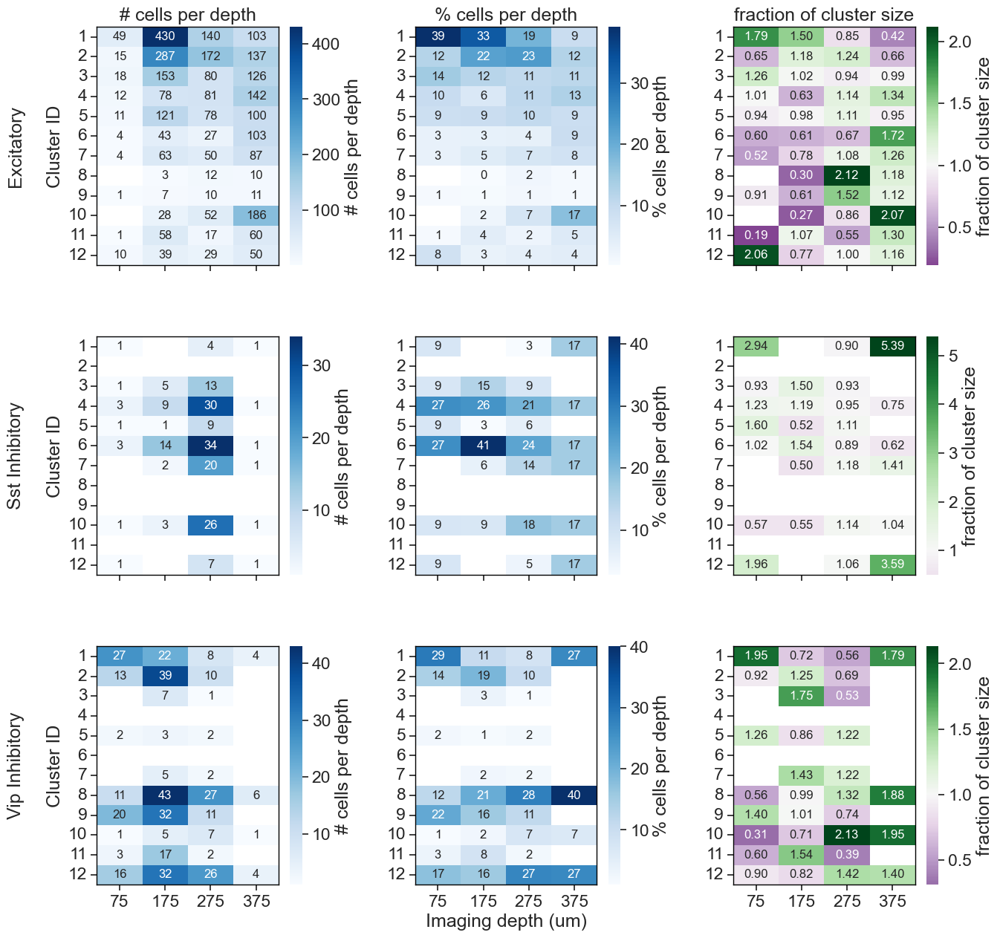

In [ ]:

cluster_ids = np.sort(n_cells_table.cluster_id.unique())

fig, ax = plt.subplots(3, 3, figsize=(15, 15), sharey=False, sharex=True)
ax = ax.ravel()
i=0
for c, cre_line in enumerate(cre_lines): 
    cell_type = utils.convert_cre_line_to_cell_type(cre_line)
    pivot = get_pivoted_data_for_cell_counts(n_cells_table, cre_line, value='n_cells_location', cluster_ids=cluster_ids)
    ax[i] = sns.heatmap(pivot, cmap='Blues', ax=ax[i], annot=True, fmt=".0f", annot_kws={"fontsize": 12},
                        cbar_kws={'label':'# cells per depth'})
    ax[i].set_ylabel(cell_type+'\n\nCluster ID')
    if c==0: 
        ax[i].set_title('# cells per depth')
    i+=1
    pivot = get_pivoted_data_for_cell_counts(n_cells_table, cre_line, value='percent_cells_location', cluster_ids=cluster_ids)
    ax[i] = sns.heatmap(pivot, cmap='Blues', ax=ax[i], annot=True, fmt=".0f", annot_kws={"fontsize": 12},
                        cbar_kws={'label':'% cells per depth'})
    ax[i].set_ylabel('')
    if c==0: 
        ax[i].set_title('% cells per depth')
    i+=1
    pivot = get_pivoted_data_for_cell_counts(n_cells_table, cre_line, value='fraction_of_cluster_size', cluster_ids=cluster_ids)
    ax[i] = sns.heatmap(pivot, cmap='PRGn', center=1, ax=ax[i], annot=True, fmt=".2f", annot_kws={"fontsize": 12},
                        cbar_kws={'label':'fraction of cluster size'})
    ax[i].set_ylabel('')
    if c==0: 
        ax[i].set_title('fraction of cluster size')
    i+=1

for i in range(9):
    ax[i].set_xlabel('') 
    ax[i].set_yticklabels(cluster_ids, rotation=0)
    for _, spine in ax[i].spines.items():
        spine.set_visible(True)
        spine.set_color('black')  # Set the color of the box
        spine.set_linewidth(1)   
ax[7].set_xlabel('Imaging depth (um)')
fig.subplots_adjust(hspace=0.3, wspace=0.4)

##### pie charts

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:5092: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 
  ax[i].pie(cluster_cells.fraction, labels=cluster_cells.cluster_id, autopct='%.f%%', colors=colors)
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:5092: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 
  ax[i].pie(cluster_cells.fraction, labels=cluster_cells.cluster_id, autopct='%.f

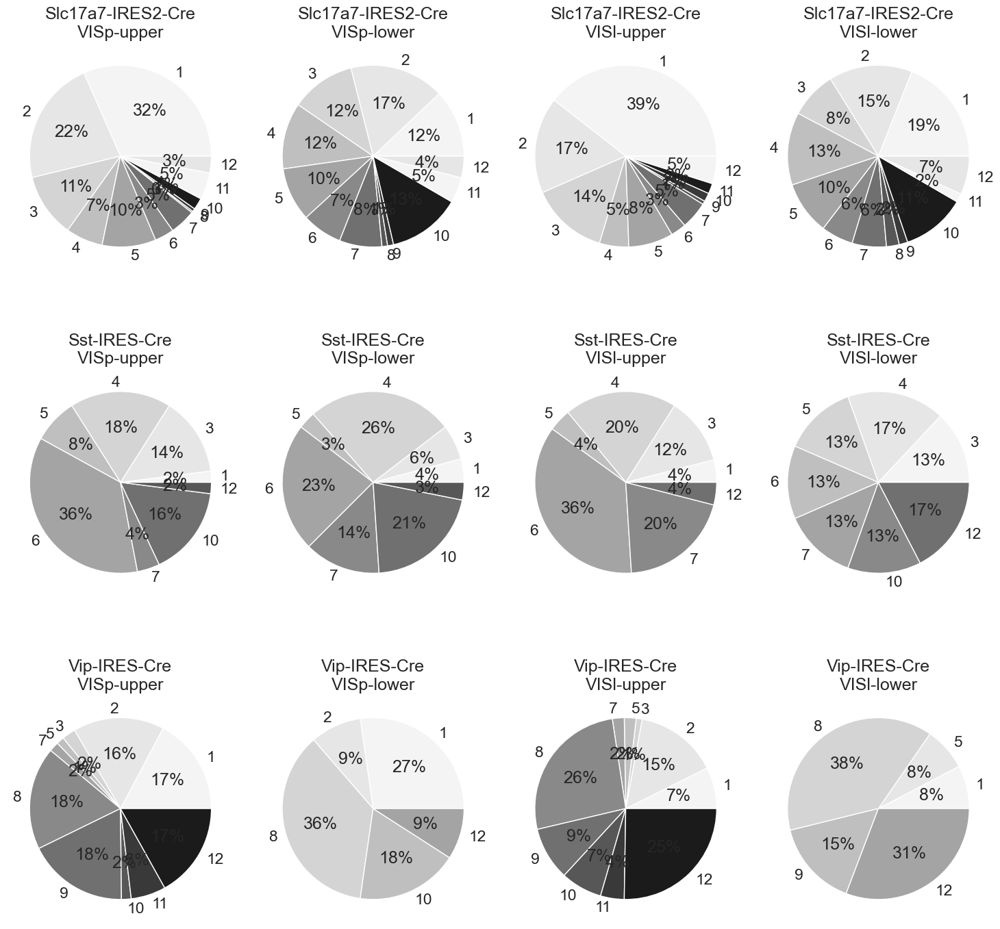

In [ ]:
plotting.plot_proportion_cells_area_depth_pie_chart(cluster_meta, save_dir=None, folder=None)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:5116: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 
  utils.save_figure(fig, figsize, save_dir, folder, 'cluster_proportions_cluster_types_legend')


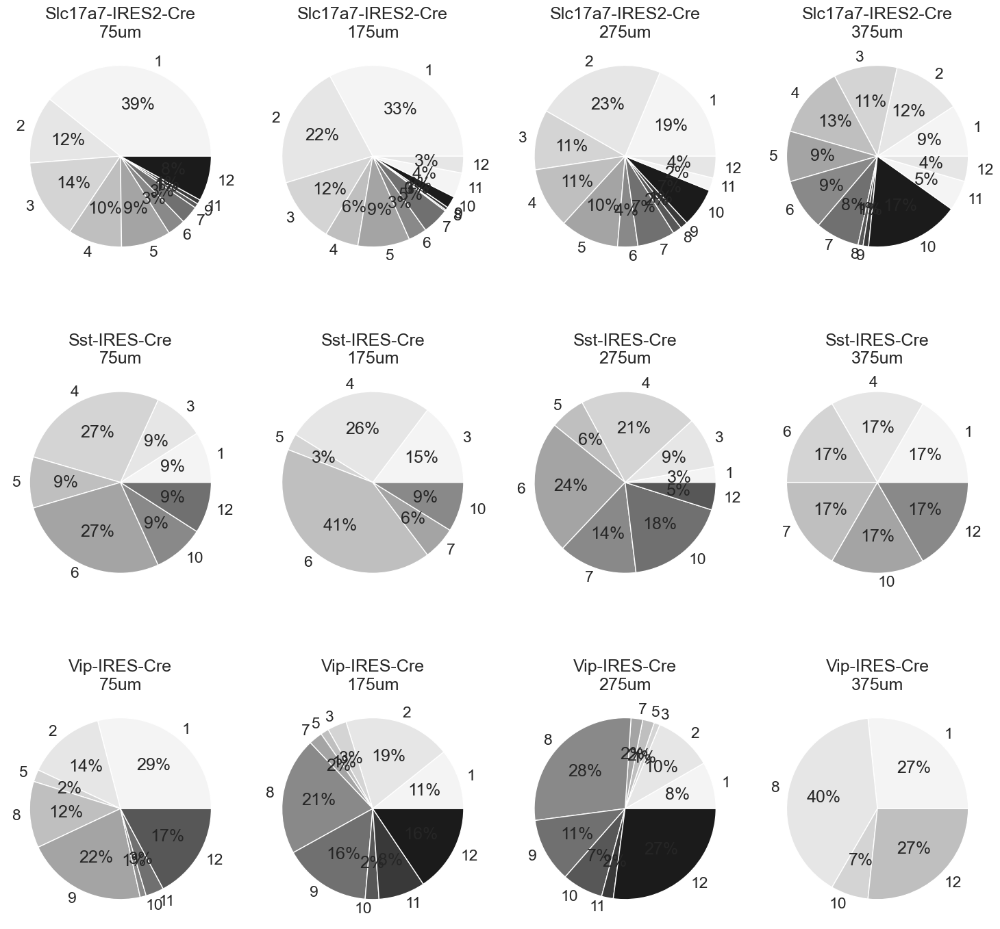

In [ ]:
plotting.plot_proportion_cells_per_depth_pie_chart(cluster_meta, save_dir=None, folder=None)

#### % cells per cluster per mouse (in each depth)

In [ ]:
novel_1_mice = platform_experiments[(platform_experiments.experience_level=='Novel +') & 
                     (platform_experiments.prior_exposures_to_image_set==1)].mouse_id.unique()
novel_over_1_mice = platform_experiments[(platform_experiments.experience_level=='Novel +') & 
                     (platform_experiments.prior_exposures_to_image_set>1)].mouse_id.unique()

##### mice with 1 exposure to novel images

In [ ]:
tmp = cluster_meta.copy()
tmp = tmp[tmp.mouse_id.isin(novel_1_mice)]
n_cells_mice = processing.get_cluster_proportion_stats_for_locations(tmp, location='mouse_id')
n_cells_mice = n_cells_mice.reset_index()
n_cells_mice.head(6)

,cre_line,cluster_id,mouse_id,n_cells_location,n_cells_location_total,fraction_cells_location,percent_cells_location,n_cells_cluster,n_cells_cre,fraction_cells_cluster,fraction_of_cluster_size,n_cells_chance_location,pvalue,significant,imq,bh_significant
0,Slc17a7-IRES2-Cre,1,431252,5,97,0.051546,5.154639,222,1014,0.218935,0.235442,21.236686,2.413496e-11,True,0.0,True
1,Slc17a7-IRES2-Cre,1,459773,22,47,0.468085,46.808511,222,1014,0.218935,2.138010,10.289941,2.413496e-11,True,0.0,True
2,Slc17a7-IRES2-Cre,1,462544,13,110,0.118182,11.818182,222,1014,0.218935,0.539803,24.082840,2.413496e-11,True,0.0,True
3,Slc17a7-IRES2-Cre,1,476067,23,79,0.291139,29.113924,222,1014,0.218935,1.329798,17.295858,2.413496e-11,True,0.0,True
4,Slc17a7-IRES2-Cre,1,485152,141,478,0.294979,29.497908,222,1014,0.218935,1.347337,104.650888,2.413496e-11,True,0.0,True
5,Slc17a7-IRES2-Cre,1,491060,9,120,0.075000,7.500000,222,1014,0.218935,0.342568,26.272189,2.413496e-11,True,0.0,True


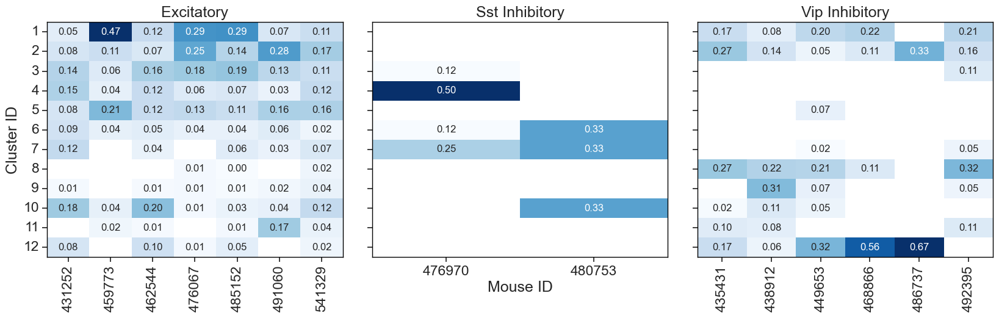

In [ ]:
fig, ax = plt.subplots(1,3, figsize=(20,5), sharey=True)
for i, cre_line in enumerate(cre_lines): 
    cell_type = utils.convert_cre_line_to_cell_type(cre_line)
    data = n_cells_mice[n_cells_mice.cre_line==cre_line]
    pivot = data.pivot_table(index='cluster_id', columns='mouse_id', values='fraction_cells_location')
    # fill in blank values
    for cluster_id in np.arange(1, 13,1): 
        if cluster_id not in pivot.index.values: 
            pivot.loc[cluster_id] = np.nan
    # order
    pivot = pivot.loc[np.arange(1, 13,1)]
    ax[i] = sns.heatmap(pivot, cmap='Blues', ax=ax[i], 
                        annot=True, fmt=".2f", annot_kws={"fontsize": 12}, cbar=False,
                        cbar_kws={'label':'fraction cells per depth'})
    ax[i].set_yticklabels(pivot.index.values, rotation=0)
    ax[i].set_ylabel('')
    ax[i].set_xlabel('')
    ax[i].set_title(cell_type)
ax[0].set_ylabel('Cluster ID')
ax[1].set_xlabel('Mouse ID')
for i in range(3):
    for _, spine in ax[i].spines.items():
        spine.set_visible(True)
        spine.set_color('black')  # Set the color of the box
        spine.set_linewidth(1) 
fig.subplots_adjust(wspace=0.1)

#### mice with >1 exposure to novel image sets

In [ ]:
tmp = cluster_meta.copy()
tmp = tmp[tmp.mouse_id.isin(novel_over_1_mice)]
print(len(tmp.mouse_id.unique()))
n_cells_mice = processing.get_cluster_proportion_stats_for_locations(tmp, location='mouse_id')
n_cells_mice = n_cells_mice.reset_index()
n_cells_mice.head(6)

51


,cre_line,cluster_id,mouse_id,n_cells_location,n_cells_location_total,fraction_cells_location,percent_cells_location,n_cells_cluster,n_cells_cre,fraction_cells_cluster,fraction_of_cluster_size,n_cells_chance_location,pvalue,significant,imq,bh_significant
0,Slc17a7-IRES2-Cre,1,412366,1,117,0.008547,0.854701,500,2284,0.218914,0.039043,25.612960,1.856444e-17,True,0.0,True
1,Slc17a7-IRES2-Cre,1,425493,9,109,0.082569,8.256881,500,2284,0.218914,0.377174,23.861646,1.856444e-17,True,0.0,True
2,Slc17a7-IRES2-Cre,1,425496,30,126,0.238095,23.809524,500,2284,0.218914,1.087619,27.583187,1.856444e-17,True,0.0,True
3,Slc17a7-IRES2-Cre,1,436662,6,91,0.065934,6.593407,500,2284,0.218914,0.301187,19.921191,1.856444e-17,True,0.0,True
4,Slc17a7-IRES2-Cre,1,440298,4,45,0.088889,8.888889,500,2284,0.218914,0.406044,9.851138,1.856444e-17,True,0.0,True
5,Slc17a7-IRES2-Cre,1,445002,10,58,0.172414,17.241379,500,2284,0.218914,0.787586,12.697023,1.856444e-17,True,0.0,True


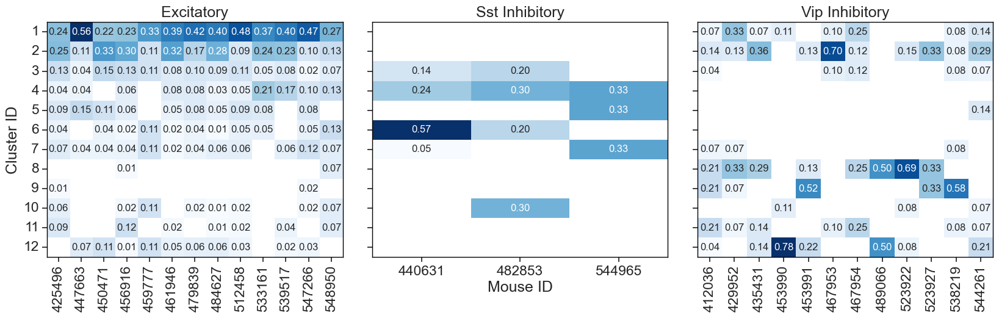

In [ ]:
fig, ax = plt.subplots(1,3, figsize=(20,5), sharey=True)
for i, cre_line in enumerate(cre_lines): 
    cell_type = utils.convert_cre_line_to_cell_type(cre_line)
    data = n_cells_mice[n_cells_mice.cre_line==cre_line]
    pivot = data.pivot_table(index='cluster_id', columns='mouse_id', values='fraction_cells_location')
    # fill in blank values
    for cluster_id in np.arange(1, 13,1): 
        if cluster_id not in pivot.index.values: 
            pivot.loc[cluster_id] = np.nan
    # order
    pivot = pivot.loc[np.arange(1, 13,1)]
    ax[i] = sns.heatmap(pivot, cmap='Blues', ax=ax[i], 
                        annot=True, fmt=".2f", annot_kws={"fontsize": 12}, cbar=False,
                        cbar_kws={'label':'fraction cells per depth'})
    ax[i].set_yticklabels(pivot.index.values, rotation=0)
    ax[i].set_ylabel('')
    ax[i].set_xlabel('')
    ax[i].set_title(cell_type)
ax[0].set_ylabel('Cluster ID')
ax[1].set_xlabel('Mouse ID')
for i in range(3):
    for _, spine in ax[i].spines.items():
        spine.set_visible(True)
        spine.set_color('black')  # Set the color of the box
        spine.set_linewidth(1) 
fig.subplots_adjust(wspace=0.1)

#### compare % cells in cluster 2 for the two groups

In [ ]:
cluster_meta['n_exposures_prior_to_novel+'] = ['1' if cluster_meta.iloc[row].mouse_id in novel_1_mice else '>1' for row in range(len(cluster_meta))]


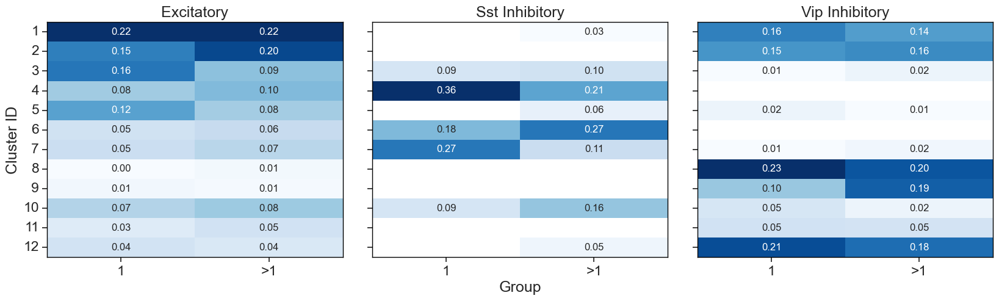

In [ ]:
n_cells_exp_level = processing.get_cluster_proportion_stats_for_locations(cluster_meta, location='n_exposures_prior_to_novel+')
n_cells_exp_level = n_cells_exp_level.reset_index()

fig, ax = plt.subplots(1,3, figsize=(20,5), sharey=True)
for i, cre_line in enumerate(cre_lines): 
    cell_type = utils.convert_cre_line_to_cell_type(cre_line)
    data = n_cells_exp_level[n_cells_exp_level.cre_line==cre_line]
    pivot = data.pivot_table(index='cluster_id', columns='n_exposures_prior_to_novel+', values='fraction_cells_location')
    # fill in blank values
    for cluster_id in np.arange(1, 13,1): 
        if cluster_id not in pivot.index.values: 
            pivot.loc[cluster_id] = np.nan
    # order
    pivot = pivot.loc[np.arange(1, 13,1)]
    ax[i] = sns.heatmap(pivot, cmap='Blues', ax=ax[i], 
                        annot=True, fmt=".2f", annot_kws={"fontsize": 12}, cbar=False,
                        cbar_kws={'label':'fraction cells per group'})
    ax[i].set_yticklabels(pivot.index.values, rotation=0)
    ax[i].set_ylabel('')
    ax[i].set_xlabel('')
    ax[i].set_title(cell_type)
ax[0].set_ylabel('Cluster ID')
ax[1].set_xlabel('Group')
for i in range(3):
    for _, spine in ax[i].spines.items():
        spine.set_visible(True)
        spine.set_color('black')  # Set the color of the box
        spine.set_linewidth(1) 
fig.subplots_adjust(wspace=0.1)

In [ ]:
tmp = cluster_meta.copy()
tmp = tmp[tmp.mouse_id.isin(novel_1_mice)]
print(len(tmp.mouse_id.unique()))
n_cells_mice = processing.get_cluster_proportion_stats_for_locations(tmp, location='mouse_id')
n_cells_mice = n_cells_mice.reset_index()
n_cells_mice[n_cells_mice.cluster_id==2].groupby(['cre_line']).describe()[['fraction_cells_location']]

15


fraction_cells_location                                \
                                    count      mean       std       min   
cre_line                                                                  
Slc17a7-IRES2-Cre                     7.0  0.157240  0.080356  0.072727   
Vip-IRES-Cre                          6.0  0.177182  0.104084  0.053571   

                                                           
                        25%       50%       75%       max  
cre_line                                                   
Slc17a7-IRES2-Cre  0.094429  0.142259  0.210920  0.275000  
Vip-IRES-Cre       0.118056  0.148392  0.240693  0.333333

In [ ]:
print('mice with Novel+ session directly after novel session have ')

In [ ]:
tmp = cluster_meta.copy()
tmp = tmp[tmp.mouse_id.isin(novel_over_1_mice)]
print(len(tmp.mouse_id.unique()))
n_cells_mice = processing.get_cluster_proportion_stats_for_locations(tmp, location='mouse_id')
n_cells_mice = n_cells_mice.reset_index()
n_cells_mice[n_cells_mice.cluster_id==2].groupby(['cre_line']).describe()[['fraction_cells_location']]

51


fraction_cells_location                                \
                                    count      mean       std       min   
cre_line                                                                  
Slc17a7-IRES2-Cre                    27.0  0.182299  0.080462  0.066667   
Vip-IRES-Cre                         11.0  0.217846  0.182767  0.047619   

                                                           
                        25%       50%       75%       max  
cre_line                                                   
Slc17a7-IRES2-Cre  0.112007  0.173913  0.241437  0.333333  
Vip-IRES-Cre       0.129167  0.138889  0.277003  0.700000

In [ ]:
n_cells_mice.groupby(['cre_line', 'cluster_id']).describe()[['fraction_cells_location']]

fraction_cells_location                      \
                                               count      mean       std   
cre_line          cluster_id                                               
Slc17a7-IRES2-Cre 1                             26.0  0.226821  0.137141   
                  2                             27.0  0.182299  0.080462   
                  3                             27.0  0.095572  0.041056   
                  4                             25.0  0.110828  0.058429   
                  5                             24.0  0.104138  0.081077   
                  6                             24.0  0.071197  0.047298   
                  7                             25.0  0.071924  0.043596   
                  8                             10.0  0.028436  0.019376   
                  9                              9.0  0.019780  0.012293   
                  10                            21.0  0.108233  0.085616   
                  11                            18.0  0.064043  0.068541   
                  12                            18.0  0.051960  0.036131   
Sst-IRES-Cre      1                              5.0  0.086401  0.094409   
                  3                              7.0  0.161109  0.109581   
                  4                             10.0  0.257563  0.174521   
                  5                              6.0  0.120465  0.074966   
                  6                             11.0  0.285955  0.107263   
                  7                              7.0  0.158412  0.092876   
                  10                            11.0  0.218014  0.169266   
                  12                             5.0  0.097853  0.047143   
Vip-IRES-Cre      1                             10.0  0.163636  0.081906   
                  2                             11.0  0.217846  0.182767   
                  3                              6.0  0.073214  0.038346   
                  5                              2.0  0.078373  0.091194   
                  7                              4.0  0.063978  0.020875   
                  8                              9.0  0.291563  0.141718   
                  9                              6.0  0.272354  0.205033   
                  10                             5.0  0.045258  0.025846   
                  11                             8.0  0.112146  0.079289   
                  12                             7.0  0.247678  0.223806   

                                                                                
                                   min       25%       50%       75%       max  
cre_line          cluster_id                                                    
Slc17a7-IRES2-Cre 1           0.008547  0.123034  0.225146  0.285679  0.555556  
                  2           0.066667  0.112007  0.173913  0.241437  0.333333  
                  3           0.028571  0.065942  0.091371  0.123321  0.212121  
                  4           0.027027  0.058376  0.090909  0.161290  0.210526  
                  5           0.028571  0.051097  0.082952  0.141204  0.400000  
                  6           0.015152  0.037813  0.053839  0.102174  0.193548  
                  7           0.013889  0.043860  0.062500  0.088000  0.200000  
                  8           0.007614  0.012552  0.023942  0.041925  0.066667  
                  9           0.006211  0.008547  0.016000  0.029703  0.040541  
                  10          0.015625  0.055556  0.090909  0.121212  0.293578  
                  11          0.015152  0.017097  0.037579  0.082143  0.283784  
                  12          0.008772  0.030090  0.041076  0.059466  0.138889  
Sst-IRES-Cre      1           0.019231  0.027027  0.058824  0.076923  0.250000  
                  3           0.076923  0.109610  0.111111  0.160256  0.400000  
                  4           0.111111  0.132212  0.188034  0.310811  0.615385  
                  5           0.027027  0.071047  0.118056  0.

#### all mice

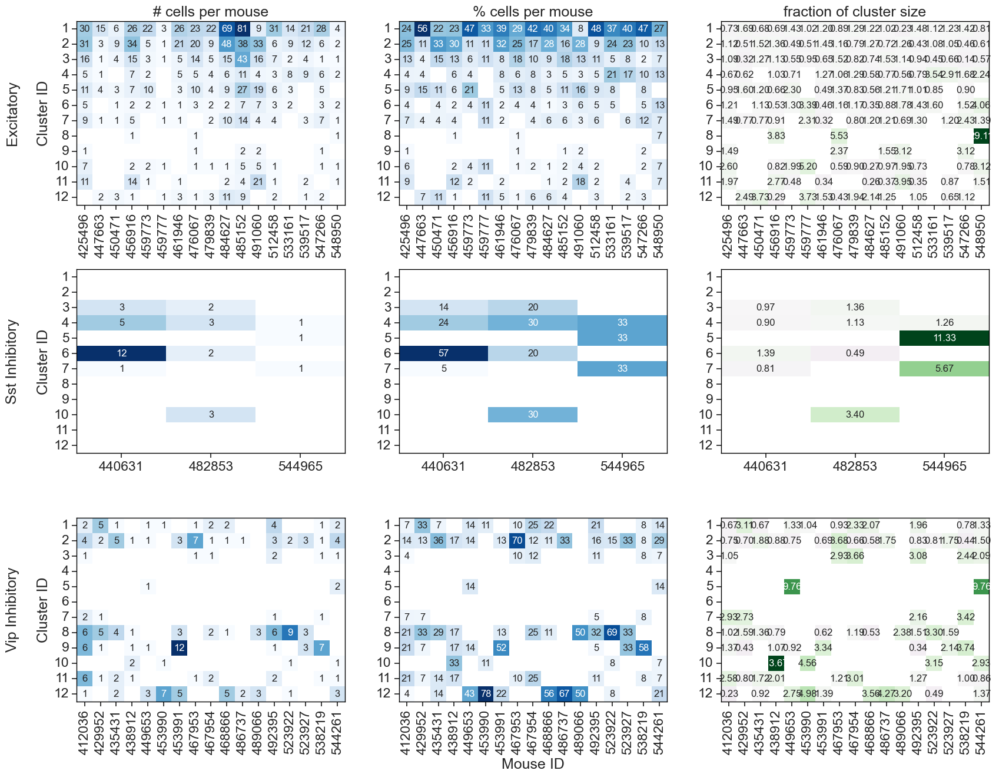

In [ ]:

cluster_ids = np.sort(n_cells_table.cluster_id.unique())

fig, ax = plt.subplots(3, 3, figsize=(20, 15), sharey=False, sharex=False)
ax = ax.ravel()
i=0
for c, cre_line in enumerate(cre_lines): 
    cell_type = utils.convert_cre_line_to_cell_type(cre_line)
    pivot = get_pivoted_data_for_cell_counts(n_cells_mice, cre_line, cluster_ids=cluster_ids,
                                 column='mouse_id', value='n_cells_location')
    ax[i] = sns.heatmap(pivot, cmap='Blues', ax=ax[i], annot=True, fmt=".0f", annot_kws={"fontsize": 12},
                        cbar=False, cbar_kws={'label':'# cells per mouse'})
    ax[i].set_ylabel(cell_type+'\n\nCluster ID')
    if c==0: 
        ax[i].set_title('# cells per mouse')
    i+=1
    pivot = get_pivoted_data_for_cell_counts(n_cells_mice, cre_line, cluster_ids=cluster_ids,
                                 column='mouse_id', value='percent_cells_location')
    ax[i] = sns.heatmap(pivot, cmap='Blues', ax=ax[i], annot=True, fmt=".0f", annot_kws={"fontsize": 12},
                        cbar=False, cbar_kws={'label':'% cells per mouse'})
    ax[i].set_ylabel('')
    if c==0: 
        ax[i].set_title('% cells per mouse')
    i+=1
    pivot = get_pivoted_data_for_cell_counts(n_cells_mice, cre_line, cluster_ids=cluster_ids,
                                 column='mouse_id', value='fraction_of_cluster_size')
    ax[i] = sns.heatmap(pivot, cmap='PRGn', center=1, ax=ax[i], annot=True, fmt=".1f", annot_kws={"fontsize": 12},
                        cbar=False, cbar_kws={'label':'fraction of cluster size'})
    ax[i].set_ylabel('')
    if c==0: 
        ax[i].set_title('fraction of cluster size')
    i+=1

for i in range(9):
    ax[i].set_xlabel('') 
    ax[i].set_yticklabels(cluster_ids, rotation=0)
    for _, spine in ax[i].spines.items():
        spine.set_visible(True)
        spine.set_color('black')  # Set the color of the box
        spine.set_linewidth(1)   
ax[7].set_xlabel('Mouse ID')
fig.subplots_adjust(hspace=0.35, wspace=0.2)

##### compare to session sequence

In [ ]:
platform_behavior_sessions = loading.get_platform_paper_behavior_session_table()
platform_behavior_sessions['mouse_id'] = [int(mouse_id) for mouse_id in platform_behavior_sessions.mouse_id.values]
platform_behavior_sessions['experience_level'] = [utils.convert_experience_level(experience_level) for experience_level in platform_behavior_sessions.experience_level.values]
print(len(platform_behavior_sessions.mouse_id.unique()))

# limit to mice that meet the critieria for ophys to be included in the platform paper
behavior_sessions = platform_behavior_sessions[platform_behavior_sessions.mouse_id.isin(platform_experiments.mouse_id.unique())]
print(len(behavior_sessions.mouse_id.unique()))

c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


3663 sessions after removing VisualBehaviorMultiscope4areasx2d and Ai94
3663 sessions after adding extra columns
82
66


In [ ]:
behavior_sessions.experience_level.unique()

array(['Training', 'Familiar', 'Novel', 'Novel +'], dtype=object)

In [ ]:
behavior_sessions = utilities.add_behavior_stage_to_behavior_sessions(behavior_sessions)
behavior_sessions = utilities.add_stimulus_experience_level_to_behavior_sessions(behavior_sessions)
behavior_sessions = utilities.add_ophys_stage_to_behavior_sessions(platform_experiments, behavior_sessions)
print(behavior_sessions.stimulus_experience_level.unique())
print(behavior_sessions.ophys_stage.unique())

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\data_access\utilities.py:1499: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return behavior_sessions


array(['gratings_static', 'gratings_flashed', 'familiar_images',
       'novel_images', 'novel +_images'], dtype=object)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


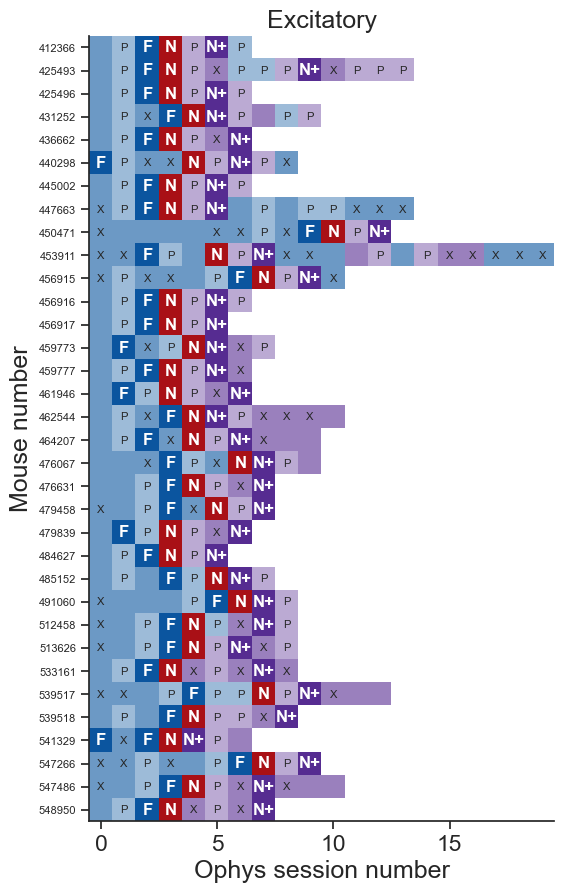

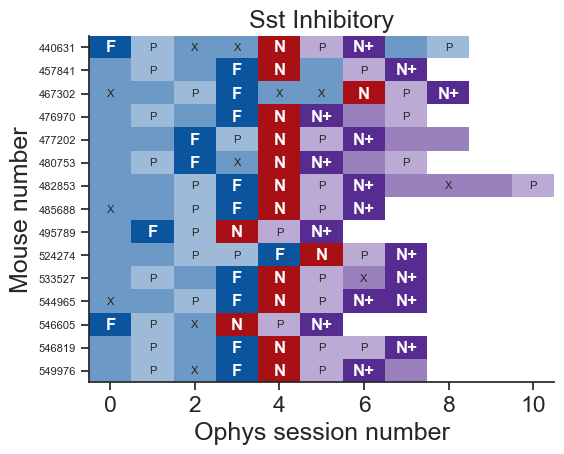

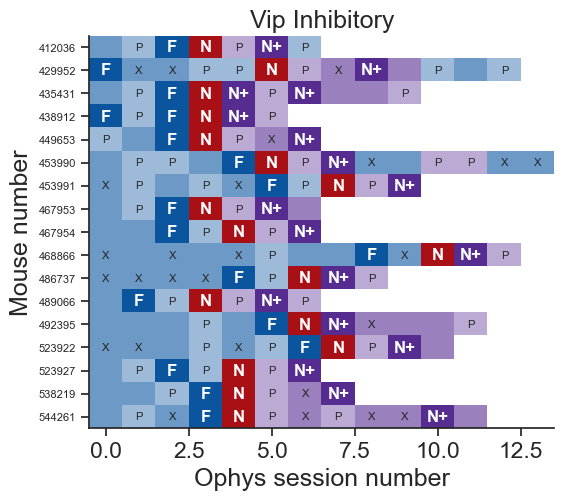

In [ ]:
color_column = 'ophys_stage'
color_map = utils.get_ophys_stage_color_map(as_rgb=True)
# color_map = utils.get_behavior_stage_color_map(as_rgb=True)

for cell_type in utils.get_cell_types(): 
    sessions = behavior_sessions.copy()
    # exclude non-ophys & habituation sessions, which have ophys_stage = None
    sessions = sessions[sessions.ophys_stage!='None']
    # exclude mice that are not in platform paper dataset 
    sessions = sessions[sessions.mouse_id.isin(platform_experiments.mouse_id.unique())]
    # for specific cre line
    sessions = sessions[sessions.cell_type==cell_type]

    ppf.plot_ophys_history_for_mice(sessions, color_column=color_column, color_map=color_map, save_dir=None, 
                                    sort_by_n_sessions=False, title=cell_type, label_with_mouse_id=True, suffix='_all_mice')

#### Original figures

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:5496: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  ax = sns.barplot(data=cre_data, x='cluster_id', order=order, y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:5496: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  ax = sns.barplot(data=cre_data, x='cluster_id', order=order, y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:5496: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  ax = sns.barplot(data=cre_data, x='cluster_id', order=order, y=metric,


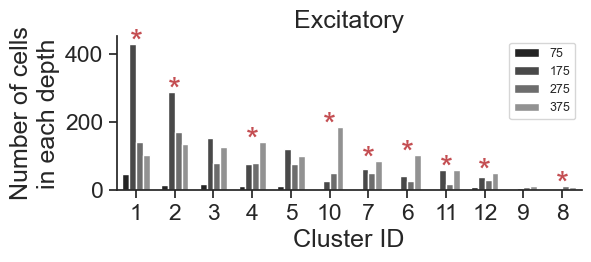

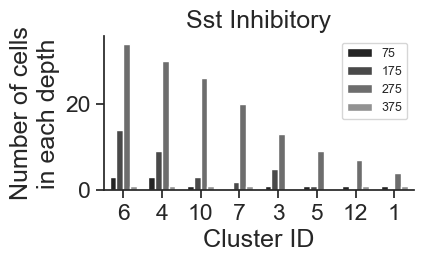

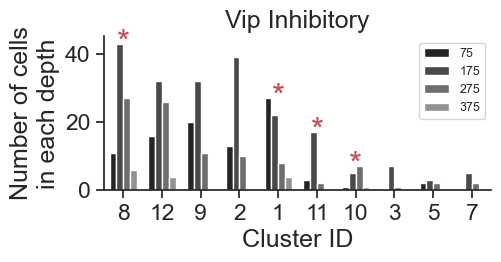

In [ ]:
location = 'binned_depth'
metric = 'n_cells_location'
ylabel = 'Number of cells\nin each depth'


plotting.plot_cluster_depth_distribution_by_cre_line_separately(cluster_meta, location, cluster_order=None,
                                                            metric=metric, ylabel=ylabel, legend_title='', save_dir=save_dir, folder='cluster_properties')

In [ ]:
# location = 'binned_depth'
# metric = 'n_cells_location'
# ylabel = 'Number of cells in each depth'

# plotting.plot_cluster_depth_distribution_by_cre_lines(cluster_meta, location, metric, horiz=True,
#                                                       ylabel=ylabel, save_dir=save_dir, folder='cluster_properties')

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:5405: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  ax[i] = sns.barplot(data=cre_data, y='cluster_id', order=xorder, x=metric, orient='h',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:5405: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  ax[i] = sns.barplot(data=cre_data, y='cluster_id', order=xorder, x=metric, orient='h',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:5405: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  ax[i] = sns.barplot(data=cre_data, y='cluster_id', order=xorder, x=metric, orient='h',


array([<AxesSubplot:title={'center':'Exc'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst'}, xlabel='Number of cells in each depth'>,
       <AxesSubplot:title={'center':'Vip'}>], dtype=object)

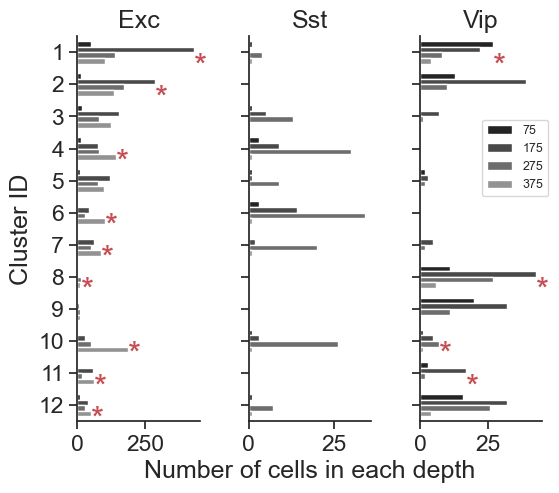

In [ ]:
location = 'binned_depth'
metric = 'n_cells_location'
ylabel = 'Number of cells in each depth'

plotting.plot_cluster_depth_distribution_by_cre_lines(cluster_meta, location, metric, horiz=False,
                                                      ylabel=ylabel, save_dir=save_dir, folder='cluster_properties')

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:5496: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  ax = sns.barplot(data=cre_data, x='cluster_id', order=order, y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:5496: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  ax = sns.barplot(data=cre_data, x='cluster_id', order=order, y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:5496: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  ax = sns.barplot(data=cre_data, x='cluster_id', order=order, y=metric,


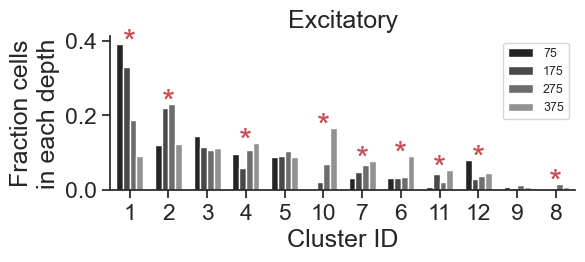

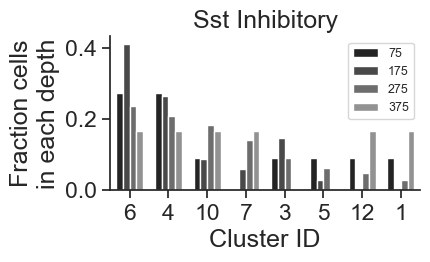

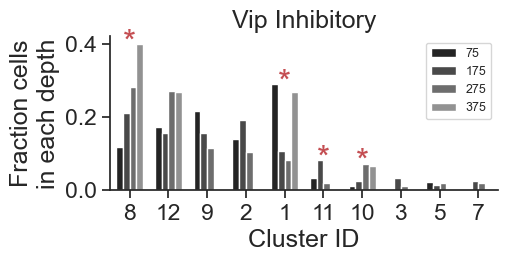

In [ ]:
location = 'binned_depth'
metric = 'fraction_cells_location'
ylabel = 'Fraction cells\nin each depth'


plotting.plot_cluster_depth_distribution_by_cre_line_separately(cluster_meta, location, cluster_order=None,
                                                            metric=metric, ylabel=ylabel, legend_title='', save_dir=save_dir, folder='cluster_properties')

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:5405: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  ax[i] = sns.barplot(data=cre_data, y='cluster_id', order=xorder, x=metric, orient='h',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:5405: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  ax[i] = sns.barplot(data=cre_data, y='cluster_id', order=xorder, x=metric, orient='h',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:5405: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  ax[i] = sns.barplot(data=cre_data, y='cluster_id', order=xorder, x=metric, orient='h',


array([<AxesSubplot:title={'center':'Exc'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst'}, xlabel='Fraction cells in each depth'>,
       <AxesSubplot:title={'center':'Vip'}>], dtype=object)

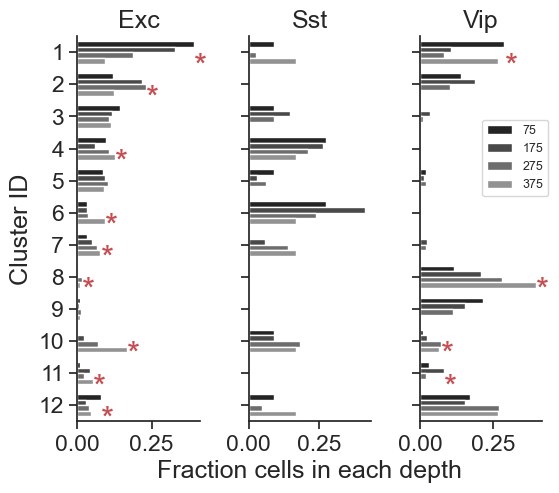

In [ ]:
location = 'binned_depth'
metric = 'fraction_cells_location'
ylabel = 'Fraction cells in each depth'

plotting.plot_cluster_depth_distribution_by_cre_lines(cluster_meta, location, metric, horiz=False,
                                                      ylabel=ylabel, save_dir=save_dir, folder='cluster_properties')

array([<AxesSubplot:title={'center':'Exc'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst'}, xlabel='Fraction cells in each depth'>,
       <AxesSubplot:title={'center':'Vip'}>], dtype=object)

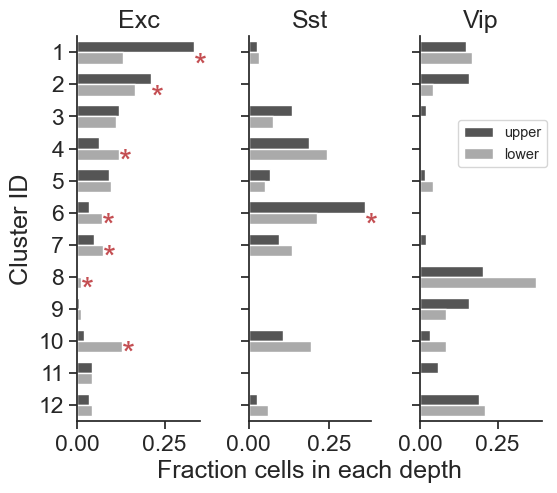

In [ ]:
location = 'layer'
metric = 'fraction_cells_location'
ylabel = 'Fraction cells in each depth'

plotting.plot_cluster_depth_distribution_by_cre_lines(cluster_meta, location, metric, horiz=False,
                                                      ylabel=ylabel, save_dir=save_dir, folder='cluster_properties')

array([<AxesSubplot:title={'center':'Exc'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst'}, xlabel='Number of cells in each depth'>,
       <AxesSubplot:title={'center':'Vip'}>], dtype=object)

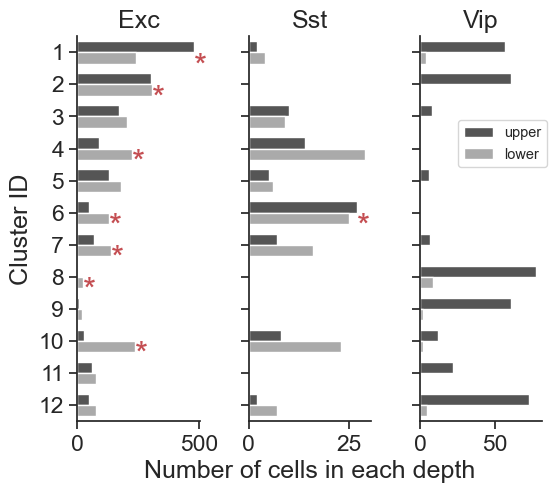

In [ ]:
location = 'layer'
metric = 'n_cells_location'
ylabel = 'Number of cells in each depth'

plotting.plot_cluster_depth_distribution_by_cre_lines(cluster_meta, location, metric, horiz=False,
                                                      ylabel=ylabel, save_dir=save_dir, folder='cluster_properties')

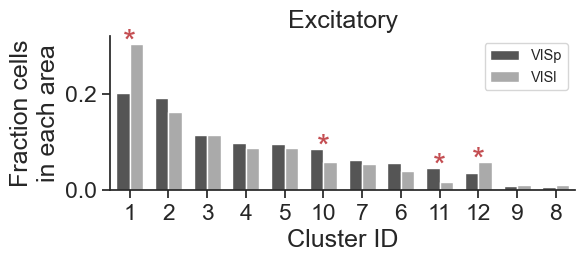

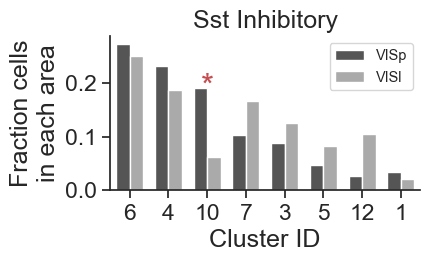

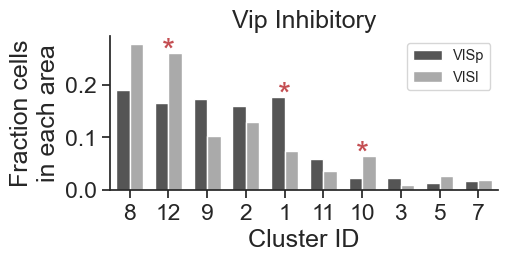

In [ ]:
location = 'targeted_structure'
metric = 'fraction_cells_location'
ylabel = 'Fraction cells\nin each area'

plotting.plot_cluster_depth_distribution_by_cre_line_separately(cluster_meta, location, cluster_order=None,
                                                            metric=metric, ylabel=ylabel, legend_title='', save_dir=save_dir, folder='cluster_properties')

array([<AxesSubplot:title={'center':'Exc'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst'}, xlabel='Fraction cells in each area'>,
       <AxesSubplot:title={'center':'Vip'}>], dtype=object)

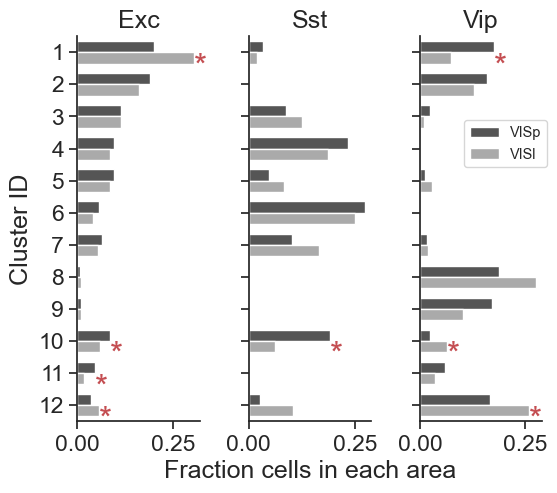

In [ ]:
location = 'targeted_structure'
metric = 'fraction_cells_location'
ylabel = 'Fraction cells in each area'

plotting.plot_cluster_depth_distribution_by_cre_lines(cluster_meta, location, metric, horiz=False,
                                                      ylabel=ylabel, save_dir=save_dir, folder='cluster_properties')

In [ ]:
# features = response_metrics[['cell_specimen_id', 'dominant_feature_cluster']].drop_duplicates(subset='cell_specimen_id')
# tmp = cluster_meta.merge(features, on='cell_specimen_id')

# plotting.plot_percent_cells_per_cluster_per_cre_dominant_feature(tmp, cluster_order=cluster_order, 
#                                                                  col_to_group='cre_line', save_dir=save_dir)

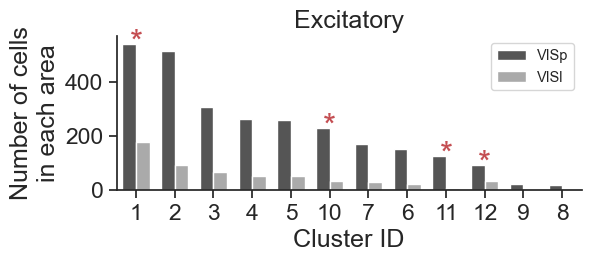

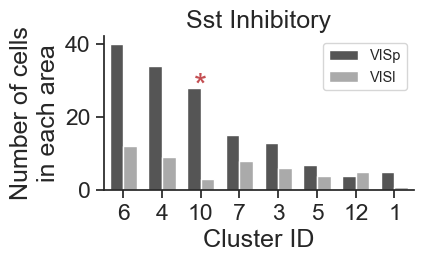

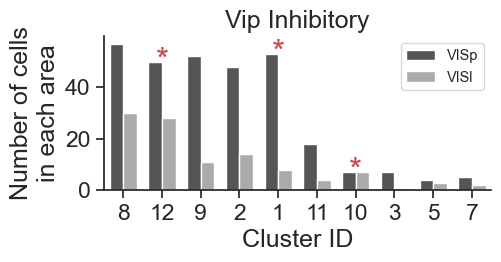

In [ ]:
location = 'targeted_structure'
metric = 'n_cells_location'
ylabel = 'Number of cells\nin each area'


plotting.plot_cluster_depth_distribution_by_cre_line_separately(cluster_meta, location, cluster_order=None,
                                                            metric=metric, ylabel=ylabel, legend_title='', save_dir=save_dir, folder='cluster_properties')

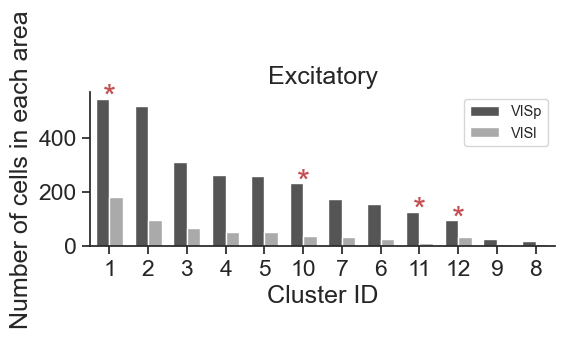

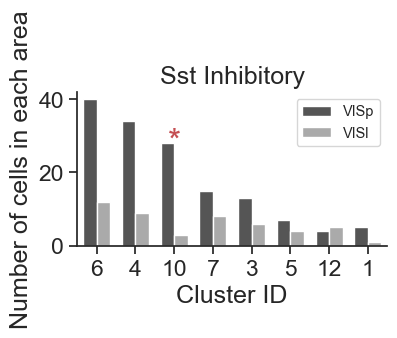

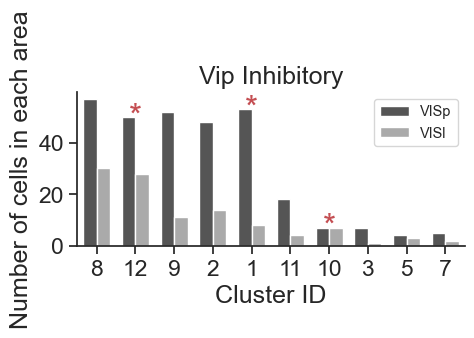

In [ ]:
location = 'targeted_structure'
metric = 'n_cells_location'
ylabel = 'Number of cells in each area'


plotting.plot_cluster_depth_distribution_by_cre_line_separately(cluster_meta, location, cluster_order=None,
                                                            metric=metric, ylabel=ylabel, legend_title='', save_dir=save_dir, folder='cluster_properties')

array([<AxesSubplot:title={'center':'Exc'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst'}, xlabel='Number of cells in each area'>,
       <AxesSubplot:title={'center':'Vip'}>], dtype=object)

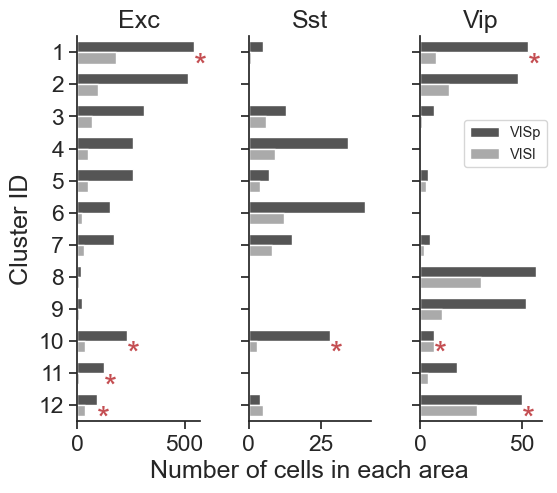

In [ ]:
location = 'targeted_structure'
metric = 'n_cells_location'
ylabel = 'Number of cells in each area'

plotting.plot_cluster_depth_distribution_by_cre_lines(cluster_meta, location, metric, horiz=False,
                                                      ylabel=ylabel, save_dir=save_dir, folder='cluster_properties')

## Response metrics for clusters

### Coding score metrics

In [ ]:
# load pre-saved coding score metrics 
coding_score_metrics = processing.generate_coding_score_metrics_table(cluster_meta, results_pivoted, 
                                                                      save_dir=clustering_results)

loading coding score metrics table


### Novelty modulation & transience mod

In [ ]:
n_cells_per_cluster = processing.get_fraction_cells_per_cluster_per_group(cluster_meta, 'cre_line')
n_cells_per_cluster.head()

,cre_line,cluster_id,n_cells_cluster,n_cells_group,fraction_per_cluster
0,Slc17a7-IRES2-Cre,1,722,3298,0.218921
1,Slc17a7-IRES2-Cre,2,611,3298,0.185264
2,Slc17a7-IRES2-Cre,3,377,3298,0.114312
3,Slc17a7-IRES2-Cre,4,313,3298,0.094906
4,Slc17a7-IRES2-Cre,5,310,3298,0.093996


In [ ]:
small_clusters = n_cells_per_cluster[n_cells_per_cluster.fraction_per_cluster<0.09].reset_index().set_index(['cre_line', 'cluster_id']).index.values
small_clusters = np.unique(small_clusters)
small_clusters

array([('Slc17a7-IRES2-Cre', 6), ('Slc17a7-IRES2-Cre', 7),
       ('Slc17a7-IRES2-Cre', 8), ('Slc17a7-IRES2-Cre', 9),
       ('Slc17a7-IRES2-Cre', 10), ('Slc17a7-IRES2-Cre', 11),
       ('Slc17a7-IRES2-Cre', 12), ('Sst-IRES-Cre', 1),
       ('Sst-IRES-Cre', 5), ('Sst-IRES-Cre', 12), ('Vip-IRES-Cre', 3),
       ('Vip-IRES-Cre', 5), ('Vip-IRES-Cre', 7), ('Vip-IRES-Cre', 10),
       ('Vip-IRES-Cre', 11)], dtype=object)

3901 total cells
2069 after removing clusters with < 9% of cells in a given cre line


<AxesSubplot:title={'center':'Novelty modulation'}, xlabel='Cluster ID', ylabel='<- Familiar --- Novel ->'>

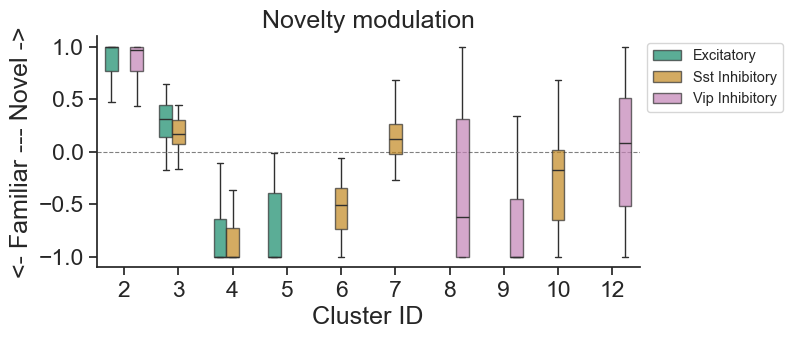

In [ ]:
small_clusters = n_cells_per_cluster[n_cells_per_cluster.fraction_per_cluster<0.09].reset_index().set_index(['cre_line', 'cluster_id']).index.values
small_clusters = np.unique(small_clusters)

coding_score_metrics_filtered = coding_score_metrics.copy()
for small_cluster in small_clusters: 
    csids = coding_score_metrics[(coding_score_metrics.cre_line==small_cluster[0]) & (coding_score_metrics.cluster_id==small_cluster[1])].index.values
    coding_score_metrics_filtered = coding_score_metrics_filtered.drop(index=csids)
# remove non coding cluster
csids = coding_score_metrics_filtered[coding_score_metrics_filtered.cluster_id==1].index.values
coding_score_metrics_filtered = coding_score_metrics_filtered.drop(index=csids)

print(len(coding_score_metrics), 'total cells')
print(len(coding_score_metrics_filtered), 'after removing clusters with < 9% of cells in a given cre line')

# metric comparing N to avg of F and n+
plotting.plot_experience_modulation(coding_score_metrics_filtered, metric='experience_modulation', save_dir=None, 
                                    folder='metric_distributions', suffix='_filtered_clusters')

In [ ]:
coding_metrics = processing.get_coding_score_metrics(cluster_meta, results_pivoted)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\processing.py:2235: RuntimeWarning: invalid value encountered in double_scalars
  exp_mod_persistence = (row['Novel +']-row['Novel'])/(row['Novel +']+row['Novel'])
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\processing.py:2213: RuntimeWarning: invalid value encountered in double_scalars
  feature_selectivity = (values[0] - (np.mean(values[1:]))) / (values[0] + (np.mean(values[1:])))
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\processing.py:2217: RuntimeWarning: invalid value encountered in double_scalars
  experience_selectivity = (values[0] - (np.mean(values[1:]))) / (values[0] + (np.mean(values[1:])))
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\processing.py:2229: RuntimeWarning: inval

3901 total cells
2069 after removing clusters with < 9% of cells in a given cre line


<AxesSubplot:title={'center':'Novelty modulation'}, xlabel='Cluster ID', ylabel='<- Familiar --- Novel ->'>

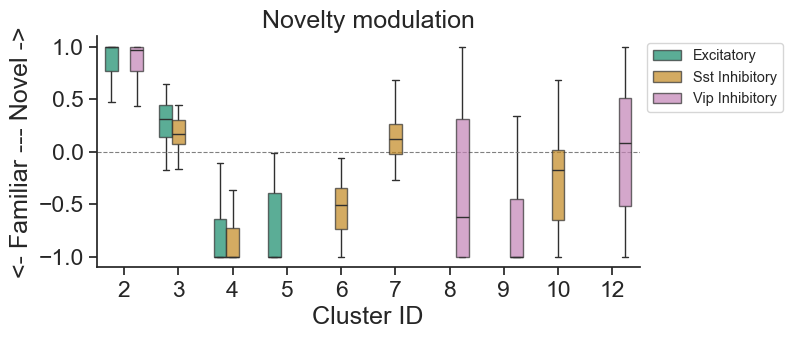

In [ ]:
small_clusters = n_cells_per_cluster[n_cells_per_cluster.fraction_per_cluster<0.09].reset_index().set_index(['cre_line', 'cluster_id']).index.values
small_clusters = np.unique(small_clusters)

coding_score_metrics_filtered = coding_metrics.copy()
for small_cluster in small_clusters: 
    csids = coding_score_metrics[(coding_score_metrics.cre_line==small_cluster[0]) & (coding_score_metrics.cluster_id==small_cluster[1])].index.values
    coding_score_metrics_filtered = coding_score_metrics_filtered.drop(index=csids)
# remove non coding cluster
csids = coding_score_metrics_filtered[coding_score_metrics_filtered.cluster_id==1].index.values
coding_score_metrics_filtered = coding_score_metrics_filtered.drop(index=csids)

print(len(coding_score_metrics), 'total cells')
print(len(coding_score_metrics_filtered), 'after removing clusters with < 9% of cells in a given cre line')

# metric comparing N to avg of F and n+
plotting.plot_experience_modulation(coding_score_metrics_filtered, metric='experience_modulation', save_dir=None, 
                                    folder='metric_distributions', suffix='_filtered_clusters')

3901 total cells
2069 after removing clusters with < 9% of cells in a given cre line


<AxesSubplot:title={'center':'Novelty modulation'}, xlabel='Cluster ID', ylabel='<- Familiar --- Novel ->'>

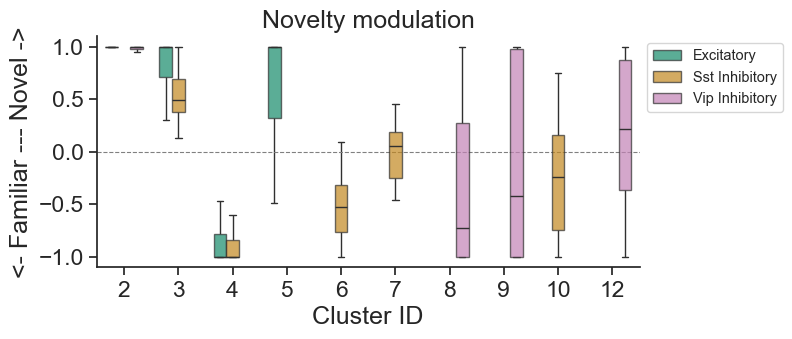

In [ ]:
small_clusters = n_cells_per_cluster[n_cells_per_cluster.fraction_per_cluster<0.09].reset_index().set_index(['cre_line', 'cluster_id']).index.values
small_clusters = np.unique(small_clusters)

coding_score_metrics_filtered = coding_metrics.copy()
for small_cluster in small_clusters: 
    csids = coding_score_metrics[(coding_score_metrics.cre_line==small_cluster[0]) & (coding_score_metrics.cluster_id==small_cluster[1])].index.values
    coding_score_metrics_filtered = coding_score_metrics_filtered.drop(index=csids)
# remove non coding cluster
csids = coding_score_metrics_filtered[coding_score_metrics_filtered.cluster_id==1].index.values
coding_score_metrics_filtered = coding_score_metrics_filtered.drop(index=csids)

print(len(coding_score_metrics), 'total cells')
print(len(coding_score_metrics_filtered), 'after removing clusters with < 9% of cells in a given cre line')

# metric comparing N to avg of F and n+
plotting.plot_experience_modulation(coding_score_metrics_filtered, metric='exp_mod_direction', save_dir=None, 
                                    folder='metric_distributions', suffix='_filtered_clusters')

3901 total cells
2069 after removing clusters with < 9% of cells in a given cre line


<AxesSubplot:title={'center':'Novelty coding persistence'}, xlabel='Cluster ID', ylabel='<- Transient --- Persistent ->'>

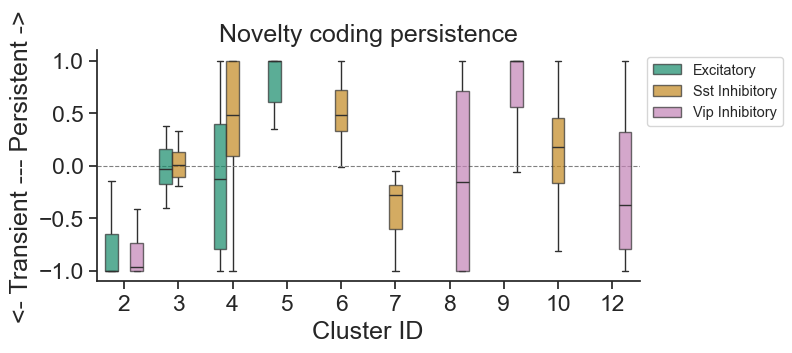

In [ ]:
small_clusters = n_cells_per_cluster[n_cells_per_cluster.fraction_per_cluster<0.09].reset_index().set_index(['cre_line', 'cluster_id']).index.values
small_clusters = np.unique(small_clusters)

coding_score_metrics_filtered = coding_metrics.copy()
for small_cluster in small_clusters: 
    csids = coding_score_metrics[(coding_score_metrics.cre_line==small_cluster[0]) & (coding_score_metrics.cluster_id==small_cluster[1])].index.values
    coding_score_metrics_filtered = coding_score_metrics_filtered.drop(index=csids)
# remove non coding cluster
csids = coding_score_metrics_filtered[coding_score_metrics_filtered.cluster_id==1].index.values
coding_score_metrics_filtered = coding_score_metrics_filtered.drop(index=csids)

print(len(coding_score_metrics), 'total cells')
print(len(coding_score_metrics_filtered), 'after removing clusters with < 9% of cells in a given cre line')

# metric comparing N to avg of F and n+
plotting.plot_experience_modulation(coding_score_metrics_filtered, metric='exp_mod_persistence', save_dir=None, 
                                    folder='metric_distributions', suffix='_filtered_clusters')

In [ ]:
x = 'exp_mod_direction' # novel-familiar / sum
y = 'exp_mod_persistence' # novel+/novel
hue = 'cell_type'

# limit to metrics we care about
tmp = coding_score_metrics_filtered[['cluster_id', x, y, hue, 'cre_line']]
# drop NA
tmp = tmp.dropna()
# get mean per cluster
tmp_cluster_metrics = tmp.groupby(['cre_line', 'cluster_id']).mean()
# add in cluster sizes
tmp_cluster_metrics = tmp_cluster_metrics.merge(n_cells_per_cluster, on=['cre_line', 'cluster_id'])

C:\Users\marinag\AppData\Local\Temp\ipykernel_31024\3778635692.py:10: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp_cluster_metrics = tmp.groupby(['cre_line', 'cluster_id']).mean()


In [ ]:
small_clusters = n_cells_per_cluster[n_cells_per_cluster.fraction_per_cluster<0.09].reset_index().set_index(['cre_line', 'cluster_id']).index.values
small_clusters = np.unique(small_clusters)

coding_score_metrics_filtered = coding_score_metrics.copy()
for small_cluster in small_clusters: 
    csids = coding_score_metrics[(coding_score_metrics.cre_line==small_cluster[0]) & (coding_score_metrics.cluster_id==small_cluster[1])].index.values
    coding_score_metrics_filtered = coding_score_metrics_filtered.drop(index=csids)
# remove non coding cluster
csids = coding_score_metrics_filtered[coding_score_metrics_filtered.cluster_id==1].index.values
coding_score_metrics_filtered = coding_score_metrics_filtered.drop(index=csids)

print(len(coding_score_metrics), 'total cells')
print(len(coding_score_metrics_filtered), 'after removing clusters with < 9% of cells in a given cre line')

3901 total cells
2069 after removing clusters with < 9% of cells in a given cre line


#### Experience modulation by cluster id and cell class

loading coding score metrics table


<AxesSubplot:title={'center':'Novelty modulation'}, xlabel='Cluster ID', ylabel='<- Familiar --- Novel ->'>

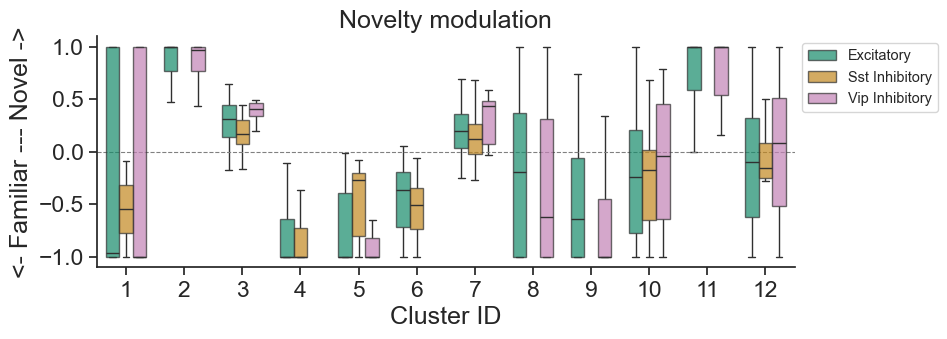

In [ ]:
# load pre-saved coding score metrics 
coding_score_metrics = processing.generate_coding_score_metrics_table(cluster_meta, results_pivoted, 
                                                                      save_dir=clustering_results)

# metric comparing N to avg of F and N+
plotting.plot_experience_modulation(coding_score_metrics, metric='experience_modulation', save_dir=None, 
                                    folder='metric_distributions', suffix='_all_clusters')

In [ ]:
# # metric comparing F to N
# plotting.plot_experience_modulation(coding_score_metrics, metric='exp_mod_direction', save_dir=None, 
#                                     folder='metric_distributions', suffix='_all_clusters')

#### filter coding scores to limit to clusters with >3.5% of cells per cre and plot experience modulation

In [ ]:
# which clusters are removed if you eliminate those with <3.5% of all cells in that cre line?
n_cells_table = processing.get_cluster_proportion_stats_for_locations(cluster_meta, location=location)
n_cells_table[n_cells_table.fraction_cells_cluster<0.035].reset_index().set_index(['cre_line', 'cluster_id'])

targeted_structure  n_cells_location  \
cre_line          cluster_id                                        
Slc17a7-IRES2-Cre 8                        VISl                 6   
                  8                        VISp                19   
                  9                        VISl                 6   
                  9                        VISp                23   
Sst-IRES-Cre      1                        VISl                 1   
                  1                        VISp                 5   
Vip-IRES-Cre      3                        VISl                 1   
                  3                        VISp                 7   
                  5                        VISl                 3   
                  5                        VISp                 4   
                  7                        VISl                 2   
                  7                        VISp                 5   
                  10                       VISl                 7   
                  10                       VISp                 7   

                              n_cells_location_total  fraction_cells_location  \
cre_line          cluster_id                                                    
Slc17a7-IRES2-Cre 8                              590                 0.010169   
                  8                             2708                 0.007016   
                  9                              590                 0.010169   
                  9                             2708                 0.008493   
Sst-IRES-Cre      1                               48                 0.020833   
                  1                              146                 0.034247   
Vip-IRES-Cre      3                              108                 0.009259   
                  3                              301                 0.023256   
                  5                              108                 0.027778   
                  5                              301                 0.013289   
                  7                              108                 0.018519   
                  7                              301                 0.016611   
                  10                             108                 0.064815   
                  10                             301                 0.023256   

                              percent_cells_location  n_cells_cluster  \
cre_line          cluster_id                                            
Slc17a7-IRES2-Cre 8                         1.016949               25   
                  8                         0.701625               25   
                  9                         1.016949               29   
                  9                         0.849335               29   
Sst-IRES-Cre      1                         2.083333                6   
                  1                         3.424658                6   
Vip-IRES-Cre      3                         0.925926                8   
                  3                         2.325581                8   
                  5                         2.777778                7   
                  5                         1.328904                7   
                  7                         1.851852                7   
                  7                         1.661130                7   
                  10                        6.481481               14   
                  10                        2.325581               14   

                              n_cells_cre  fraction_cells_cluster  \
cre_line          cluster_id                                        
Slc17a7-IRES2-Cre 8                  3298                0.007580   
                  8                  3298                0.007580   
                  9                  3298                0.008793   
                  9                  3298                0.008793   
Sst-IRES-Cre      1                   194   

3901 total cells
3805 after removing clusters with < 4% of cells in a given cre line


<AxesSubplot:title={'center':'Novelty modulation'}, xlabel='Cluster ID', ylabel='<- Familiar --- Novel ->'>

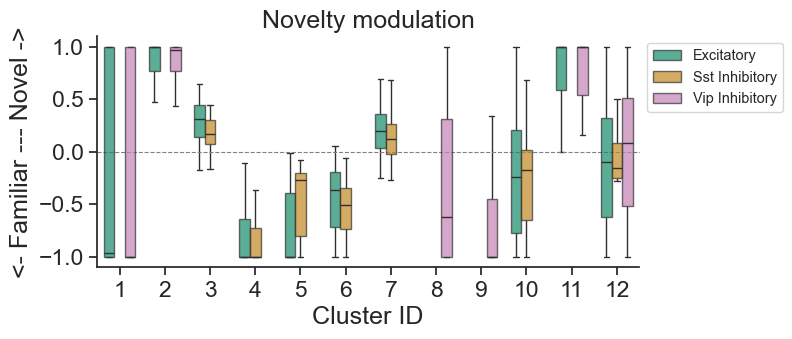

In [ ]:
location = 'layer'
order = ['upper', 'lower']
n_cells_table = processing.get_cluster_proportion_stats_for_locations(cluster_meta, location=location)
small_clusters = n_cells_table[n_cells_table.fraction_cells_cluster<0.035].reset_index().set_index(['cre_line', 'cluster_id']).index.values
small_clusters = np.unique(small_clusters)


coding_score_metrics_filtered = coding_score_metrics.copy()
for small_cluster in small_clusters: 
    csids = coding_score_metrics[(coding_score_metrics.cre_line==small_cluster[0]) & (coding_score_metrics.cluster_id==small_cluster[1])].index.values
    coding_score_metrics_filtered = coding_score_metrics_filtered.drop(index=csids)

print(len(coding_score_metrics), 'total cells')
print(len(coding_score_metrics_filtered), 'after removing clusters with < 4% of cells in a given cre line')


# metric comparing N to avg of F and n+
plotting.plot_experience_modulation(coding_score_metrics_filtered, metric='experience_modulation', save_dir=None, 
                                    folder='metric_distributions', suffix='_filtered_clusters')

In [ ]:
# # metric comparing F to N
# plotting.plot_experience_modulation(coding_score_metrics_filtered, metric='exp_mod_direction', save_dir=None, 
#                                     folder='metric_distributions', suffix='_filtered_clusters')

### Cell metrics for clusters

In [ ]:
# save_dir = r'\\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_plots\figure_4\all_cre_clustering_113023'
metrics = processing.generate_merged_table_of_coding_score_and_model_free_metrics(cluster_meta, results_pivoted,
                                                                 data_type='events',
                                                                 session_subset='full_session',
                                                                 inclusion_criteria='platform_experiment_table',
                                                                 save_dir=clustering_results)

loading coding score and model free metrics table


In [ ]:
print(len(metrics.ophys_experiment_id.unique()))
print(len(metrics.cell_specimen_id.unique()))

393
3901


In [ ]:
response_metrics = metrics.copy()

#### Image selectivity

In [ ]:

# def plot_response_metrics_boxplot_by_cre_as_cols(response_metrics, metric=None, label=None, lims=(0,1), 
#                                          horiz=False, line_val=None, pointplot=False, 
#                                          save_dir=None, folder=None, suffix='', ax=None):
#     """
#     Plot running modulation for different cell types and experience levels.
    
#     Parameters:
#     - response_metrics (DataFrame): DataFrame containing response metrics

#     """

#     experience_level_colors = utils.get_experience_level_colors() 
#     experience_levels = utils.get_new_experience_levels()
#     cre_lines = utils.get_cre_lines()

#     if label is None:
#         label = metric

#     if cluster_order is not None:
#         order = cluster_order
#     else:
#         order = np.sort(n_cells_table.cluster_id.unique())
#     n_clusters = len(order)

    
#     if horiz:
#         figsize = (8, 8)
#         fig, ax = plt.subplots(3, 1, figsize=figsize, sharey=True, sharex=True)
#     else:
#         figsize = (8, 6)
#         fig, ax = plt.subplots(1, 3, figsize=figsize, sharey=True, sharex=True)
    
#     for i, cre_line in enumerate(cre_lines):
#         data = response_metrics[response_metrics.cre_line==cre_line]

#         if pointplot:
#             suffix = suffix+'_pointplot'
#             if horiz:
#                 ax[i] = sns.pointplot(data=data, x='cluster_id', y=metric, order=order,
#                                     hue='experience_level', hue_order=experience_levels, palette=experience_level_colors,
#                                     join=False, dodge=0.3, ax=ax[i])
#             else: 
#                 ax[i] = sns.pointplot(data=data, y='cluster_id', x=metric, order=order, orient='h',
#                                     hue='experience_level', hue_order=experience_levels, palette=experience_level_colors,
#                                     join=False, dodge=0.3, ax=ax[i])
#             for line in ax[i].lines:
#                 line.set_markersize(1)
#         else:
#             suffix = suffix+'_boxplot'
#             if horiz:
#                 ax[i] = sns.boxplot(data=data, x='cluster_id', y=metric, order=order, showfliers=False,
#                                 hue='experience_level', hue_order=experience_levels, palette=experience_level_colors,
#                                 width=0.6, boxprops=dict(alpha=.7), ax=ax[i])
#             else:
#                 ax[i] = sns.boxplot(data=data, y='cluster_id', x=metric, order=order, showfliers=False, orient='h',
#                                hue='experience_level', hue_order=experience_levels, palette=experience_level_colors,
#                                width=0.6, boxprops=dict(alpha=.7), ax=ax[i])

#         ax[i].set_title(utils.convert_cre_line_to_cell_type(cre_line))
#         ax[i].get_legend().remove()
#         ax[i].set_xlabel('')
#         ax[i].set_ylabel('')
#         # ax[i].set_xticks(order+1)
#         # ax[i].set_xlim((0.5, n_clusters+0.5))
#         ax[i].spines[['right', 'top']].set_visible(False)
#         if line_val is not None:
#             if horiz:
#                 ax[i].axhline(y=line_val, xmin=0, xmax=1, color='gray', linestyle='--', linewidth=1)
#             else: 
#                 ax[i].axvline(x=line_val, ymin=0, ymax=1, linestyle='--', color='gray', linewidth=1)
#     if horiz:
#         ax[1].set_ylabel(label)
#         ax[2].set_xlabel('Cluster ID')
#         for i in range(3):
#             ax[i].set_ylim(lims)
#     else:
#         ax[0].set_ylabel('Cluster ID')
#         ax[1].set_xlabel(label)
#         for i in range(3):
#             ax[i].set_xlim(lims)
        
#     # ax[1].legend(loc='upper right', fontsize='xx-small', title_fontsize='xx-small')
#     # plt.suptitle(metric.replace("_", " "), x=0.51, y=0.95)
#     plt.subplots_adjust(hspace=0.3, wspace=0.3)

#     if save_dir:
#         utils.save_figure(fig, figsize, save_dir, folder, metric+suffix)

#     return ax


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Image selectivity '>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

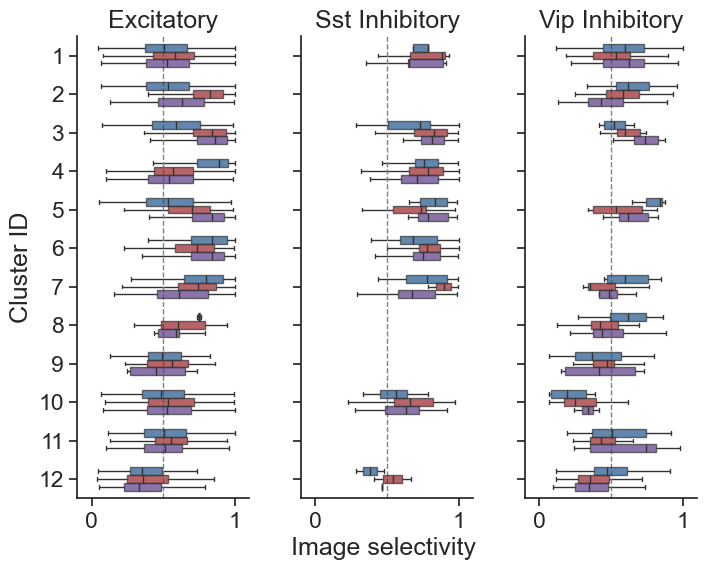

In [ ]:
metric = 'lifetime_sparseness_images'
label = 'Image selectivity '

plotting.plot_response_metrics_boxplot_by_cre_as_cols(response_metrics, metric, label=label, horiz=False, line_val=0.5,
                                             lims=(-0.1, 1.1), save_dir=save_dir, folder='metrics_distributions')

array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Image selectivity '>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}, xlabel='Cluster ID'>],
      dtype=object)

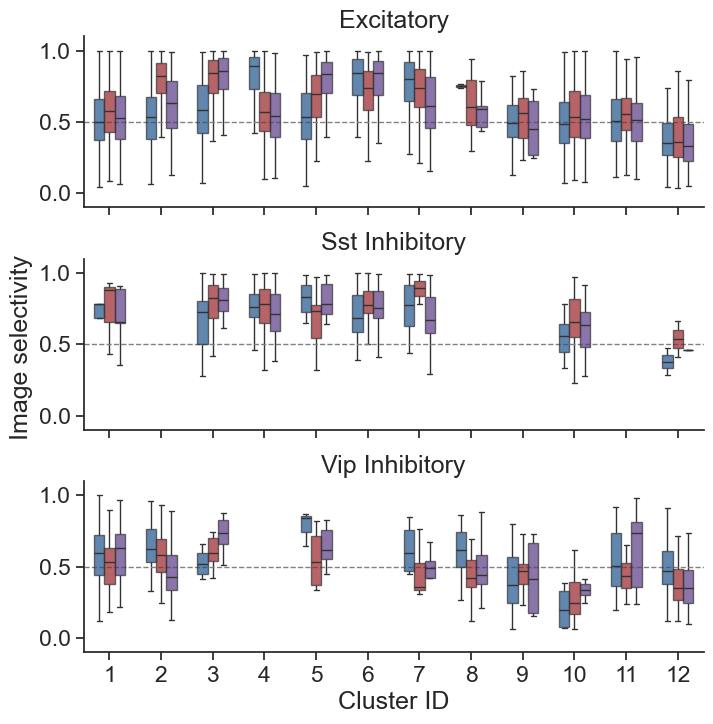

In [ ]:
metric = 'lifetime_sparseness_images'
label = 'Image selectivity '

plotting.plot_response_metrics_boxplot_by_cre_as_cols(response_metrics, metric, label=label, horiz=True, line_val=0.5,
                                             lims=(-0.1, 1.1), save_dir=save_dir, folder='metrics_distributions')

array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Image selectivity '>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

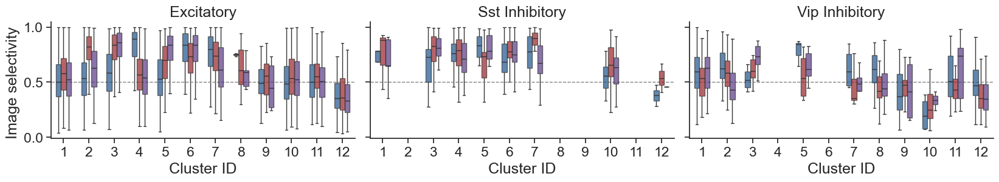

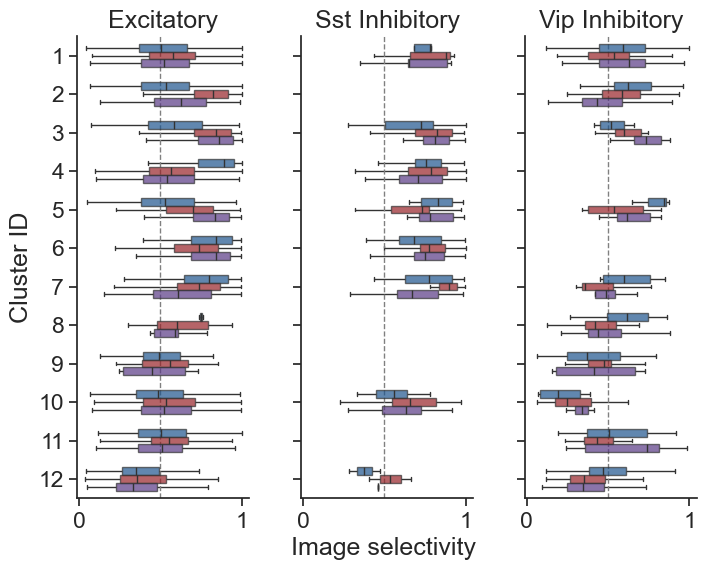

In [ ]:
metric = 'lifetime_sparseness_images'
ylabel = 'Image selectivity '

plotting.plot_response_metrics_boxplot_by_cre(response_metrics, metric, ylabel=ylabel, horiz=True, line_val=0.5,
                                              save_dir=save_dir, folder='metrics_distributions')

plotting.plot_response_metrics_boxplot_by_cre_as_cols(response_metrics, metric, label=ylabel, horiz=False, line_val=0.5,
                                             save_dir=save_dir, folder='metrics_distributions')

#### Reliability - pref image

array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Response reliability \n(preferred image)'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

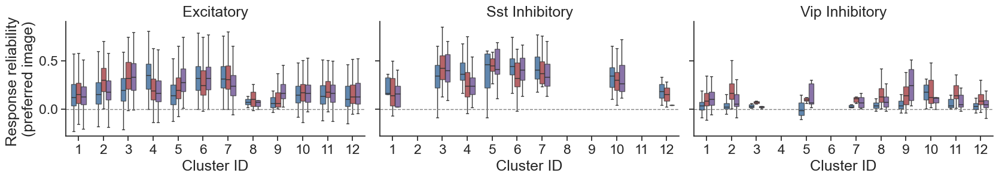

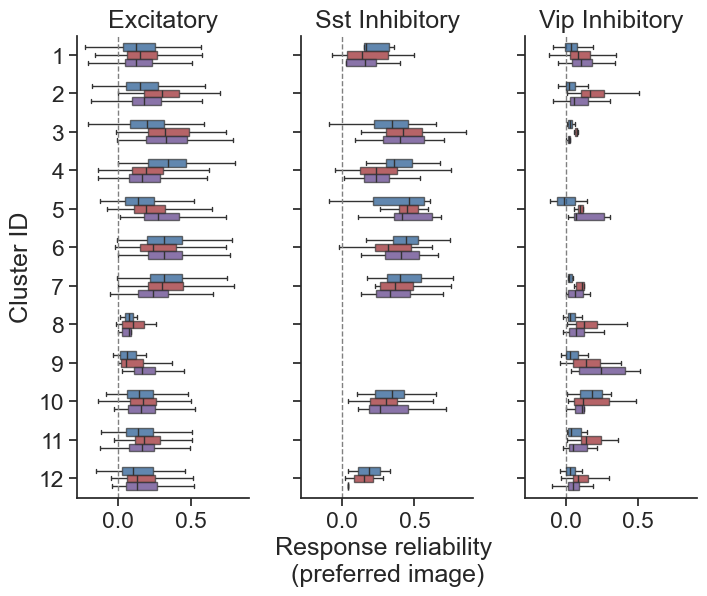

In [ ]:
metric = 'reliability_pref_image'
ylabel = 'Response reliability \n(preferred image)'

plotting.plot_response_metrics_boxplot_by_cre(response_metrics, metric, ylabel=ylabel, horiz=True, line_val=0, 
                                              save_dir=save_dir, folder='metrics_distributions', suffix='_horiz')

plotting.plot_response_metrics_boxplot_by_cre_as_cols(response_metrics, metric, label=ylabel, horiz=False, line_val=0,
                                            save_dir=save_dir, folder='metrics_distributions')

#### Fano factor - pref image

array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Fano factor\n (preferred image)'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

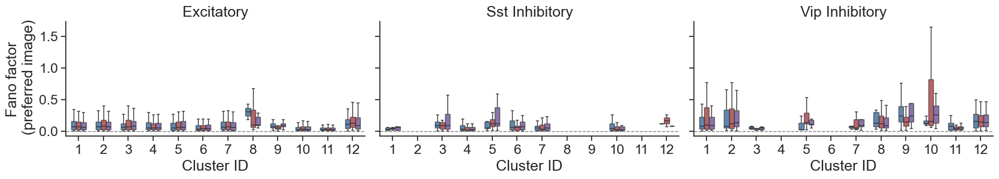

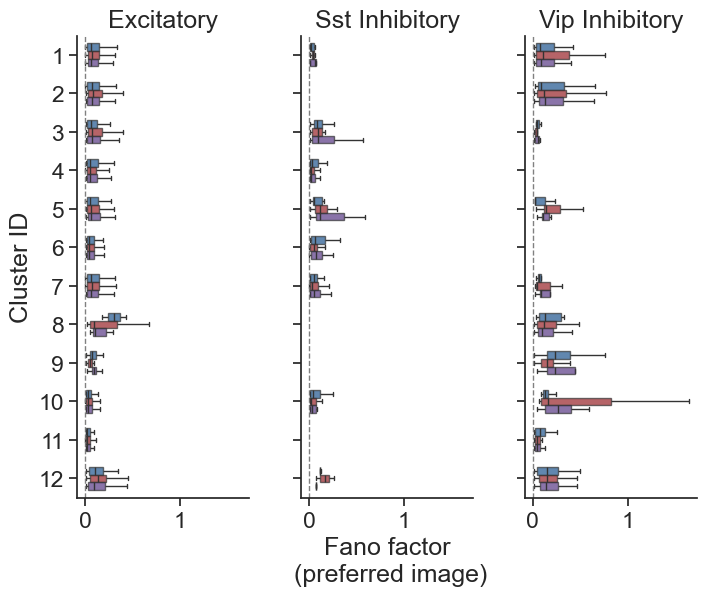

In [ ]:
metric = 'fano_factor_pref_image'
ylabel = 'Fano factor\n (preferred image)'

plotting.plot_response_metrics_boxplot_by_cre(response_metrics, metric, ylabel=ylabel, horiz=True, line_val=0, 
                                              save_dir=save_dir, folder='metrics_distributions', suffix='_horiz')

plotting.plot_response_metrics_boxplot_by_cre_as_cols(response_metrics, metric, label=ylabel, horiz=False, line_val=0,
                                             save_dir=save_dir, folder='metrics_distributions')

#### Reliability - changes

array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Response eliability\n(image changes)'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

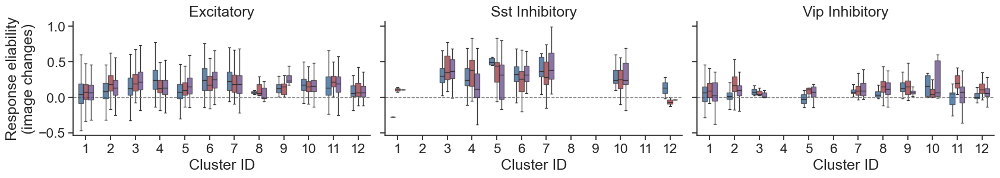

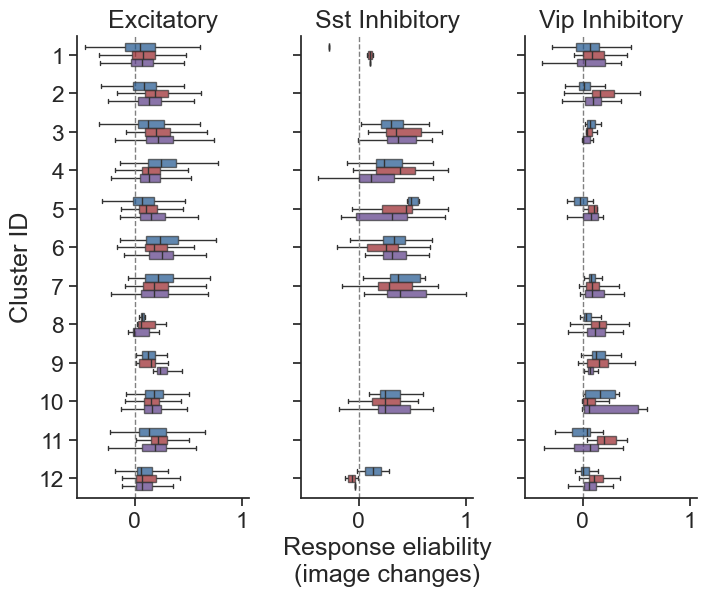

In [ ]:
metric = 'reliability_changes'
ylabel = 'Response eliability\n(image changes)'

plotting.plot_response_metrics_boxplot_by_cre(response_metrics, metric, ylabel=ylabel, horiz=True, line_val=0, 
                                              save_dir=save_dir, folder='metrics_distributions', suffix='_horiz')

plotting.plot_response_metrics_boxplot_by_cre_as_cols(response_metrics, metric, label=ylabel, horiz=False, line_val=0,
                                             save_dir=save_dir, folder='metrics_distributions')

#### Change modulation

array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Change modulation'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

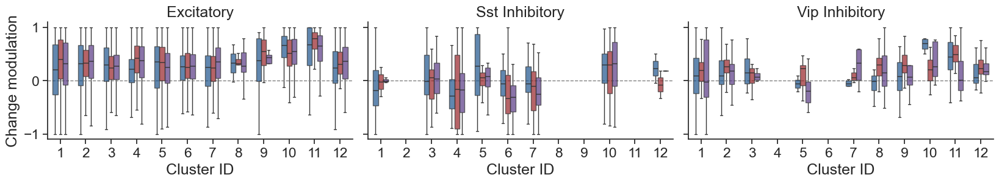

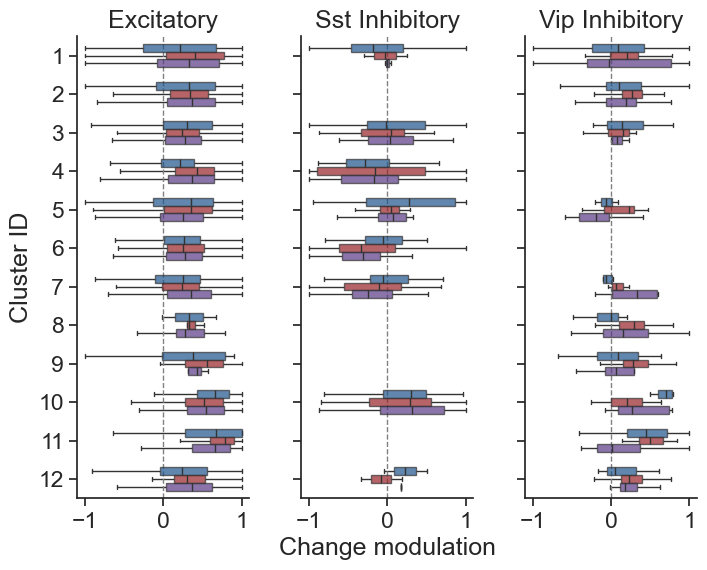

In [ ]:
metric = 'change_modulation_index'
ylabel = 'Change modulation'

plotting.plot_response_metrics_boxplot_by_cre(response_metrics, metric, ylabel=ylabel, horiz=True, line_val=0, 
                                              save_dir=save_dir, folder='metrics_distributions', suffix='_horiz')

plotting.plot_response_metrics_boxplot_by_cre_as_cols(response_metrics, metric, label=ylabel, horiz=False, line_val=0,
                                             save_dir=save_dir, folder='metrics_distributions')

#### Choice modulation 

array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Choice modulation'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

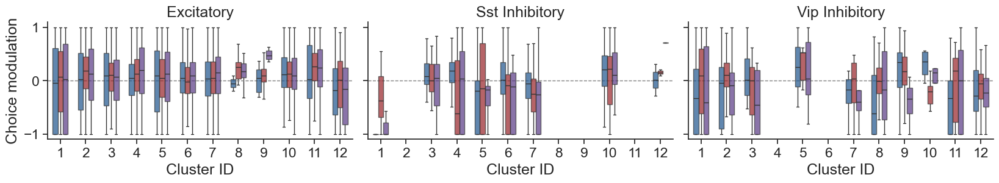

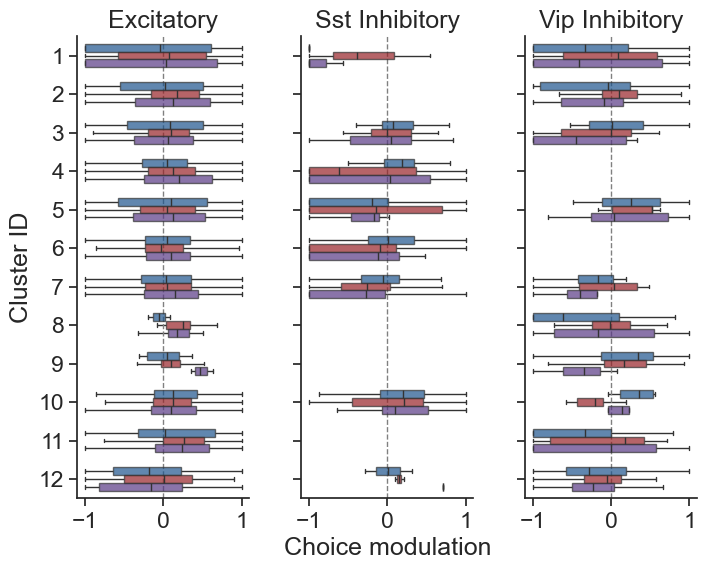

In [ ]:
metric = 'hit_miss_index'
ylabel = 'Choice modulation'

plotting.plot_response_metrics_boxplot_by_cre(response_metrics, metric, ylabel=ylabel, horiz=True, line_val=0, 
                                              save_dir=save_dir, folder='metrics_distributions', suffix='_horiz')

plotting.plot_response_metrics_boxplot_by_cre_as_cols(response_metrics, metric, label=ylabel, horiz=False, line_val=0,
                                              save_dir=save_dir, folder='metrics_distributions')

#### Omission modulation 

array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Omission modulation'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

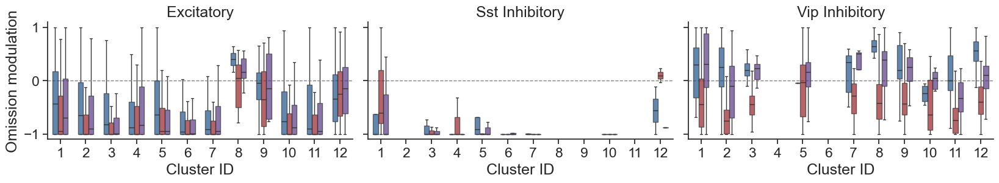

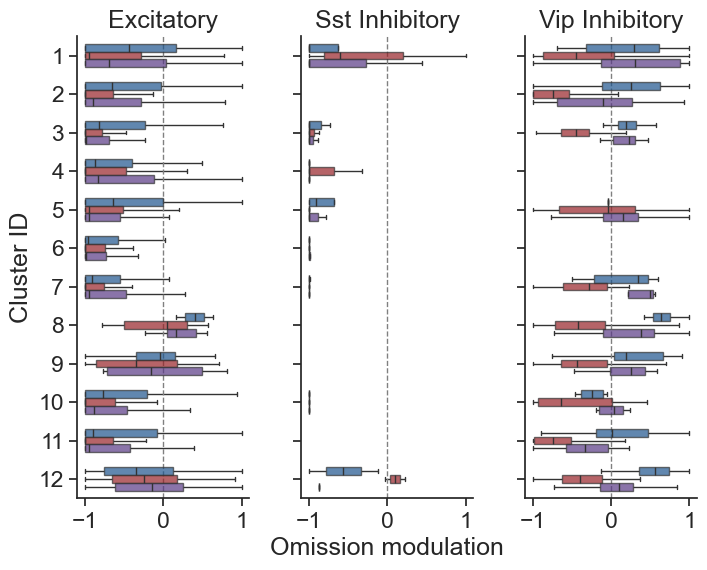

In [ ]:
metric = 'omission_modulation_index'
ylabel = 'Omission modulation'


plotting.plot_response_metrics_boxplot_by_cre(response_metrics, metric, ylabel=ylabel, horiz=True, line_val=0, 
                                              save_dir=save_dir, folder='metrics_distributions', suffix='_horiz')

plotting.plot_response_metrics_boxplot_by_cre_as_cols(response_metrics, metric, label=ylabel, horiz=False, line_val=0,
                                             save_dir=save_dir, folder='metrics_distributions')

#### Reliability - omissions

array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Response reliability \n(omissions)'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

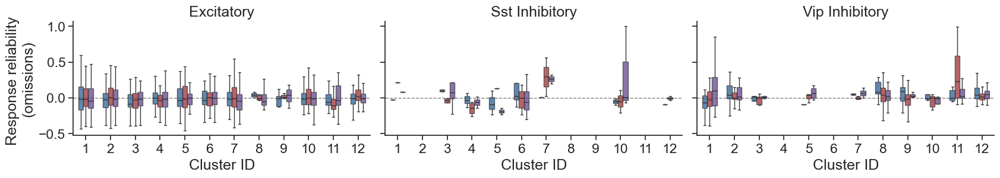

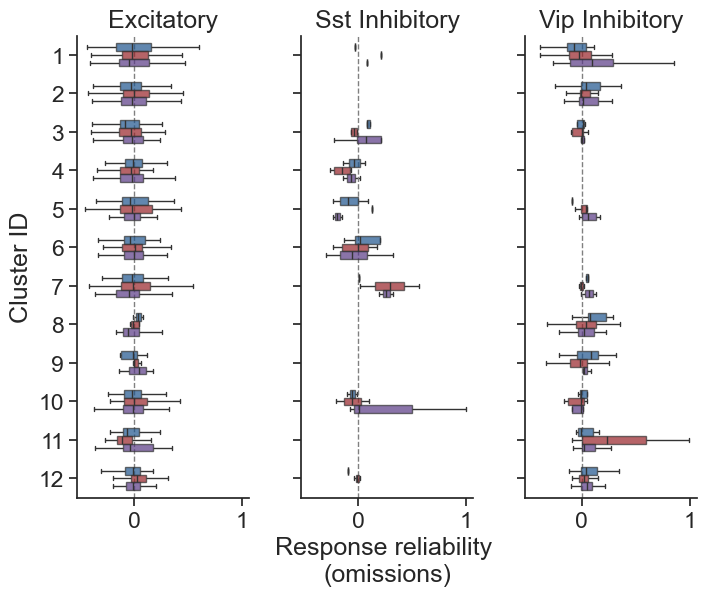

In [ ]:
metric = 'reliability_omissions'
ylabel = 'Response reliability \n(omissions)'


plotting.plot_response_metrics_boxplot_by_cre(response_metrics, metric, ylabel=ylabel, horiz=True, line_val=0, 
                                              save_dir=save_dir, folder='metrics_distributions', suffix='_horiz')

plotting.plot_response_metrics_boxplot_by_cre_as_cols(response_metrics, metric, label=ylabel, horiz=False, line_val=0,
                                              save_dir=save_dir, folder='metrics_distributions')

#### Fano factor - omissions

array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Fano factor \n(omissions)'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

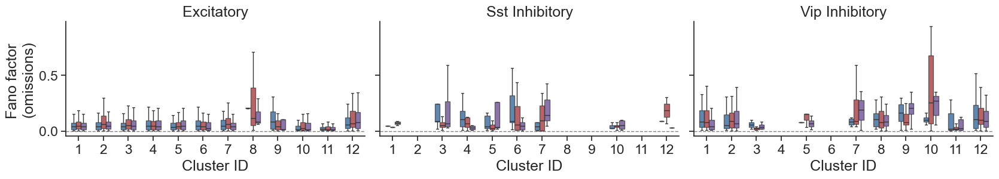

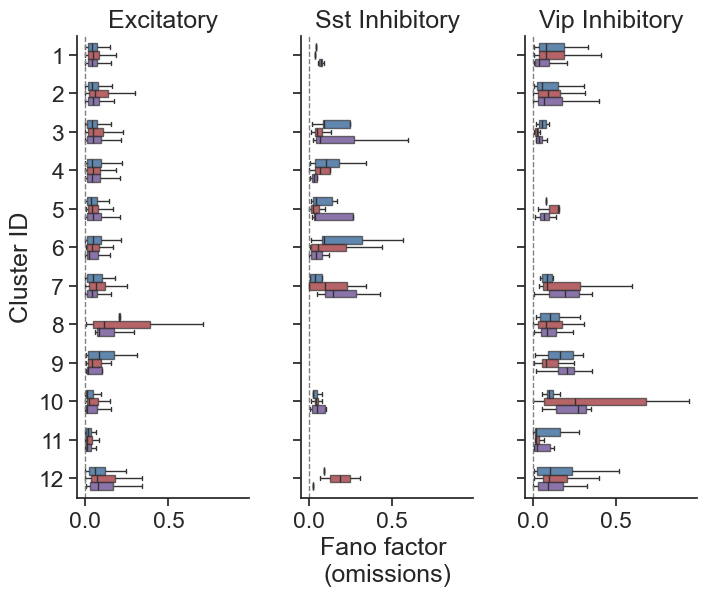

In [ ]:
metric = 'fano_factor_omissions'
ylabel = 'Fano factor \n(omissions)'


plotting.plot_response_metrics_boxplot_by_cre(response_metrics, metric, ylabel=ylabel, horiz=True, line_val=0, 
                                              save_dir=save_dir, folder='metrics_distributions', suffix='_horiz')

plotting.plot_response_metrics_boxplot_by_cre_as_cols(response_metrics, metric, label=ylabel, horiz=False, line_val=0,
                                             save_dir=save_dir, folder='metrics_distributions')

#### Running modulation 

array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Running modulation'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

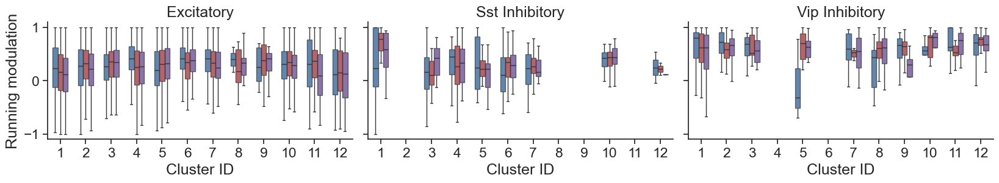

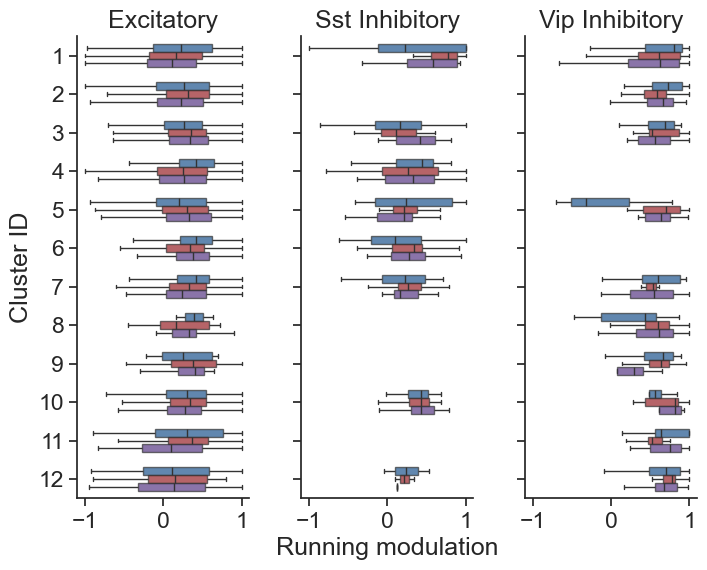

In [ ]:
metric = 'running_modulation_all_images'
ylabel = 'Running modulation'

plotting.plot_response_metrics_boxplot_by_cre(response_metrics, metric, ylabel=ylabel, horiz=True,
                                              save_dir=save_dir, folder='metrics_distributions', suffix='_horiz')

plotting.plot_response_metrics_boxplot_by_cre_as_cols(response_metrics, metric, label=ylabel, horiz=False, 
                                            save_dir=save_dir, folder='metrics_distributions')

In [ ]:
# metric = 'running_modulation_changes'
# ylabel = 'Running modulation - changes'



# plotting.plot_response_metrics_boxplot_by_cre(response_metrics, metric, ylabel=ylabel, horiz=True,
#                                               save_dir=save_dir, folder='metrics_distributions', suffix='_horiz')

## stats

In [ ]:
# save_dir = r'\\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_plots\figure_4\all_cre_clustering_113023'
metrics = processing.generate_merged_table_of_coding_score_and_model_free_metrics(cluster_meta, results_pivoted,
                                                                 data_type='events',
                                                                 session_subset='full_session',
                                                                 inclusion_criteria='platform_experiment_table',
                                                                 save_dir=clustering_results)

# Replace dominant experience level cluster with correct one
cluster_metrics = processing.get_coding_score_metrics_for_clusters(cluster_meta, results_pivoted)

cluster_metrics = cluster_metrics.rename(columns={'dominant_experience_level':'dominant_experience_level_cluster', 
                                                  'dominant_feature': 'dominant_feature_cluster'})

metrics = metrics.rename(columns={'dominant_experience_level_cluster':'dominant_experience_level_old', 
                                                  'dominant_feature_cluster': 'dominant_feature_old'})

response_metrics = metrics.merge(cluster_metrics.reset_index()[['cluster_id', 'dominant_experience_level_cluster', 'dominant_feature_cluster']])

response_metrics.groupby(['cre_line', 'cluster_id', 'dominant_experience_level_cluster']).count()

loading coding score and model free metrics table


cell_specimen_id  \
cre_line          cluster_id dominant_experience_level_cluster                     
Slc17a7-IRES2-Cre 1          Familiar                                       2166   
                  2          Novel                                          1833   
                  3          Novel                                          1131   
                  4          Familiar                                        939   
                  5          Novel +                                         930   
                  6          Novel +                                         531   
                  7          Novel                                           612   
                  8          Familiar                                         75   
                  9          Novel +                                          87   
                  10         Novel +                                         798   
                  11         Novel                                           408   
                  12         Novel +                                         384   
Sst-IRES-Cre      1          Familiar                                         18   
                  3          Novel                                            57   
                  4          Familiar                                        129   
                  5          Novel +                                          33   
                  6          Novel +                                         156   
                  7          Novel                                            69   
                  10         Novel +                                          93   
                  12         Novel +                                          27   
Vip-IRES-Cre      1          Familiar                                        183   
                  2          Novel                                           186   
                  3          Novel                                            24   
                  5          Novel +                                          21   
                  7          Novel                                            21   
                  8          Familiar                                        261   
                  9          Novel +                                         189   
                  10         Novel +                                          42   
                  11         Novel                                            66   
                  12         Novel +                                         234   

                                                                experience_level  \
cre_line          cluster_id dominant_experience_level_cluster                     
Slc17a7-IRES2-Cre 1          Familiar                                       2166   
                  2          Novel                                          1833   
                  3          Novel                                          1131   
                  4          Familiar                                        939   
                  5          Novel +                                         930   
                  6          Novel +                                         531   
                  7          Novel                                           612   
                  8          Familiar                                         75   
                  9          Novel +                                          87   
                  10         Novel +                                         798   
                  11         Novel                                           408   
                  12         Novel +                                         384   
Sst-IRES-Cre      1          Familiar                                         18   
                  3          Novel                                            57   
                  4          Fa

In [ ]:
from scipy.stats import f_oneway

# Group data by 'cluster_id' and collect 'running_modulation' values for each group
response_metrics_clean = response_metrics.dropna(subset=['running_modulation_all_images'])

groups = [data for _, data in response_metrics_clean.groupby('cluster_id')['running_modulation_all_images']]

# Perform one-way ANOVA test
f_statistic, p_value = f_oneway(*groups)

print("F-statistic:", f_statistic)
print("p-value:", p_value)

if p_value < 0.05:
    print("Reject the null hypothesis: There is a significant difference between the means of the groups.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference between the means of the groups.")

F-statistic: 15.517398910662246
p-value: 1.5915662421030372e-30
Reject the null hypothesis: There is a significant difference between the means of the groups.


In [ ]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statsmodels.stats.multicomp import MultiComparison

# Create a MultiComparison object
multi_comp = MultiComparison(response_metrics_clean['running_modulation_all_images'], response_metrics_clean['cluster_id'])

# Perform Tukey's HSD test
tukey_results = multi_comp.tukeyhsd()

# Print the summary of the test
print(tukey_results.summary())

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0835  0.001  0.0399  0.1272   True
     1      3   0.1027  0.001  0.0526  0.1529   True
     1      4   0.0978  0.001   0.045  0.1507   True
     1      5   0.0744  0.001  0.0204  0.1285   True
     1      6   0.1351  0.001  0.0743  0.1959   True
     1      7   0.1197  0.001  0.0589  0.1804   True
     1      8   0.2855  0.001  0.1656  0.4053   True
     1      9   0.3044  0.001  0.1652  0.4436   True
     1     10   0.1138  0.001  0.0575  0.1701   True
     1     11   0.0913 0.0022  0.0189  0.1637   True
     1     12   0.1258  0.001  0.0508  0.2008   True
     2      3   0.0192    0.9 -0.0319  0.0703  False
     2      4   0.0143    0.9 -0.0394  0.0681  False
     2      5  -0.0091    0.9  -0.064  0.0458  False
     2      6   0.0516 0.2078   -0.01  0.1132  False
     2      7   0.0361 0.7194 -0.0254  0.0977 

Text(0.5, 1.0, 'Running modulation\nTukey multiple comparisons between all pairs')

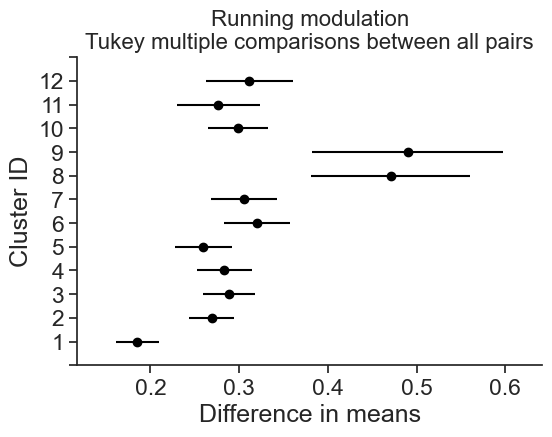

In [ ]:
metric = 'running_modulation_all_images'
metric_name = 'Running modulation'

figsize = (6, 4)
fig, ax = plt.subplots(figsize=figsize)

# Plot the results in a grid
fig = tukey_results.plot_simultaneous(ylabel='Cluster ID', xlabel='Difference in means', 
                                figsize=figsize, ax=ax,)# comparison_name=12)

ax.set_title(metric_name+'\nTukey multiple comparisons between all pairs', fontsize=16)


12


<AxesSubplot:title={'center':'Image selectivity'}, xlabel='Lifetime sparseness', ylabel='Cluster ID'>

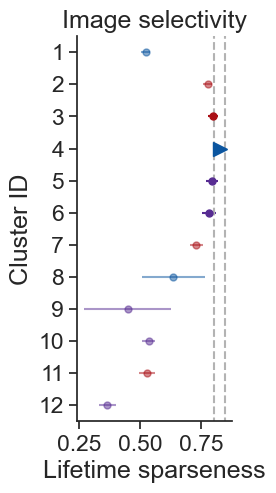

In [ ]:
# Plot image selectivity for preferred experience level 
# And color points by that experience level 

metric = 'lifetime_sparseness_images'
xlabel = 'Lifetime sparseness'
title = 'Image selectivity'
group_to_compare = 4

plotting.plot_tukey_diff_in_means_for_metric(response_metrics, metric, title=title, xlabel=xlabel, group_to_compare=group_to_compare, pref_exp_level=True)

12
8


c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\matplotlib\axes\_base.py:2283: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


10


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Image selectivity'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

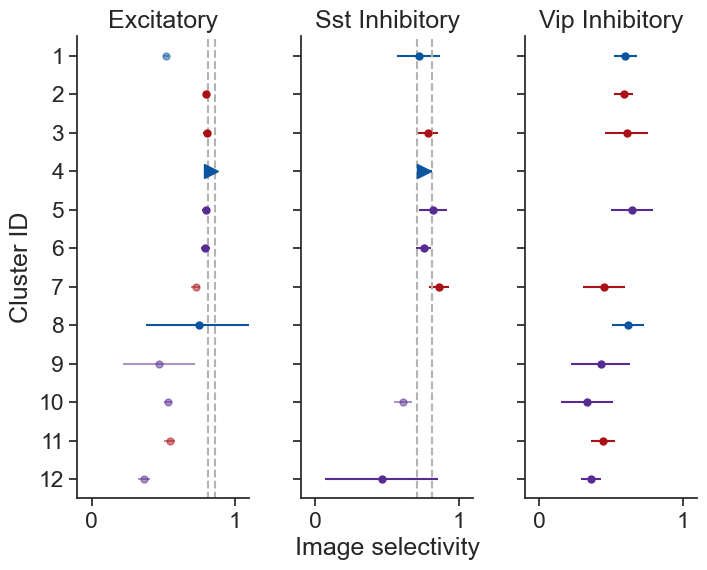

In [ ]:

metric = 'lifetime_sparseness_images'
title = 'Image selectivity'
xlabel = 'Image selectivity'
group_to_compare = 4

plotting.plot_tukey_diff_in_means_for_metric(response_metrics, metric, title=title, xlabel=xlabel, lims=(-0.1, 1.1),
                                             group_to_compare=group_to_compare, pref_exp_level=True, split_by_cre=True)


12
8


c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\matplotlib\axes\_base.py:2283: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


10


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Image selectivity'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

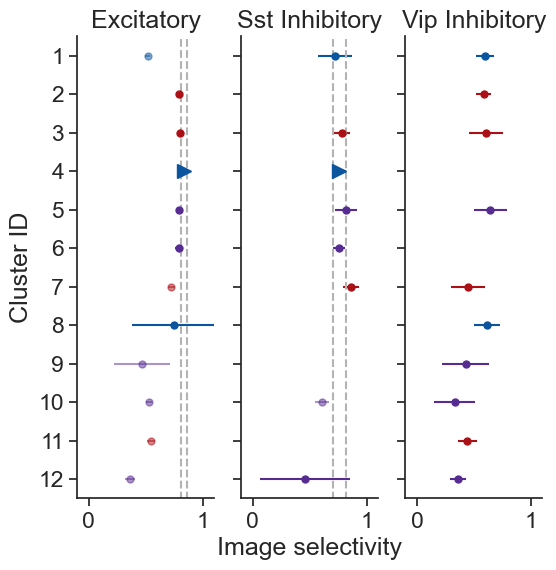

In [ ]:

metric = 'lifetime_sparseness_images'
title = 'Image selectivity'
xlabel = 'Image selectivity'
group_to_compare = 4

plotting.plot_tukey_diff_in_means_for_metric(response_metrics, metric, horiz=False, lims=(-0.1, 1.1),
                                    title=title, xlabel=xlabel, group_to_compare=group_to_compare, 
                                    pref_exp_level=True, split_by_cre=True)


12
8


c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\matplotlib\axes\_base.py:2283: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


10


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Running modulation'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

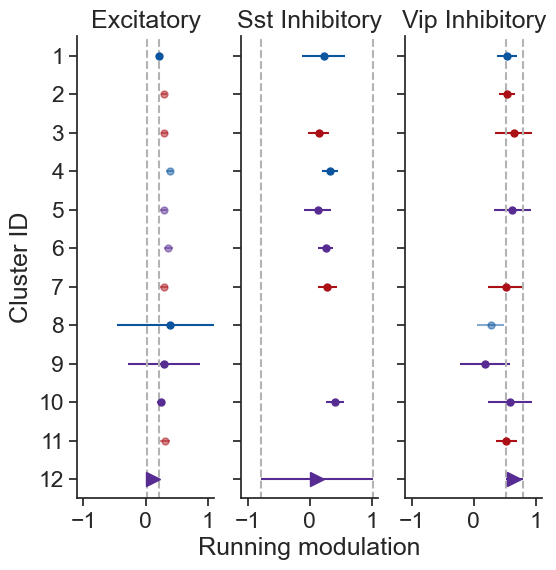

In [ ]:

metric = 'running_modulation_all_images'
title = 'Running modulation'
xlabel = 'Running modulation'

group_to_compare = 12

plotting.plot_tukey_diff_in_means_for_metric(response_metrics, metric, horiz=False, lims=(-1.1, 1.1),
                                    title=title, xlabel=xlabel, group_to_compare=group_to_compare, 
                                    pref_exp_level=True, split_by_cre=True)


12
8


c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\matplotlib\axes\_base.py:2283: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


10


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Omission modulation'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

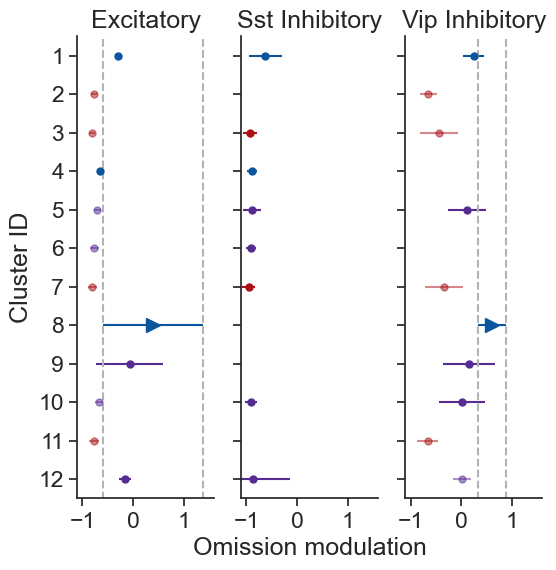

In [ ]:

metric = 'omission_modulation_index'
title = 'Omission modulation'
xlabel = 'Omission modulation'

group_to_compare = 8

plotting.plot_tukey_diff_in_means_for_metric(response_metrics, metric, horiz=False, lims=(-1.1, 1.6),
                                    title=title, xlabel=xlabel, group_to_compare=group_to_compare, 
                                    pref_exp_level=True, split_by_cre=True, save_dir=save_dir)


12
8


c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\matplotlib\axes\_base.py:2283: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


10


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Change modulation'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

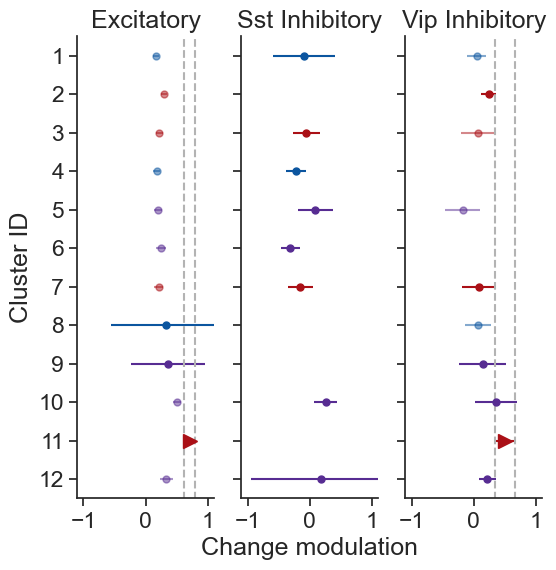

In [ ]:

metric = 'change_modulation_index'
title = 'Change modulation'
xlabel = 'Change modulation'

group_to_compare = 11

plotting.plot_tukey_diff_in_means_for_metric(response_metrics, metric, horiz=False, lims=(-1.1, 1.1),
                                    title=title, xlabel=xlabel, group_to_compare=group_to_compare, 
                                    pref_exp_level=True, split_by_cre=True)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:588: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if cre_line is 'all':


12
8


c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\matplotlib\axes\_base.py:2283: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


10


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Choice modulation'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

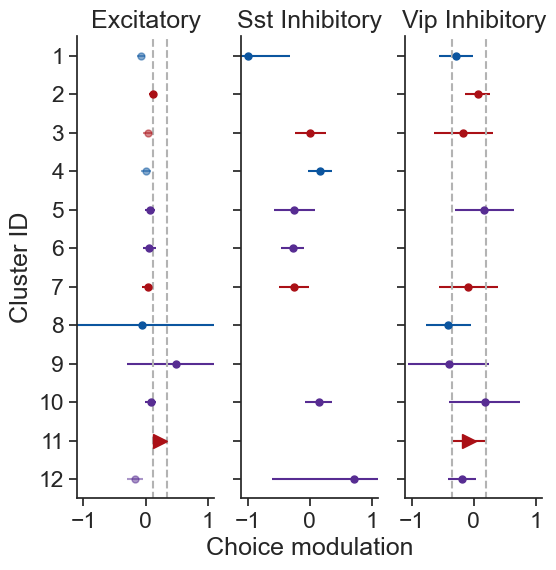

In [ ]:

metric = 'hit_miss_index'
title = 'Choice modulation'
xlabel = 'Choice modulation'

group_to_compare = 11

plotting.plot_tukey_diff_in_means_for_metric(response_metrics, metric, horiz=False, lims=(-1.1, 1.1),
                                    title=title, xlabel=xlabel, group_to_compare=group_to_compare, 
                                    pref_exp_level=True, split_by_cre=True)

12
8


c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\matplotlib\axes\_base.py:2283: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


10


array([<AxesSubplot:title={'center':'Excitatory'}, xlabel='Cluster ID', ylabel='Response reliability\n(preferred image)'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Cluster ID'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}, xlabel='Cluster ID'>],
      dtype=object)

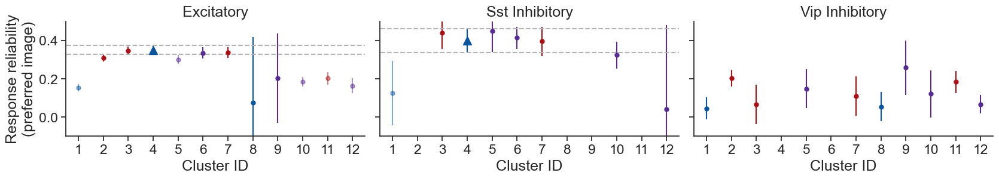

In [ ]:

metric = 'reliability_pref_image'
title = 'Reliability'
xlabel = 'Response reliability\n(preferred image)'

group_to_compare = 4

plotting.plot_tukey_diff_in_means_for_metric(response_metrics, metric, horiz=True, lims=(-0.1, 0.5),
                                    title=title, xlabel=xlabel, group_to_compare=group_to_compare, 
                                    pref_exp_level=True, split_by_cre=True)


In [ ]:

# metric = 'reliability_changes'
# title = 'Reliability'
# xlabel = 'Response reliability\n(image changes)'

# group_to_compare = 4

# plotting.plot_tukey_diff_in_means_for_metric(response_metrics, metric, horiz=True, lims=(-0.1, 0.6),
#                                     title=title, xlabel=xlabel, group_to_compare=group_to_compare, 
#                                     pref_exp_level=True, split_by_cre=True)

#### Different plot format

12


<AxesSubplot:title={'center':'Image selectivity\n(pref. exp. level)'}, xlabel='Difference in means', ylabel='Cluster ID'>

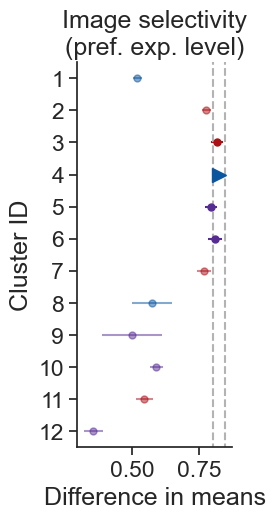

In [ ]:
# Plot image selectivity for preferred experience level 
# And color points by that experience level 

metric = 'lifetime_sparseness_images'
title = 'Image selectivity\n(pref. exp. level)'
group_to_compare = 4

colors = plotting.get_pref_experience_level_colors_for_clusters(response_metrics)

pref_exp_response_metrics = response_metrics[(response_metrics.experience_level==response_metrics.dominant_experience_level)]
response_metrics_clean = pref_exp_response_metrics.dropna(subset=[metric])

multi_comp = MultiComparison(response_metrics_clean[metric], response_metrics_clean['cluster_id'])
tukey_results = multi_comp.tukeyhsd()

plotting.plot_difference_of_means_and_universal_CI(tukey_results, group_to_compare=group_to_compare, 
                                        group_colors=colors, color='k', title=title,
                                        xlabel='Difference in means', ylabel='Cluster ID', ax=None)

### plot selectivity with cre on x axis

c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\matplotlib\axes\_base.py:2283: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


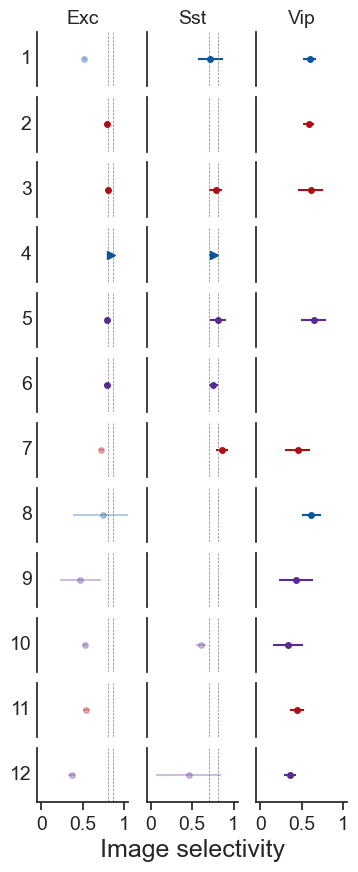

In [ ]:
plotting.plot_diff_of_means_cre_as_col_clusters_as_rows(cluster_meta, response_metrics, metric='lifetime_sparseness_images',
                                                        group_to_compare=4, label='Image selectivity', save_dir=save_dir)
    

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:588: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if cre_line is 'all':
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\dimensionality_reduction\clustering\plotting.py:588: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if cre_line is 'all':


AttributeError: 'NoneType' object has no attribute 'remove'

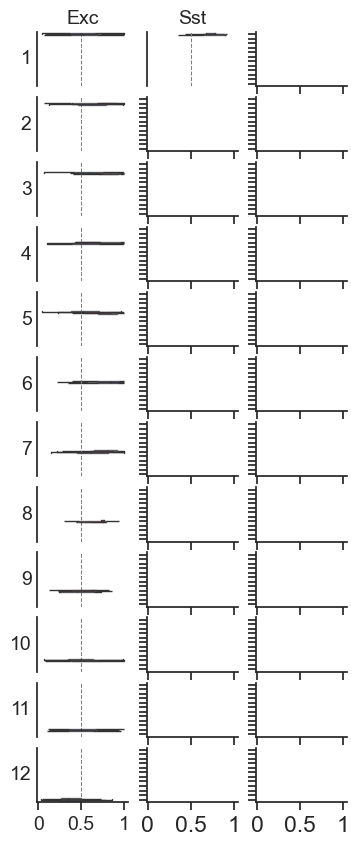

In [ ]:
plotting.plot_cluster_metrics_cre_as_col_clusters_as_rows(cluster_meta, response_metrics, 
                                                          metric='lifetime_sparseness_images',
                                                          label='Image selectivity',save_dir=save_dir);